In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
from wavelets import *
from draws import *
from chaos_searh import *
from BP_dynamics import *
import pywt
plt.rcParams.update({'font.size': 25})

## Определение параметров системы:

In [3]:
Iext = 0.5 # возбуждающий импульс на пирамидальную клетку (P)
G = 0.5 # проводимость мембран -- определяют относительный вклад клетки в динамику ансамбля
Eex = 0 # напряжение на выходной клетке (P) -- для активаторной, возбуждающей клетки
Ein = -5 # напряжение на входной клетке (B) -- для ингибиторной, тормозящей клетки
eps = 0.3 # временной масштаб осцилляций (отношение быстрой переменной к медленной)
a = 0.5 # параметры кинетики суммарного ионного тока u
b = 0.8 # параметры кинетики суммарного ионного тока u
A = 1 # синаптический параметр
vsl = 0.1 # синаптический параметр (открытие синапсов быстрее чем закрытие)


scale = np.linspace(0, 60, 101)

# Решение системы ФХН при фиксированном параметре $Bbp = 0.08$ и изменении $Bpb = 0.04-0.06$

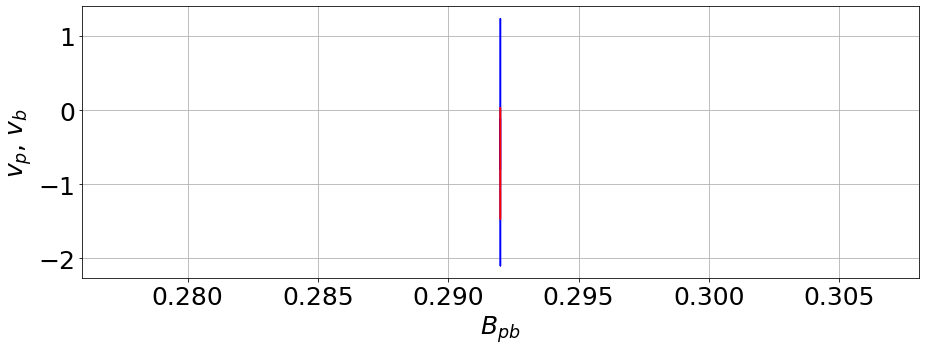

[  101 32768]


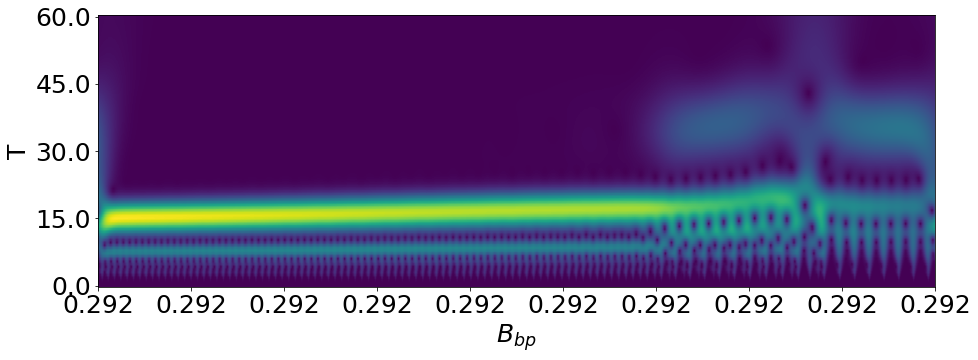

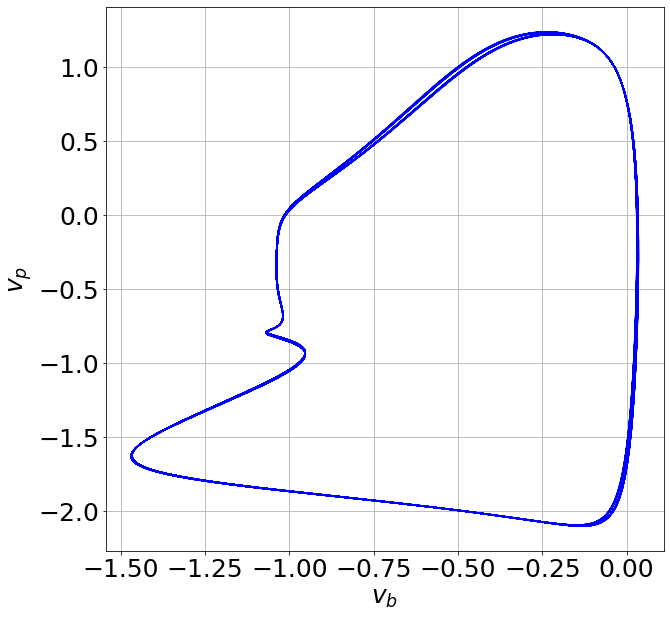

In [6]:
Bbp = 0.08 # синаптический параметр
Bpbmin = 0.292 # синаптический параметр
Bpbmax = 0.292 # синаптический параметр
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

signal_draw2(args2, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=2000, nt=2**15)

wavelet_draw(args2, scale, ts=2000, nt=2**15, Bmin=Bpbmin, Bmax=Bpbmax)

phase_portrait(args2, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=2000, nt=2**15)

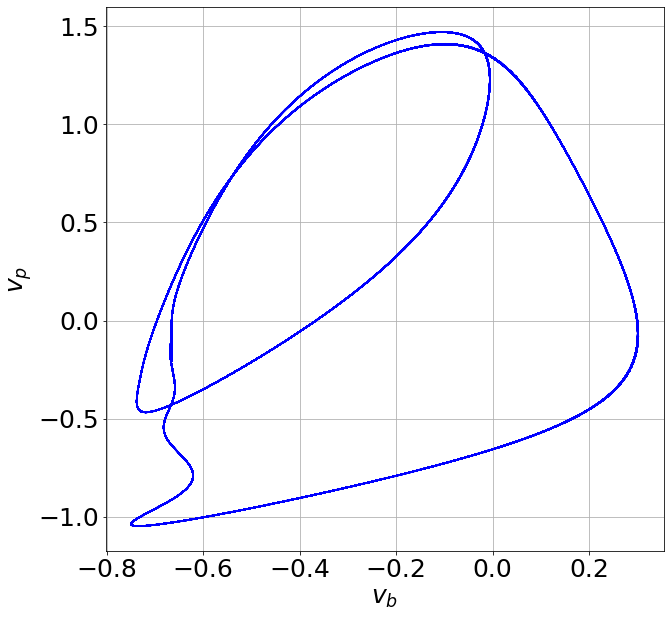

In [694]:
Bbp = 0.08 # синаптический параметр
Bpbmin = 0.67 # синаптический параметр
Bpbmax = 0.67 # синаптический параметр
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

phase_portrait(args2, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=8000, nt=2**15)

Explained variance ratio: 1.0


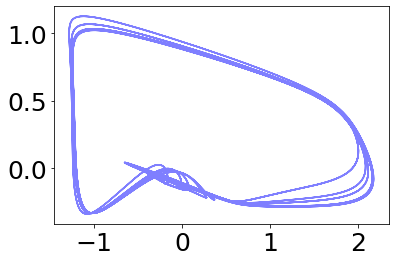

In [203]:
Bbp = 0.08
Bpb = 0.377
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=8000, nt=2**20)
ts = 8000
sol1, t = calcODE(args, *sol[-1], nt=2**15)

V_tn = sol1[:, 0:2]
V_tn.shape

pca = PCA(n_components=2)
pca.fit(V_tn)
print(f'Explained variance ratio: {np.sum(pca.explained_variance_ratio_[:2])}')


X = pca.transform(V_tn[:10000])
# plt.scatter(X[:, 0], X[:, 1], alpha=0.5, c='b')
plt.plot(X[:, 0], X[:, 1], alpha=0.5, c='b')

In [65]:
from sklearn.decomposition import PCA
import ipyvolume as ipv
from mpl_toolkits.mplot3d import Axes3D


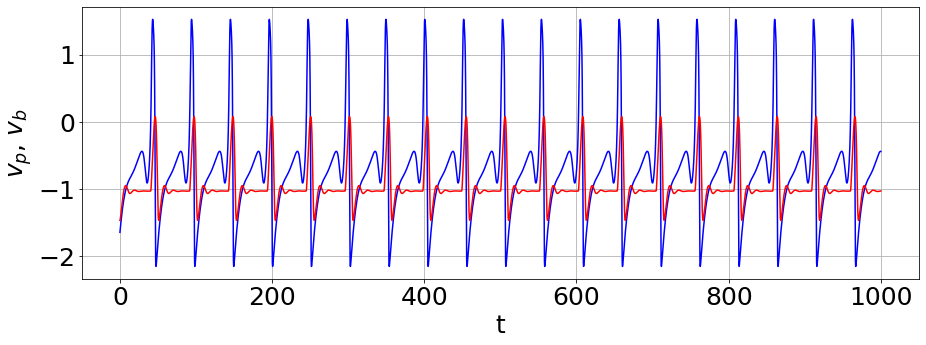

In [747]:
Bbp = 0.08
Bpb = 0.25
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

# sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=8000, nt=2**20)
# ts = 8000
# sol1, t = calcODE(args, *sol[-1], nt=2**15)

signal_draw(args, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=4000, nt=2**20)

# Bpb = 0.45
# args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)


# signal_draw(args, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=2000, nt=2**20)


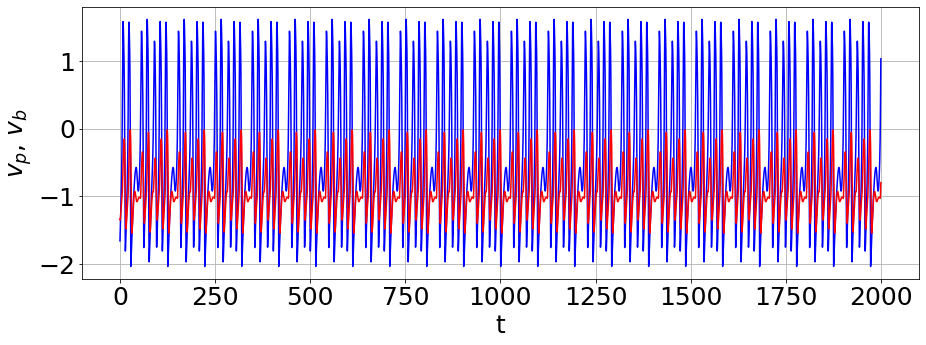

In [724]:
Bbp = 0.08
Bpb = 0.86

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=10000, nt=2**20)
ts = 10000
sol1, t = calcODE(args, *sol[-1], nt=2**15)

signal_draw(args, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=8000, nt=2**20)


Explained variance ratio: 0.9916776594099865


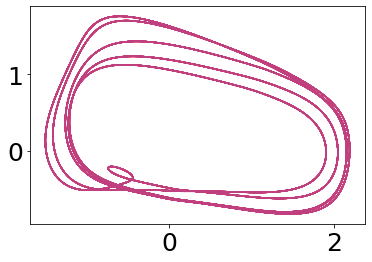

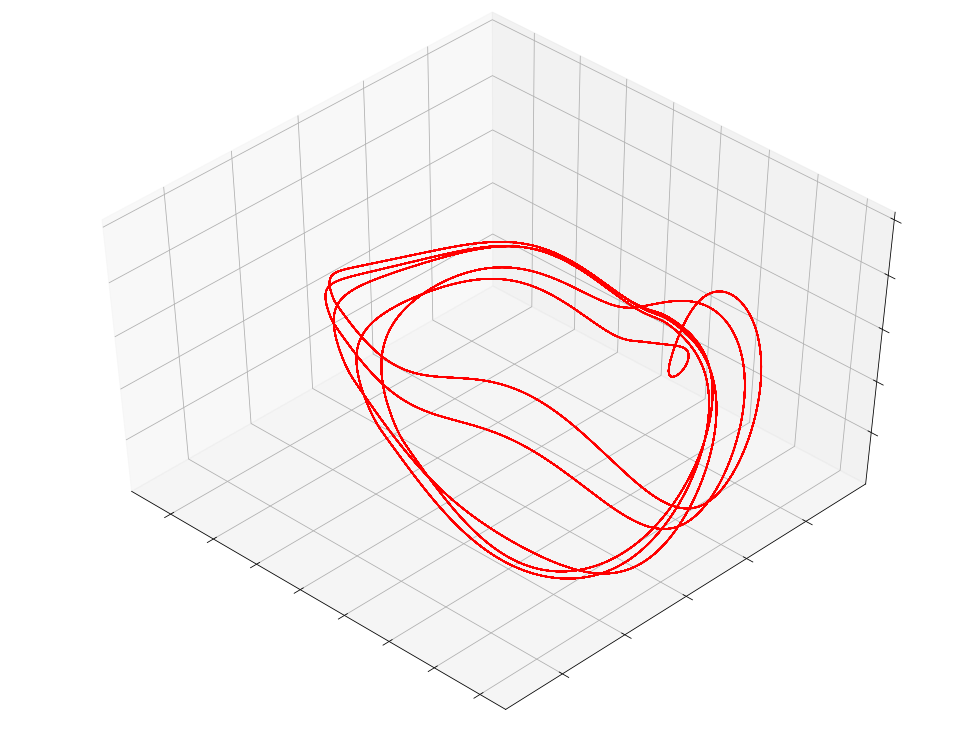

In [725]:
V_tn = sol1
V_tn.shape

pca = PCA(n_components=3)
pca.fit(V_tn)
print(f'Explained variance ratio: {np.sum(pca.explained_variance_ratio_[:3])}')


X = pca.transform(V_tn[:10000])
# plt.scatter(X[:, 0], X[:, 1], alpha=0.5, c='b')
plt.plot(X[:, 0], X[:, 1], alpha=0.5, c='b')


X = pca.transform(V_tn[10000:])
# plt.scatter(X[:, 0], X[:, 1], alpha=0.5, c='b')
plt.plot(X[:, 0], X[:, 1], alpha=0.5, c='r')
plt.show()

fig = plt.figure(1, figsize=(14, 10))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

X = pca.transform(V_tn[:10000])
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], cmap=plt.cm.nipy_spectral,
#            edgecolor='k', c='b')
# ax.plot(X[:, 0], X[:, 1], X[:, 2], c='b')

X = pca.transform(V_tn[10000:])
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], cmap=plt.cm.nipy_spectral,
#            edgecolor='k', c='r')
ax.plot(X[:, 0], X[:, 1], X[:, 2], c='r')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()

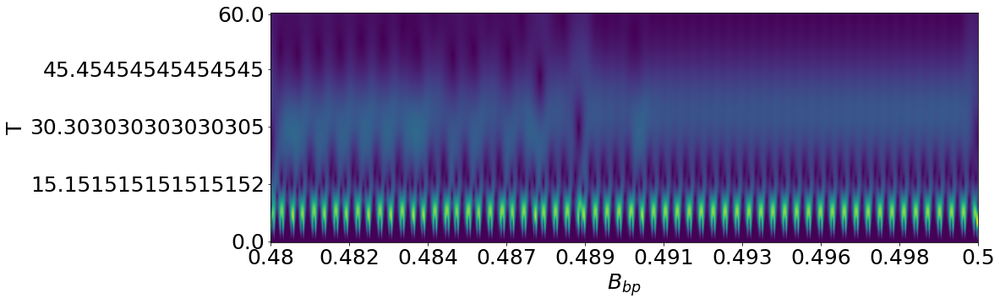

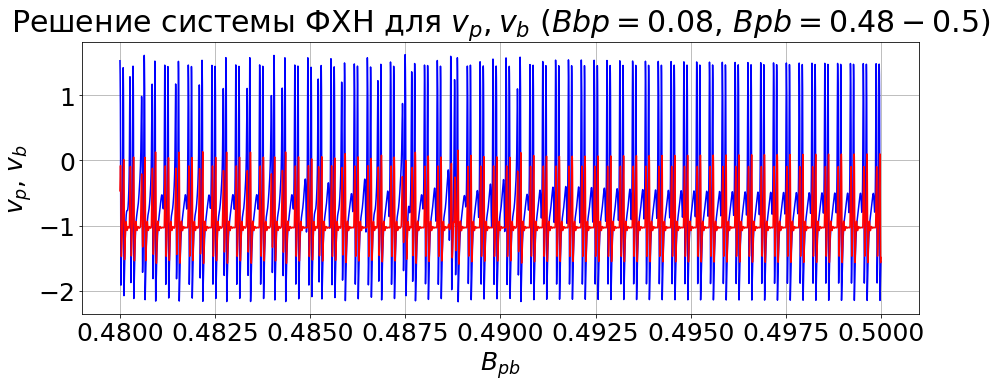

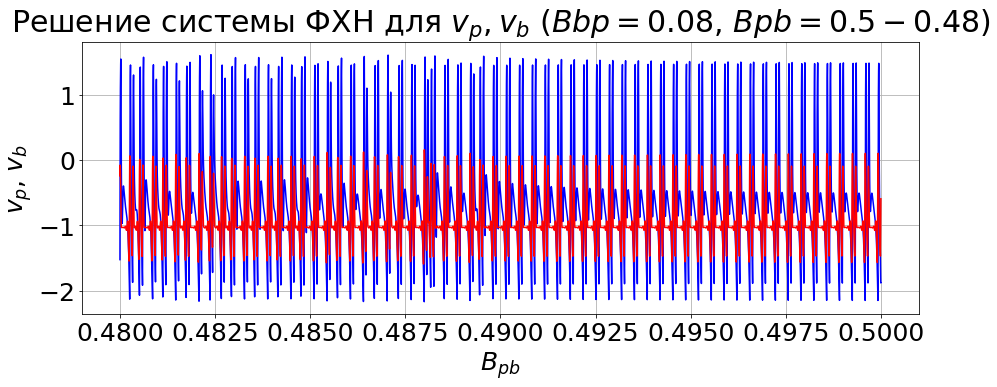

In [575]:
Bbp = 0.08 # синаптический параметр
Bpbmin = 0.48 # синаптический параметр
Bpbmax = 0.5 # синаптический параметр

args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)
wavelet_draw(args2, scale, ts=4000, nt=2**15, Bmin=Bpbmin, Bmax=Bpbmax)
signal_draw2(args2, ts=4000, nt=2**15)

args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmax, Bpbmin, Bbp, vsl)
# wavelet_draw(args2, scale, ts=4000, nt=2**15, Bmin=Bpbmin, Bmax=Bpbmax)
signal_draw2(args2, ts=4000, nt=2**15)


In [762]:
Bbp = 0.08 # синаптический параметр
Bpbmin = 0.32 # синаптический параметр
Bpbmax = 0.55 # синаптический параметр

scale = np.linspace(0, 60, 100)

args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)
directly, initB_d = max_wavelet_bootstrap(args2, scale)

args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmax, Bpbmin, Bbp, vsl)
inverse, init_B_inv = max_wavelet_bootstrap(args2, scale)

(0.5, 0.5, -5, 0, 0.3, 0.5, 0.8, 1, 0.32, 0.55, 0.08, 0.1)
(0.5, 0.5, -5, 0, 0.3, 0.5, 0.8, 1, 0.55, 0.32, 0.08, 0.1)


Text(0, 0.5, 'T')

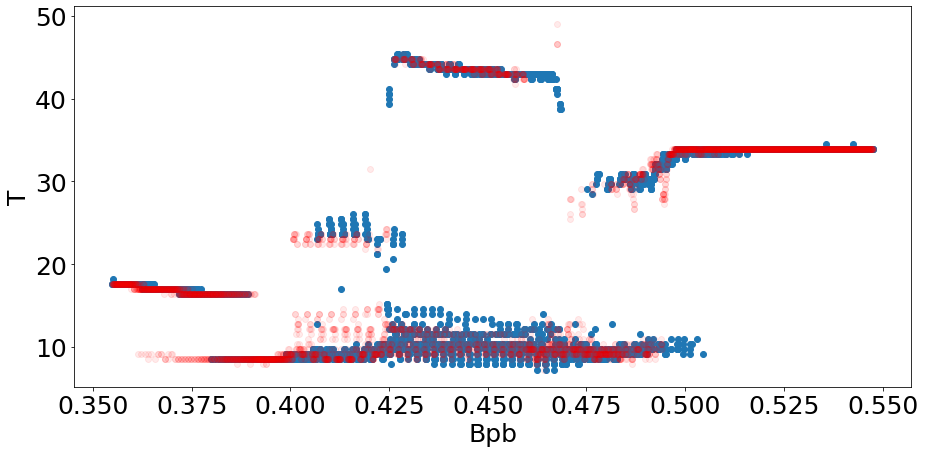

In [763]:
Bpbmin = 0.35 # синаптический параметр
Bpbmax = 0.55 # синаптический параметр


plt.figure(figsize=(15, 7))
plt.scatter(np.linspace(Bpbmin, Bpbmax, len(directly))[100:-50], directly[100:-50])
plt.scatter(np.linspace(Bpbmin, Bpbmax, len(inverse))[100:-50], inverse[::-1][100:-50], alpha=0.08, c='r')
plt.xlabel('Bpb')
plt.ylabel('T')
# plt.title('Петля гистерезиса')

T = 14.390309540918386
Parameters: (1.6067623990912163, 1.0729125623956706)


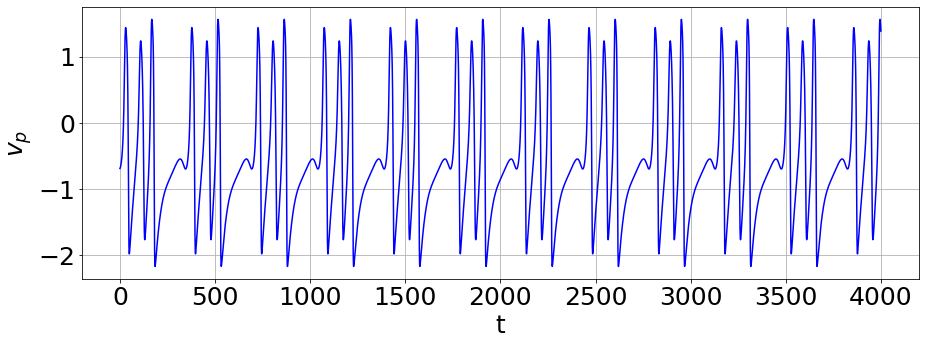

T = 14.390309540918386
Parameters: (-1.2465169967300822, -0.44451948630485605)


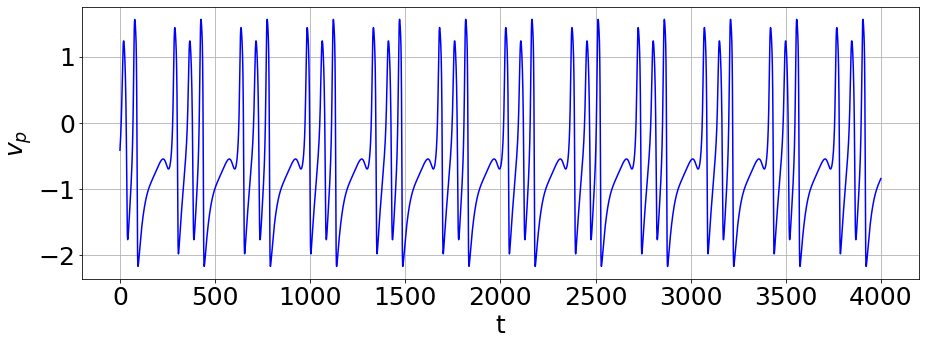

T = 14.390309540918386
Parameters: (0.21665013124906274, 0.6210135083014747)


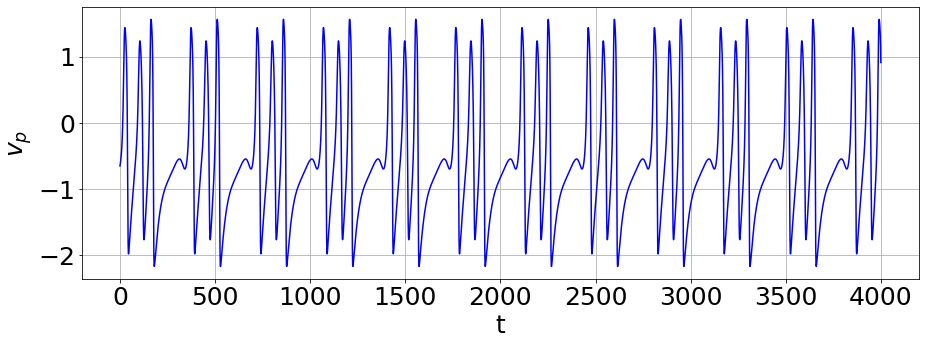

T = 14.390309540918386
Parameters: (1.4051364528566772, -1.4149318032740972)


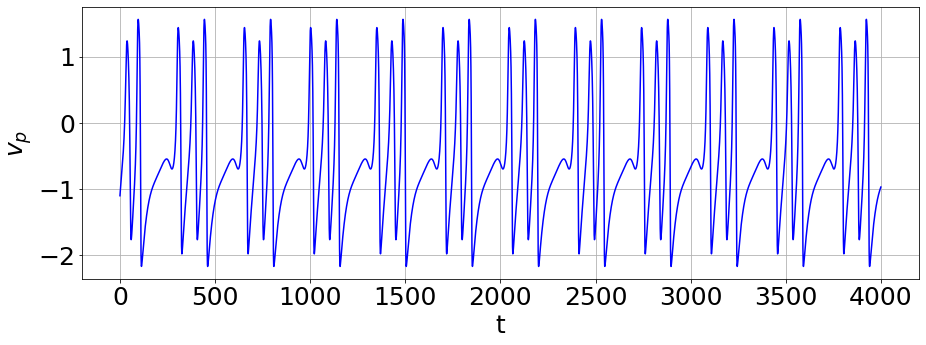

T = 14.390864422908859
Parameters: (0.09023788250014064, -0.22659118093389763)


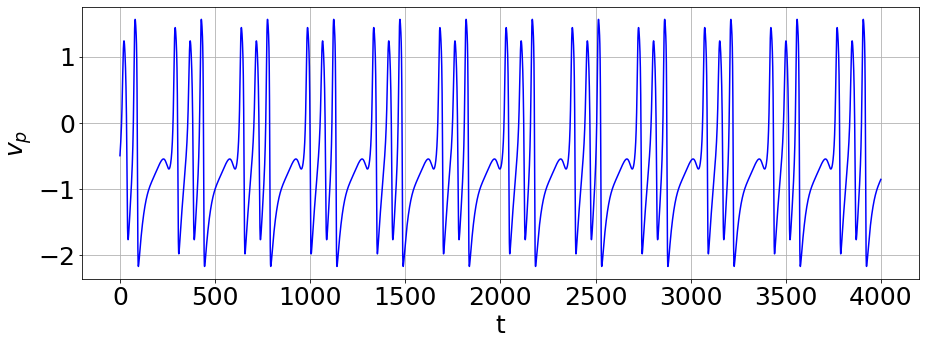

T = 14.390864422908859
Parameters: (-1.8709665320324738, 1.9286808346268645)


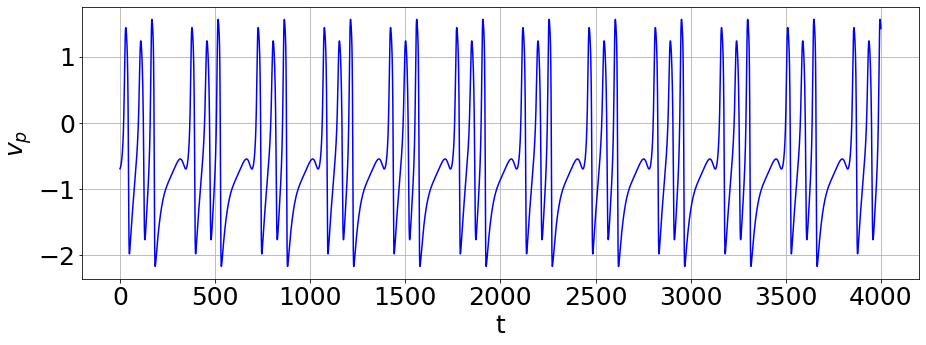

T = 14.390309540918386
Parameters: (-0.9500401457264696, -1.1229571569393473)


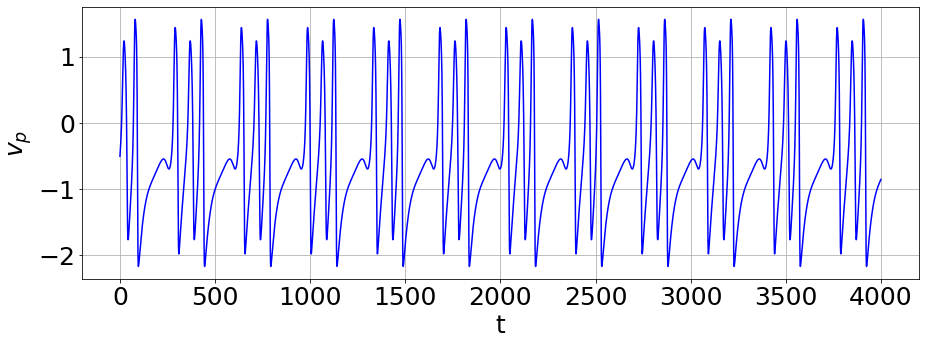

T = 14.390309540918386
Parameters: (1.1771956868212343, 0.36942878136819335)


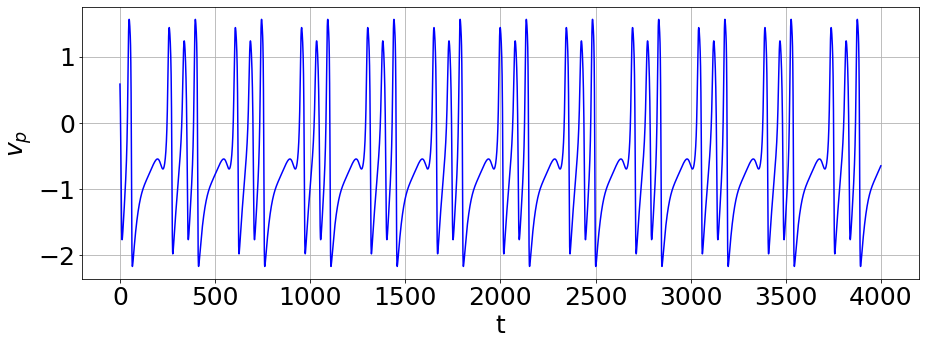

T = 14.390309540918386
Parameters: (1.0706395545839476, 1.4234985629592787)


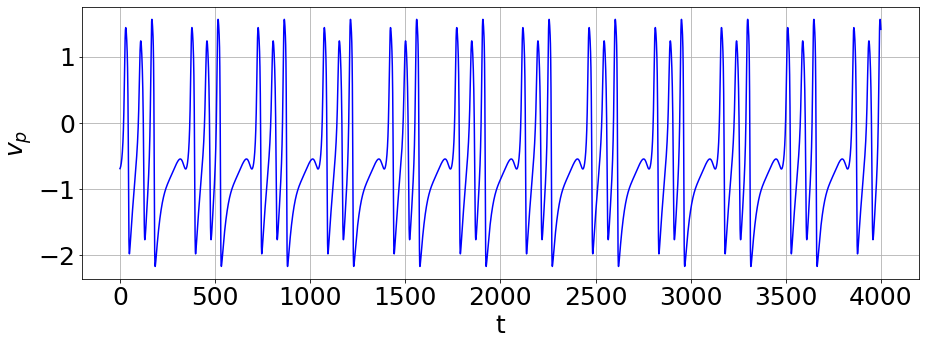

T = 14.390309540918386
Parameters: (-1.522054370170276, -1.507473234646905)


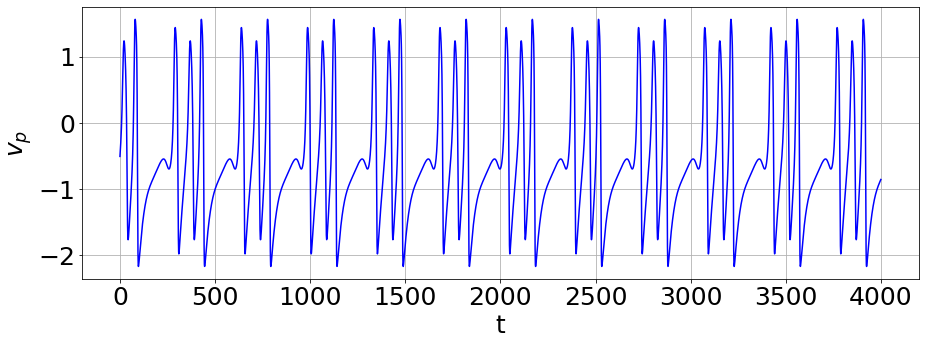

T = 14.390309540918386
Parameters: (-1.2161388899430494, 0.911731871111189)


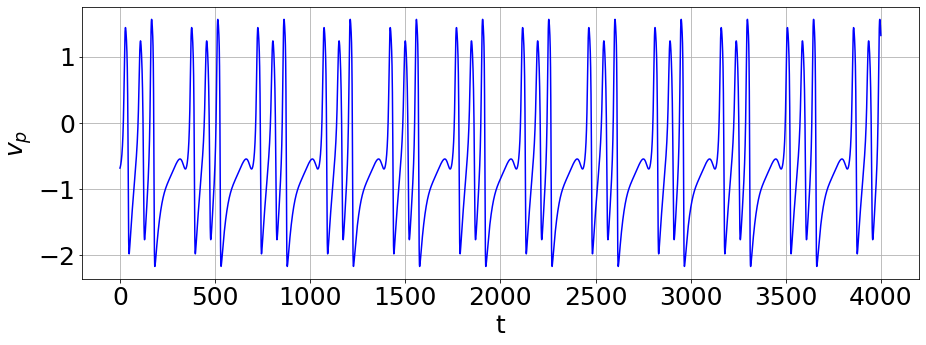

T = 14.390309540918386
Parameters: (0.1366775776918736, 1.4023259914746897)


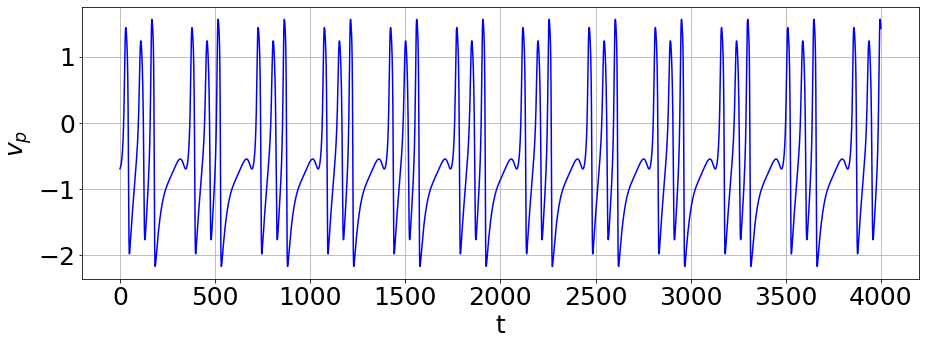

T = 14.390309540918386
Parameters: (-0.08520098664103104, -0.19144982509774255)


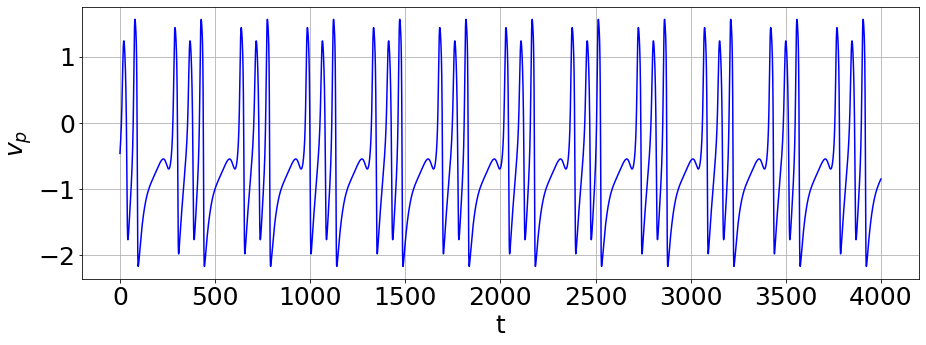

T = 14.390864422908859
Parameters: (-1.3570586423262494, 0.5352614428042166)


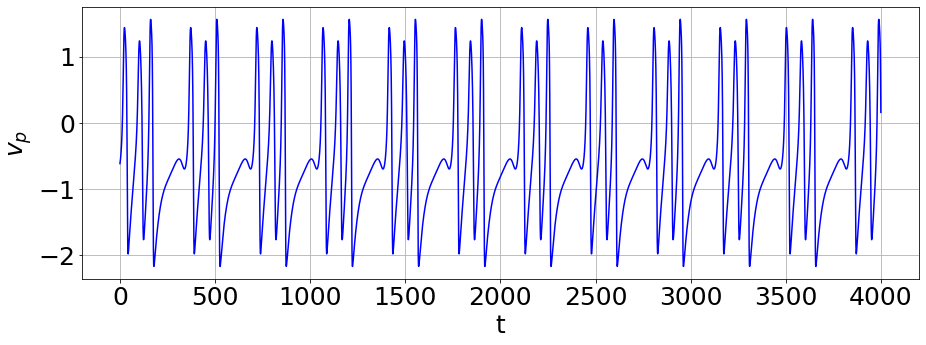

T = 14.390309540918386
Parameters: (0.6852322639341408, 0.9233521105930178)


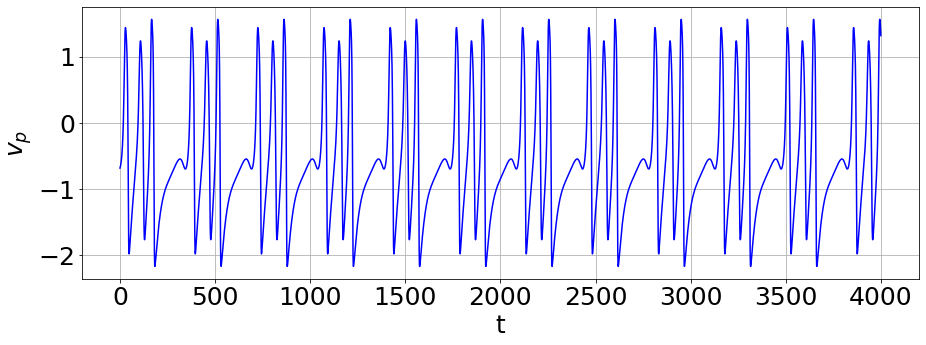

T = 14.390309540918386
Parameters: (-1.0380865849444372, 0.5657401459198188)


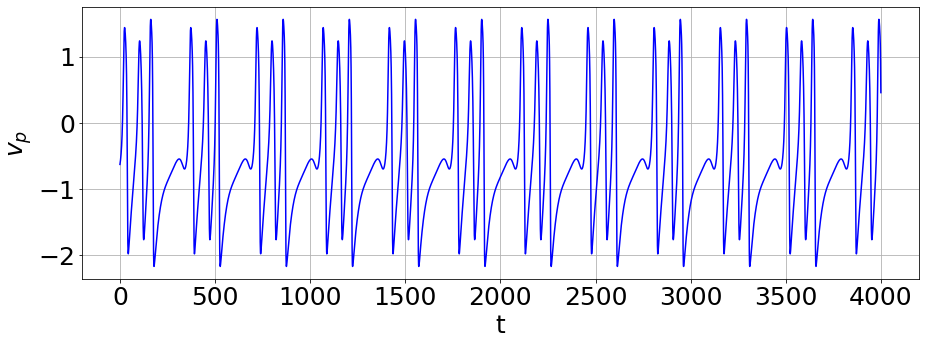

T = 14.390309540918386
Parameters: (1.3599450999470375, -0.29586142725809017)


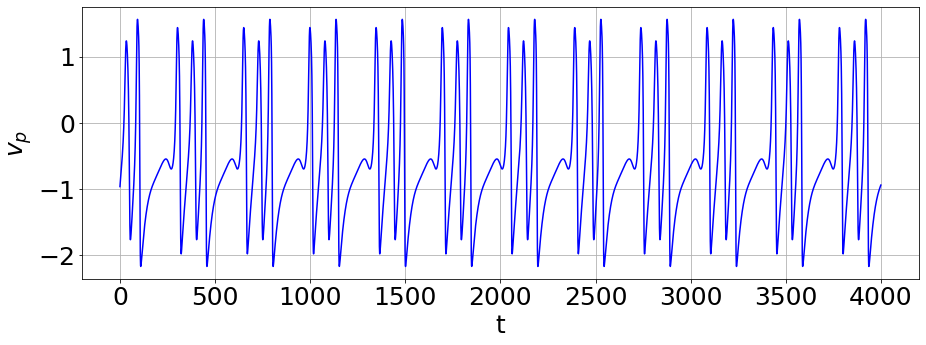

T = 14.390309540918386
Parameters: (1.4281268290429923, -1.6377960562738831)


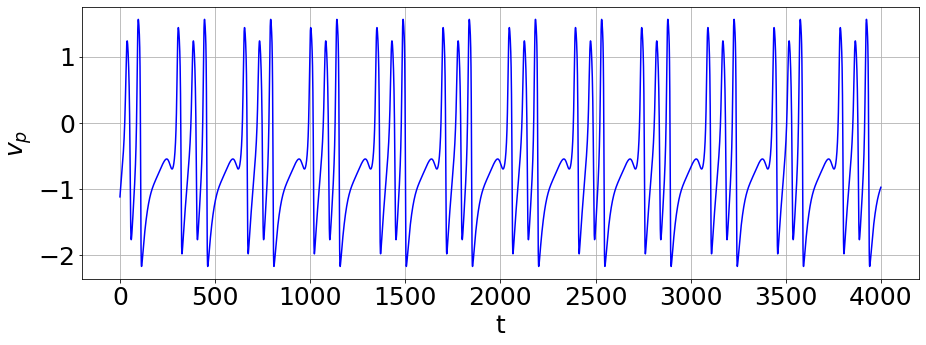

T = 14.390309540918386
Parameters: (-0.03193078268455052, -0.054099236070419554)


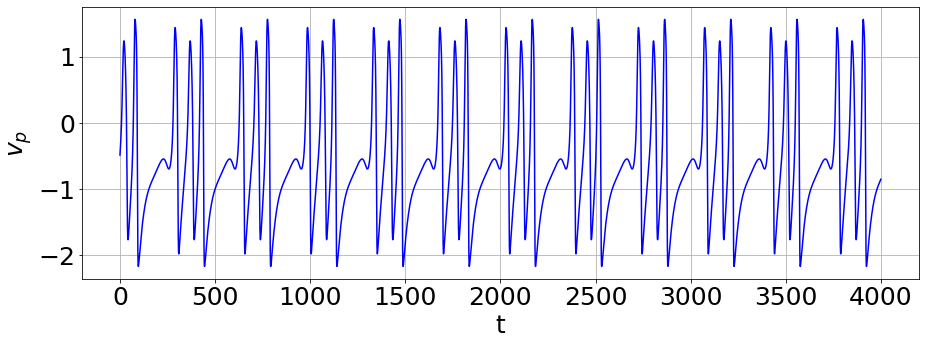

T = 14.390864422908859
Parameters: (1.9697115097871158, 0.23740405318269575)


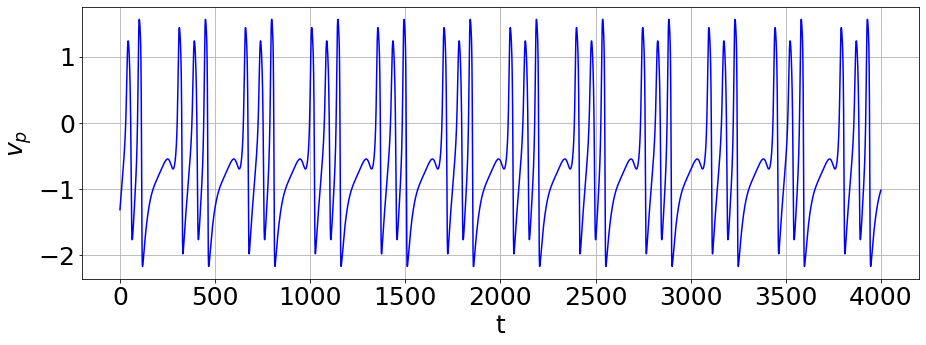

T = 14.39086442290886
Parameters: (-0.9707116070978583, -1.9305485584035242)


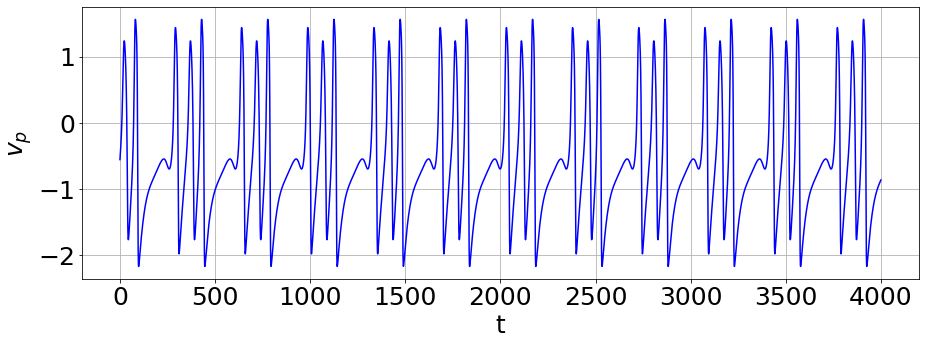

T = 14.390309540918386
Parameters: (0.9895350087652672, 0.4415705492967694)


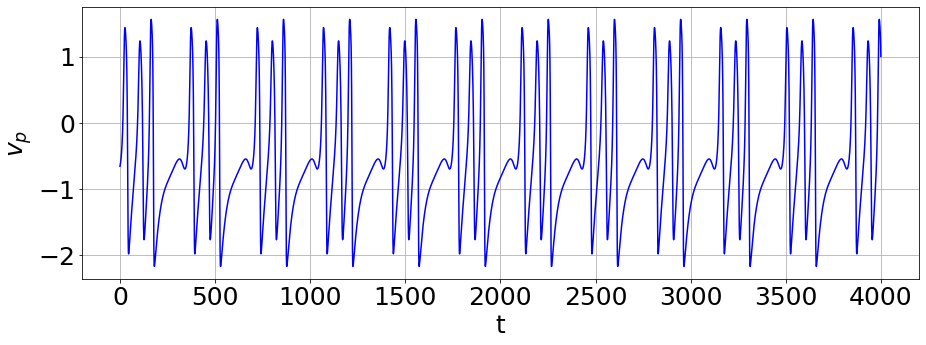

T = 14.390309540918386
Parameters: (0.10311370644767015, 1.4671149438224655)


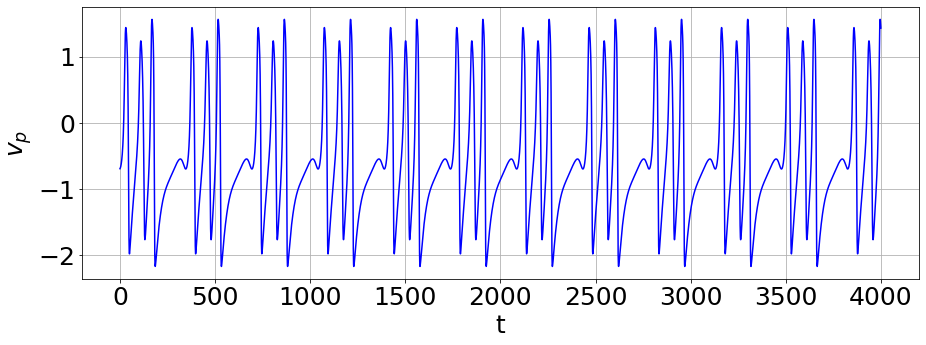

T = 14.390309540918386
Parameters: (-1.4548990545085414, -0.9367141608295877)


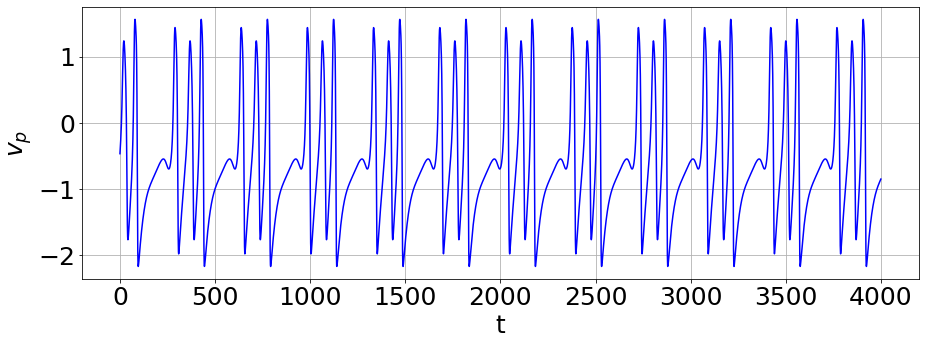

T = 14.390864422908859
Parameters: (-1.6380473144235572, 1.7630209341579617)


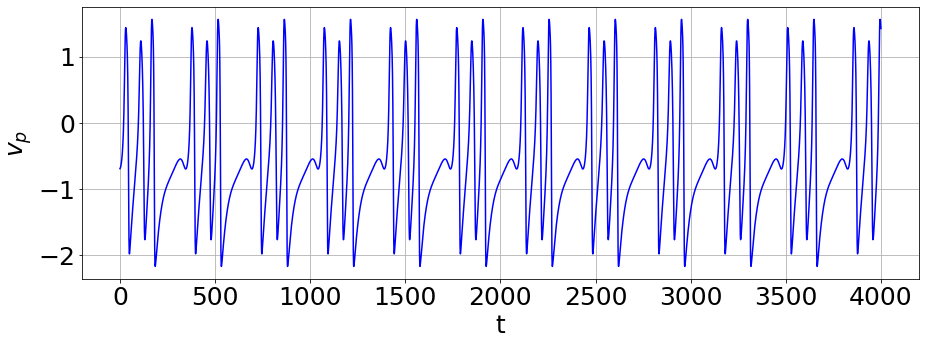

T = 14.390864422908859
Parameters: (-0.5303044663588175, 0.3175713812825469)


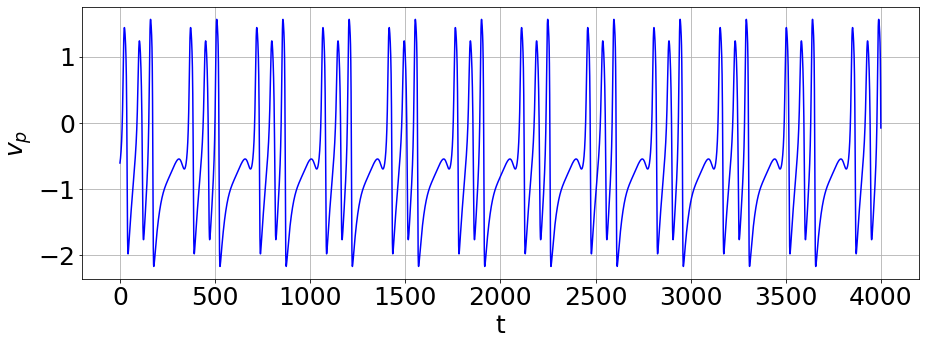

T = 14.390309540918386
Parameters: (-1.0722693732579032, 0.8487344076695935)


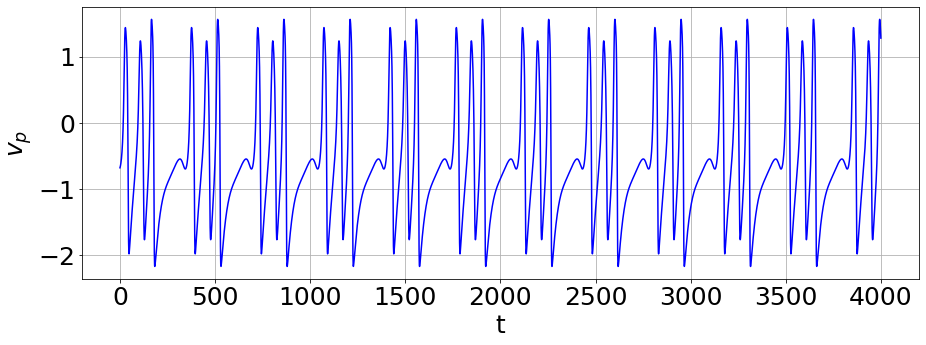

T = 14.390309540918386
Parameters: (-1.437700644431525, -0.3396905795883969)


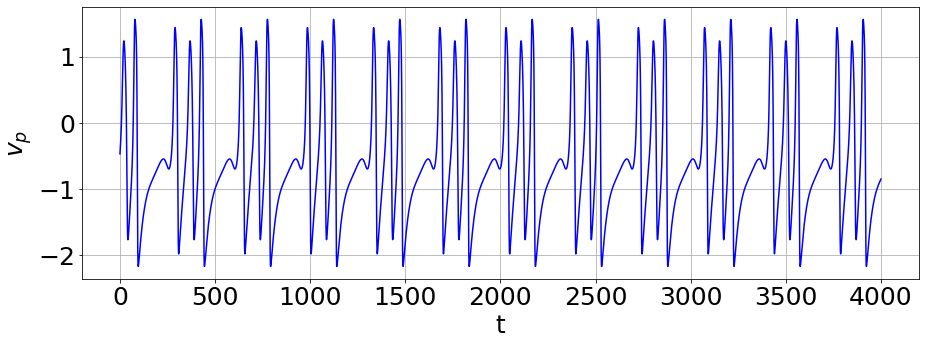

T = 14.390309540918386
Parameters: (1.7821523221018558, 0.5772356473391054)


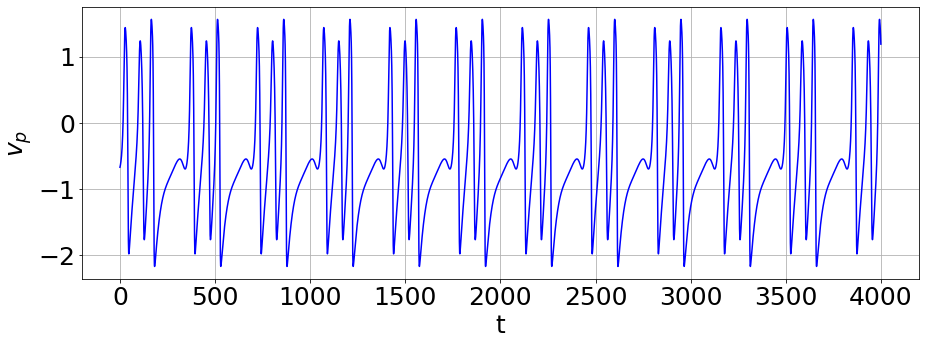

T = 14.390309540918388
Parameters: (-1.0229014039890152, 0.08914119273712906)


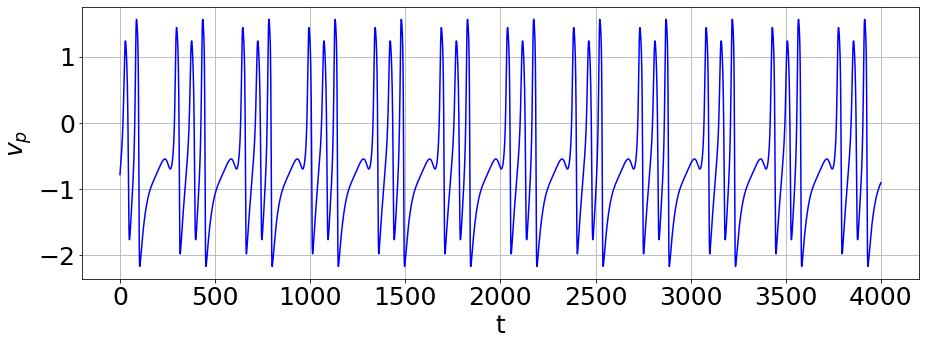

T = 14.390864422908859
Parameters: (-1.02355897036065, 1.427374826474705)


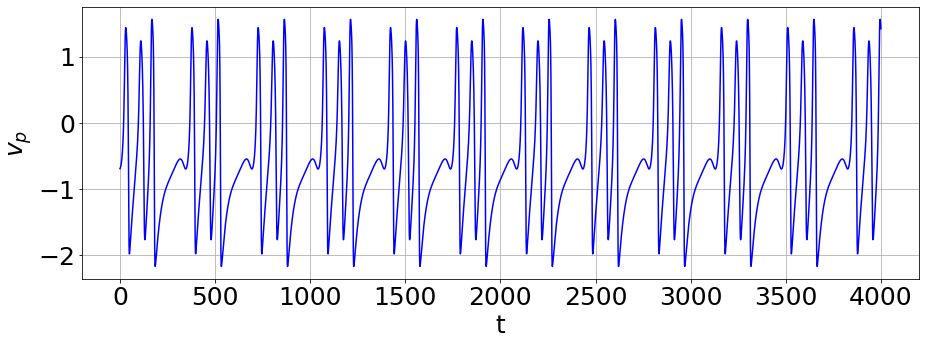

T = 14.390309540918386
Parameters: (0.8517261206529851, 0.6846064258180591)


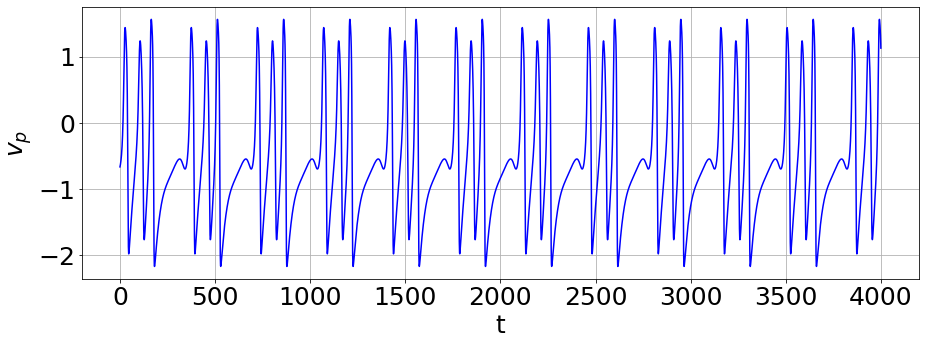

T = 14.390309540918386
Parameters: (-0.08052926270012462, 1.8608413982036476)


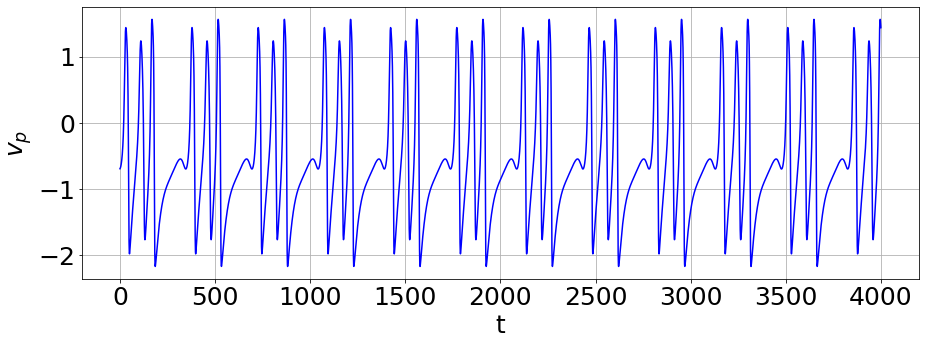

T = 14.390309540918386
Parameters: (1.9563938531700216, -1.9666052408715027)


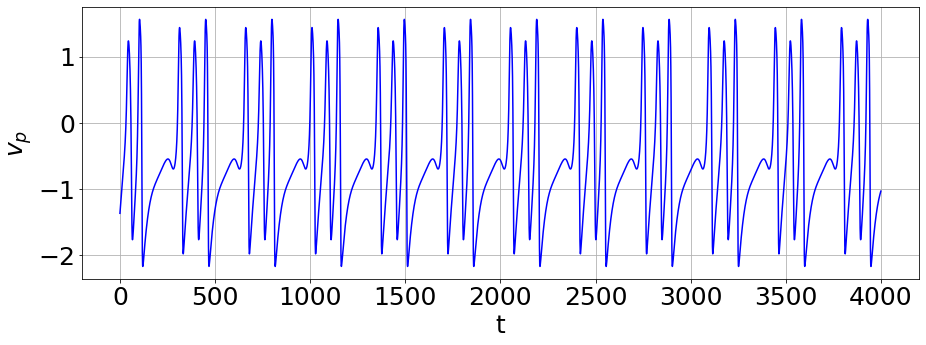

T = 14.390309540918386
Parameters: (-1.5456617062268685, 0.7582166851378864)


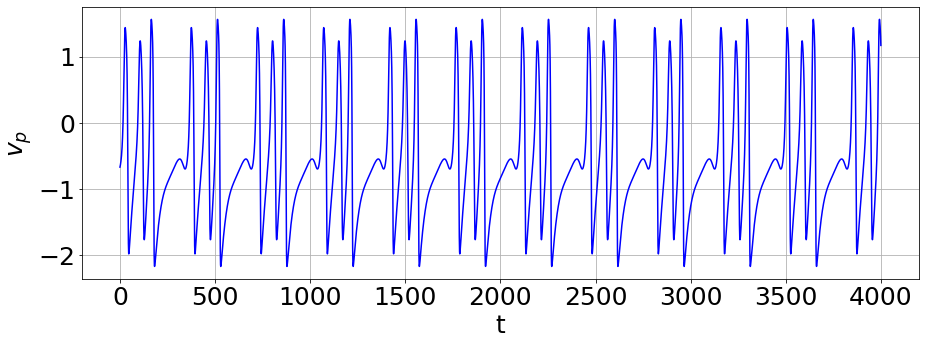

T = 14.390309540918386
Parameters: (0.7245209407821576, -0.31973298876673617)


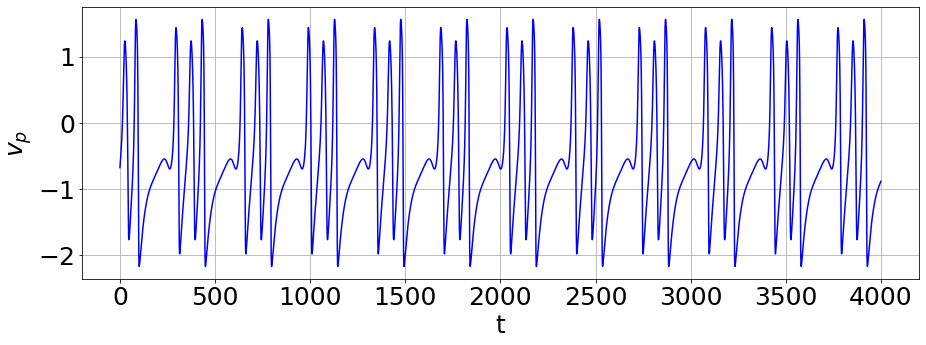

T = 14.390309540918386
Parameters: (-1.4958585487364693, 1.7538063517581586)


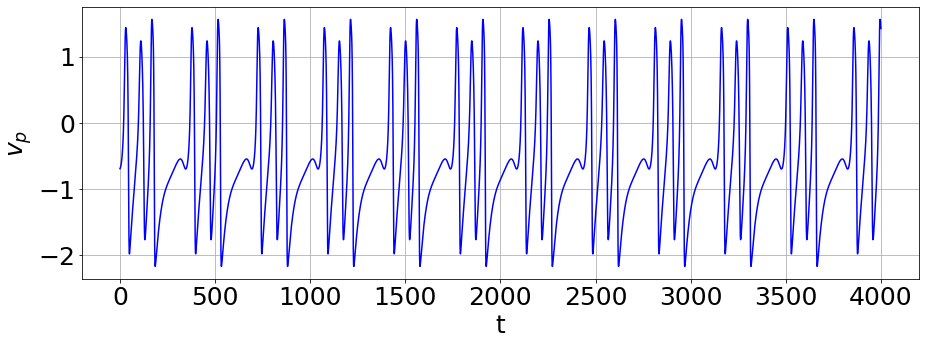

T = 14.390864422908859
Parameters: (-0.9002650933959795, -0.5793837322277238)


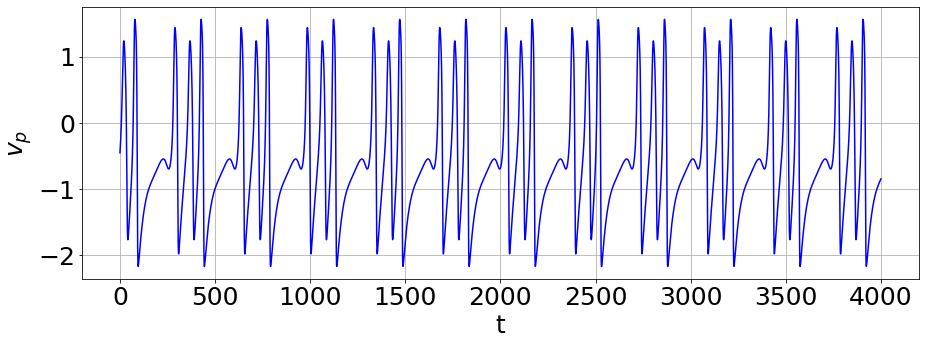

T = 14.390864422908859
Parameters: (1.1258970238403445, 0.5133836830341081)


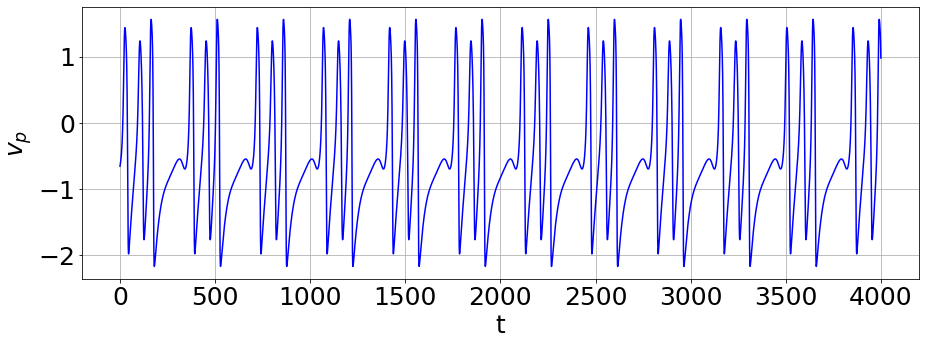

T = 14.390864422908859
Parameters: (1.6625437734869073, -1.6032996619906181)


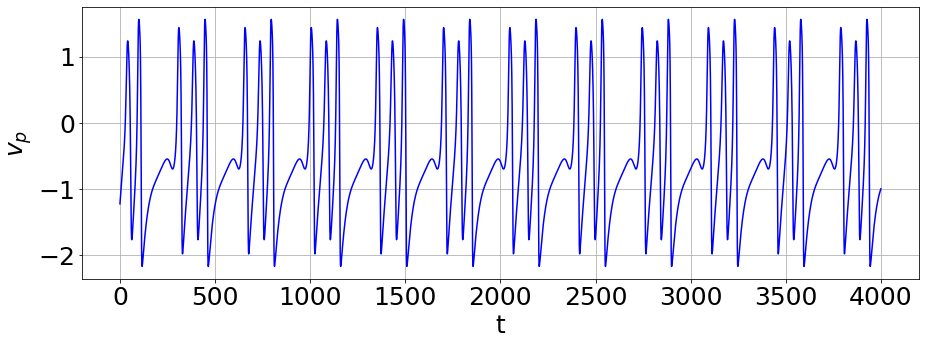

T = 14.390309540918386
Parameters: (1.887027740907964, -1.0070343689111025)


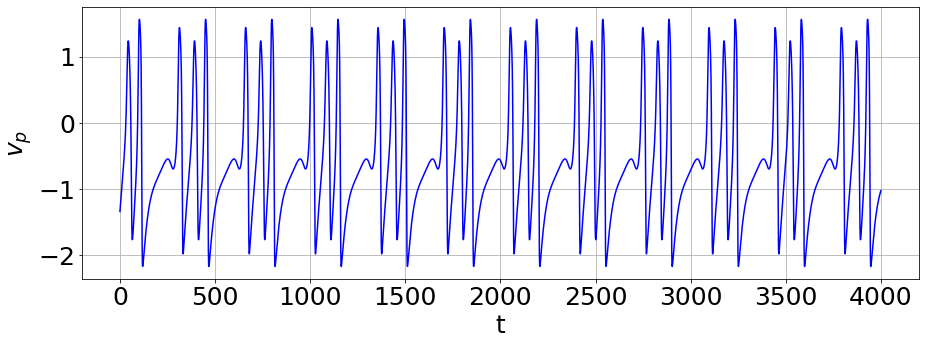

T = 14.39086442290886
Parameters: (0.9335348726850721, -1.3429921637292814)


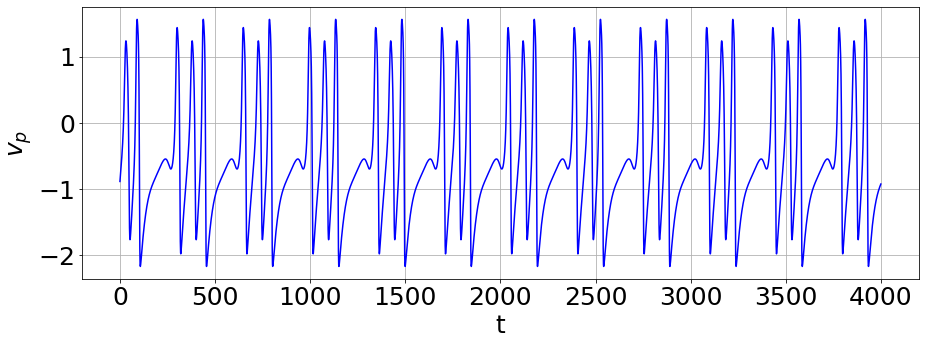

T = 14.390864422908859
Parameters: (-1.0321694839699234, -1.940877550789026)


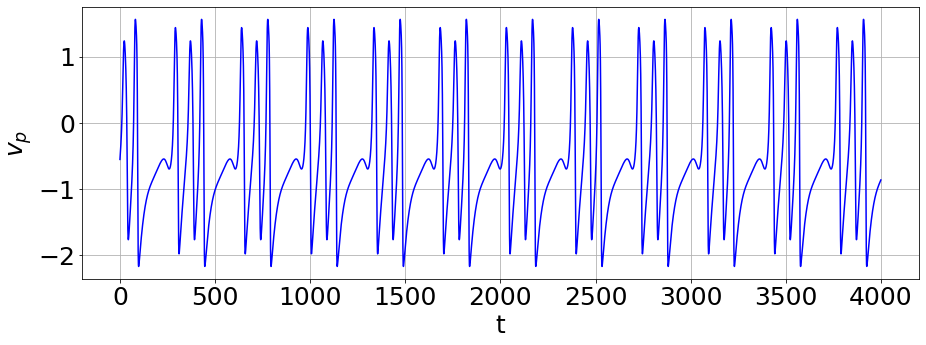

T = 14.390309540918386
Parameters: (-1.1799883170562055, -0.25331640404678746)


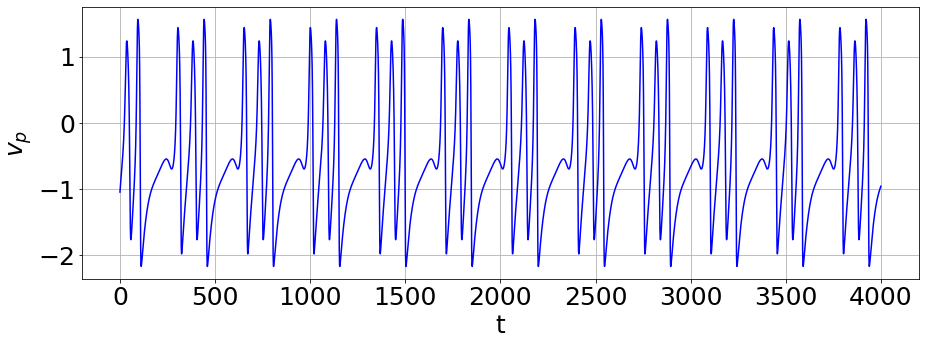

T = 14.390309540918388
Parameters: (-0.8941666675952367, -1.9209403079303695)


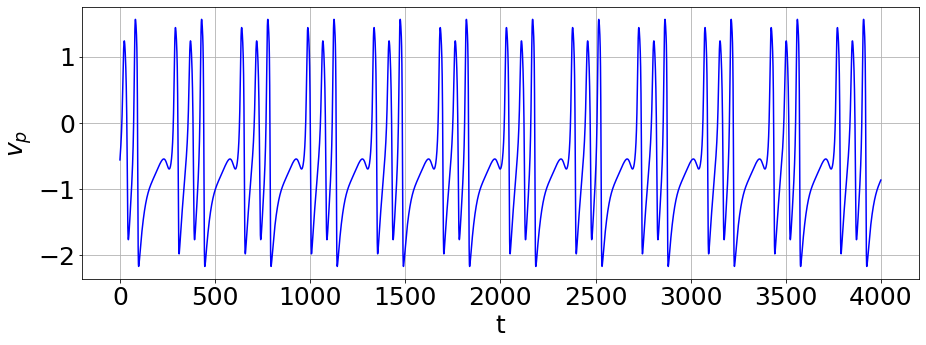

T = 14.390309540918386
Parameters: (-0.31747001260632457, -1.0627367453600414)


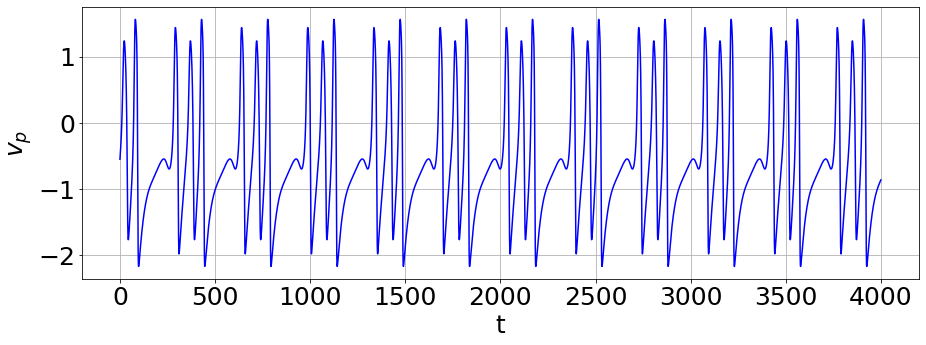

T = 14.390309540918386
Parameters: (1.9694055446139034, 0.8708869750562398)


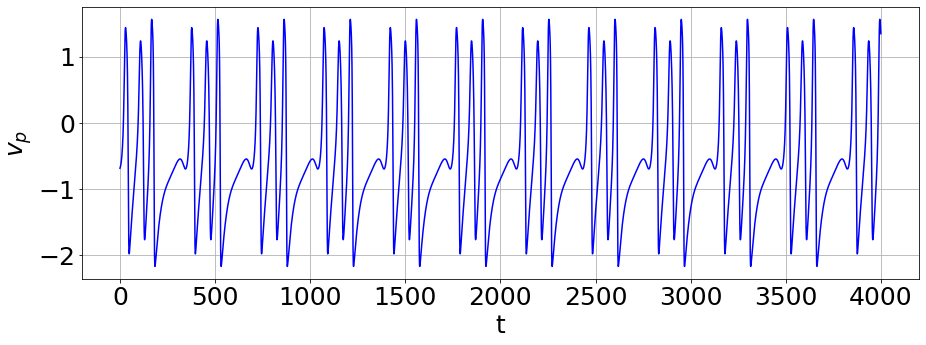

T = 14.390309540918386
Parameters: (1.92499236586373, 1.509285636022549)


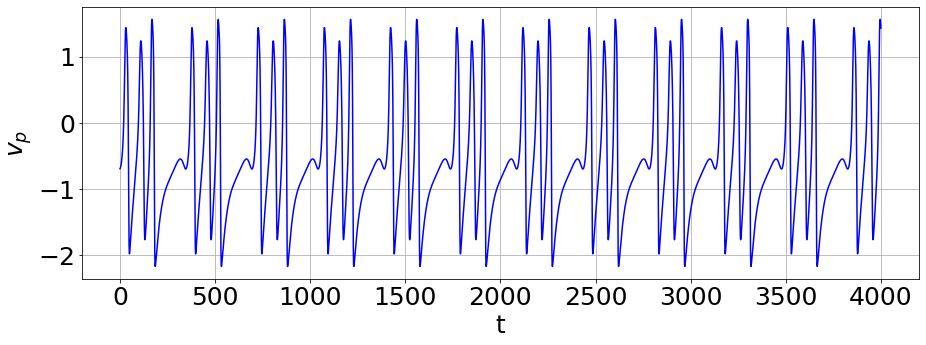

T = 14.390864422908859
Parameters: (1.7377314278677396, -0.32683535292502786)


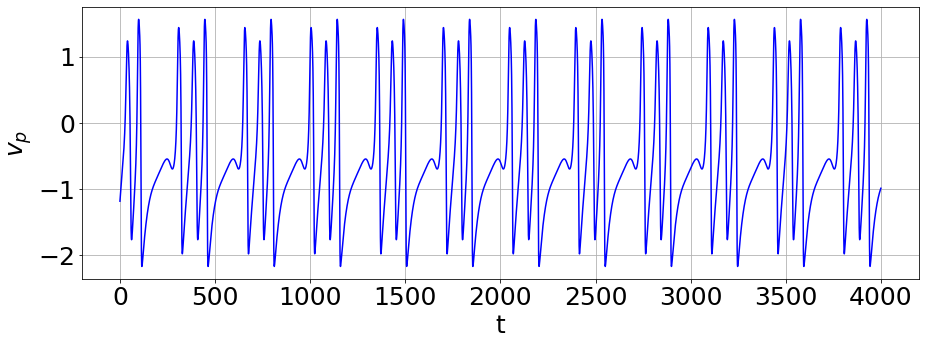

T = 14.390309540918386
Parameters: (-0.3949345721037574, 0.9484202966477704)


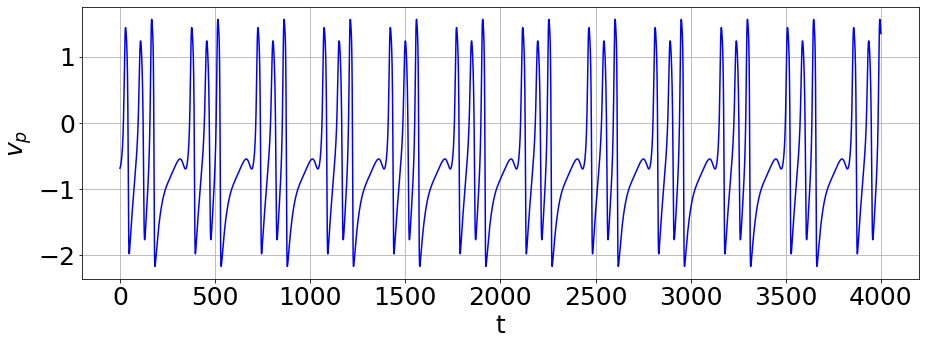

T = 14.390864422908859
Parameters: (-1.047212440528742, 1.4621158934182676)


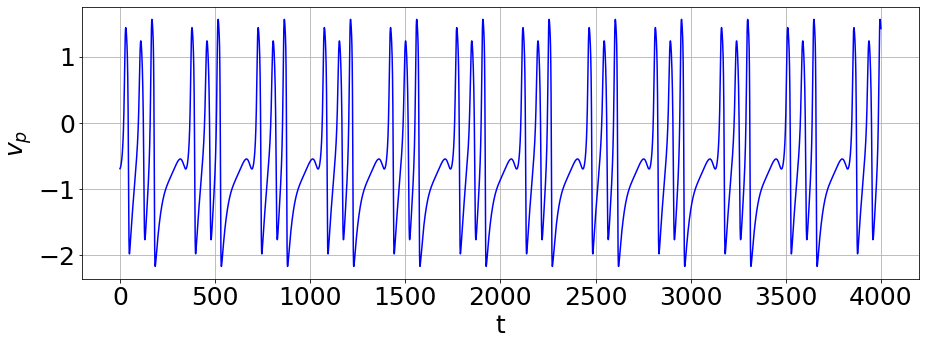

T = 14.390309540918386
Parameters: (-0.4159564045584778, 1.685723033395976)


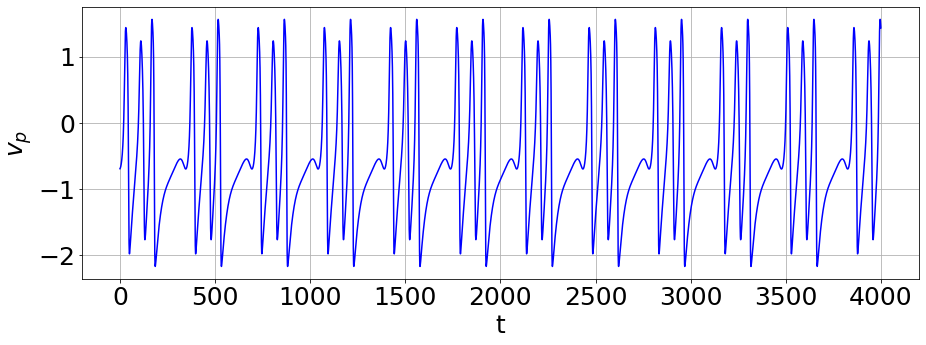

T = 14.390309540918386
Parameters: (-1.2314986682948637, -1.2144241365792512)


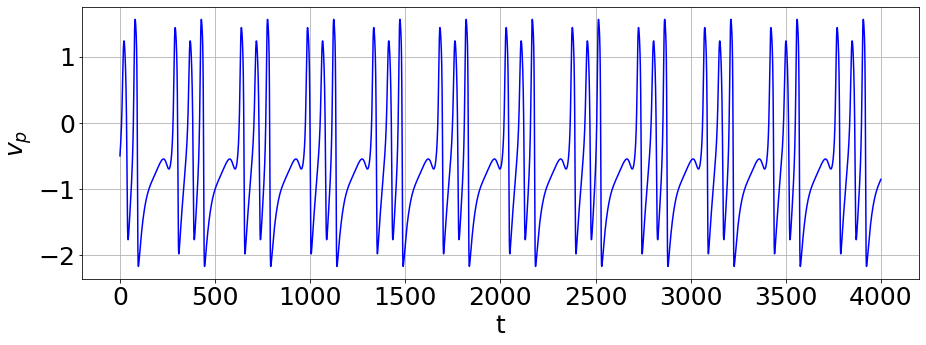

T = 14.390309540918386
Parameters: (1.7107146735066268, -1.9153466881255201)


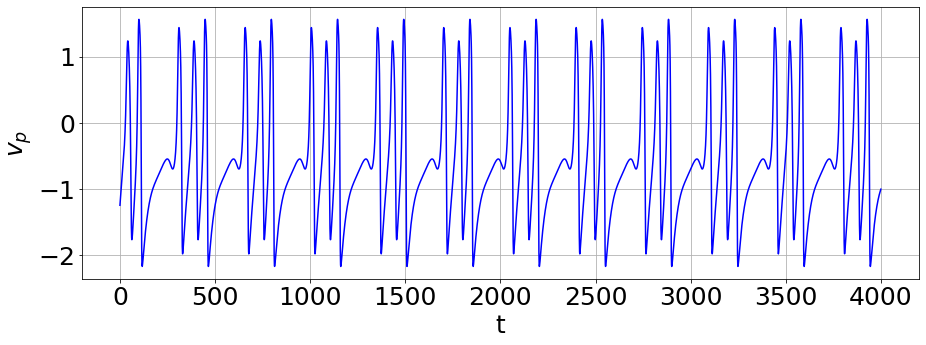

T = 14.390864422908859
Parameters: (1.6990035986538596, -1.3900190123208267)


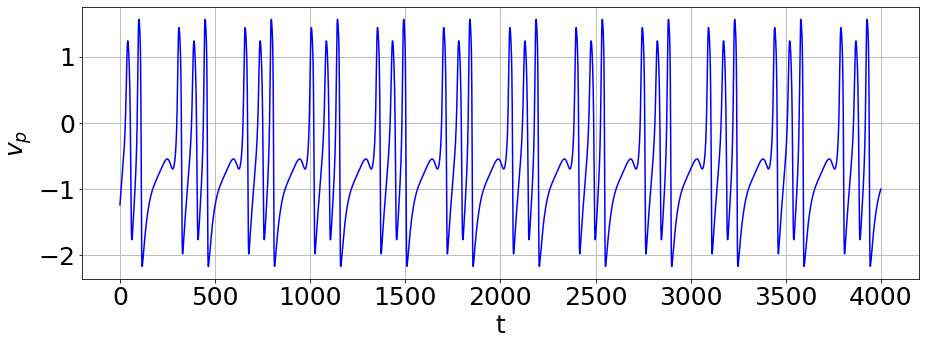

T = 14.390309540918386
Parameters: (0.2099334494649252, 0.5324606908040628)


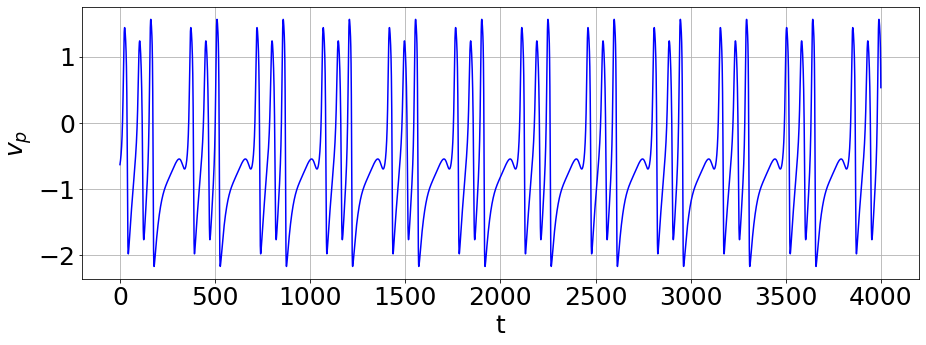

T = 14.390309540918386
Parameters: (-0.3976417147107987, 1.809033552541508)


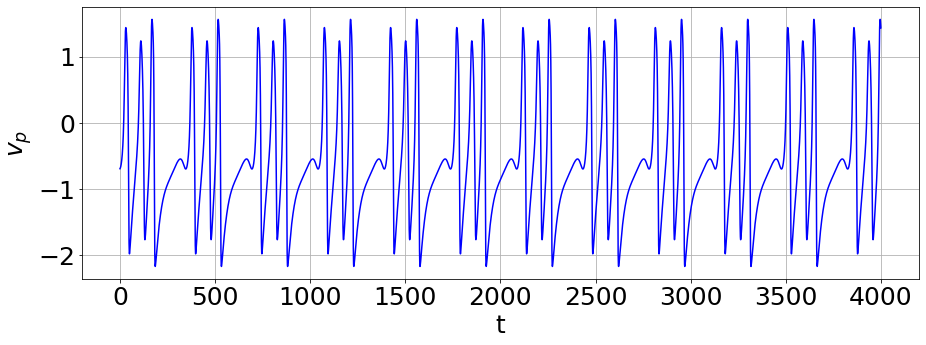

T = 14.390309540918386
Parameters: (0.2067393928957273, 0.2072403600456454)


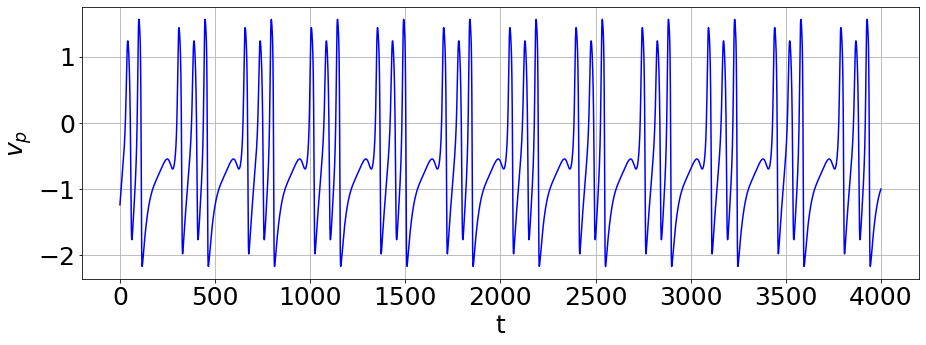

T = 14.390309540918388
Parameters: (-0.4101150143467165, -1.9542014399939238)


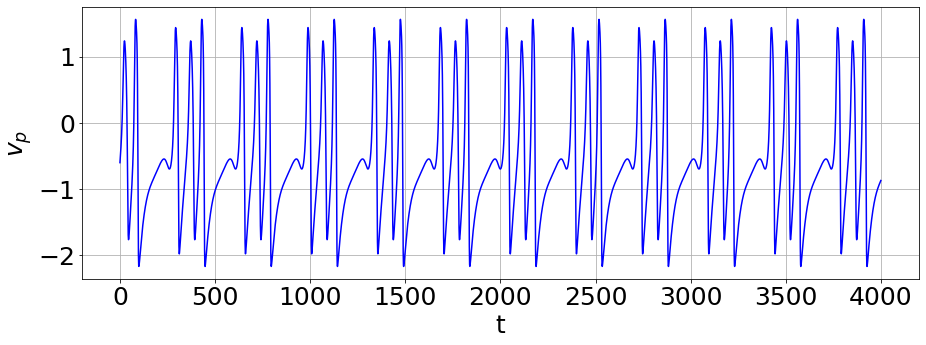

T = 14.390309540918386
Parameters: (1.4435512007920726, -0.8630095578455528)


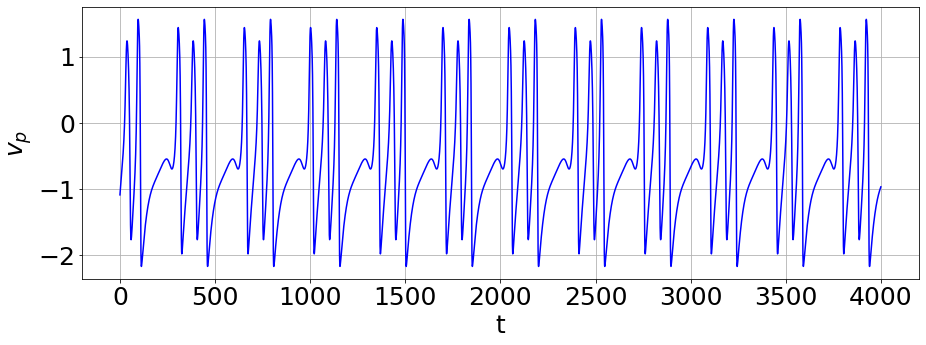

T = 14.390309540918386
Parameters: (-1.47018428780919, -0.9003582004647055)


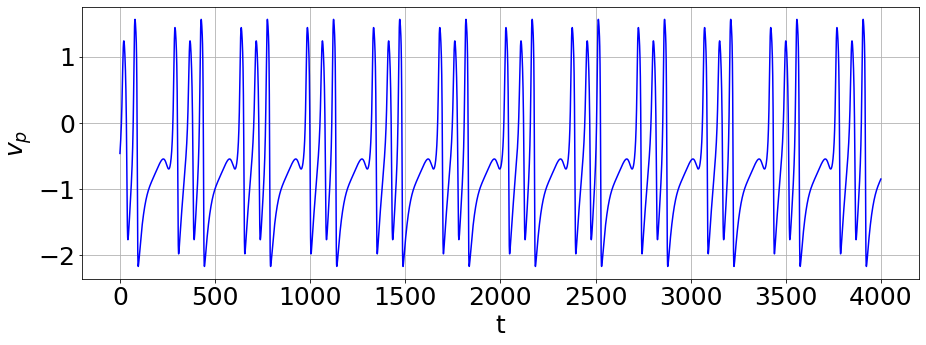

T = 14.390309540918386
Parameters: (0.8780282413973288, -0.0806212179519834)


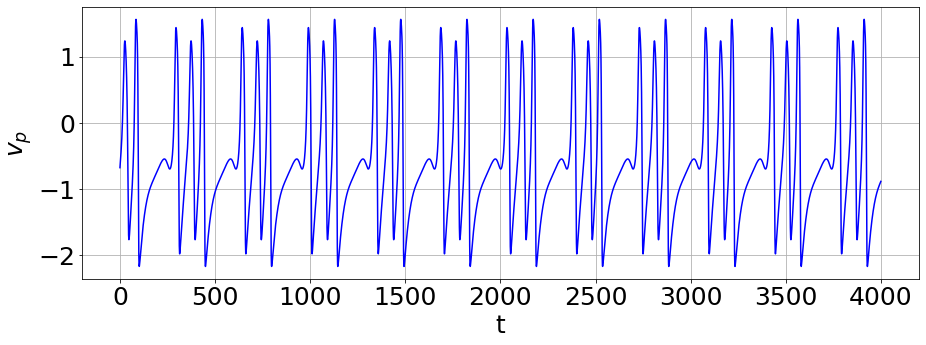

T = 14.390309540918386
Parameters: (-1.190723370190427, -1.071863405693164)


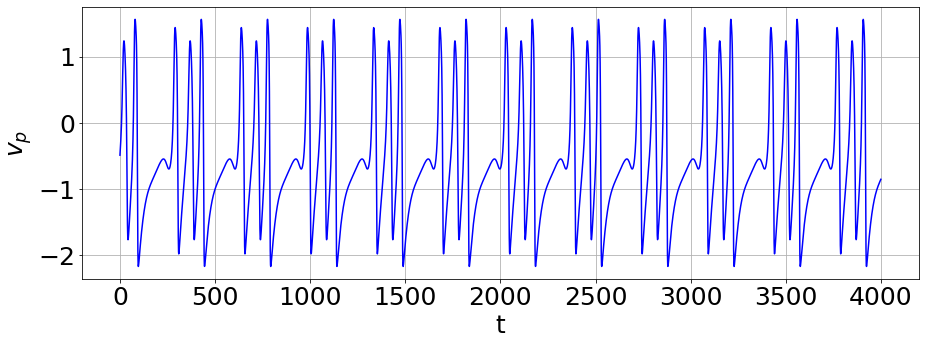

T = 14.390309540918386
Parameters: (-1.094289354580774, 0.4590007766481383)


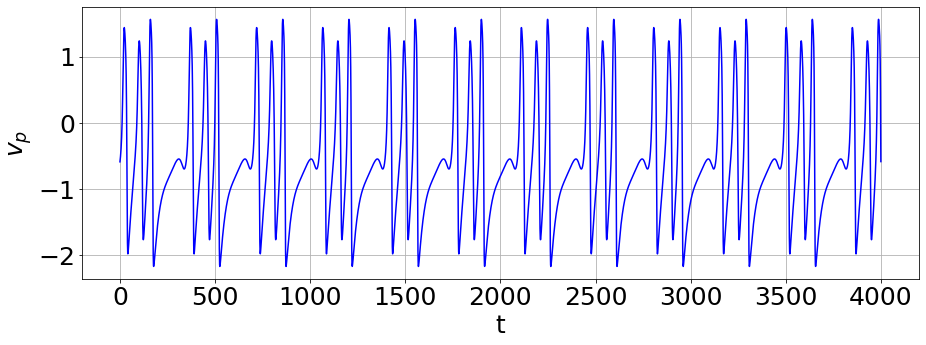

T = 14.390309540918386
Parameters: (-0.9956080851020928, -0.8487295340457068)


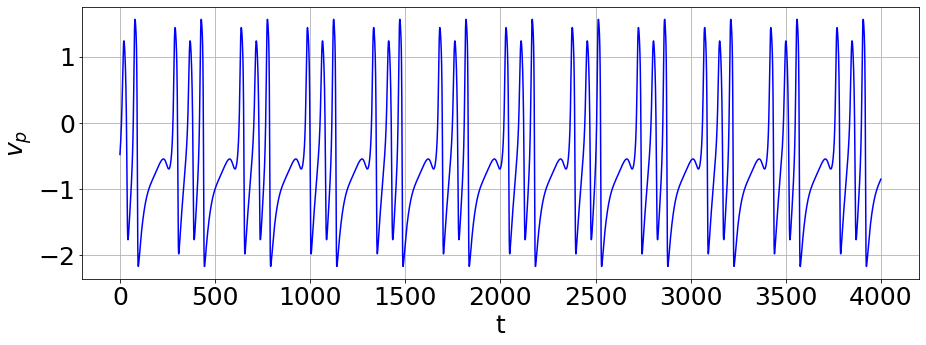

T = 14.390309540918388
Parameters: (-0.3787979969135993, 0.03081057739371751)


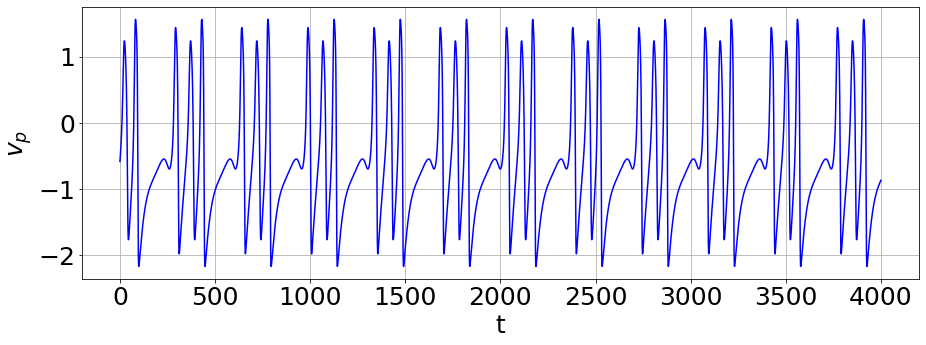

T = 14.390864422908859
Parameters: (-1.365832015549021, 1.4127519523272025)


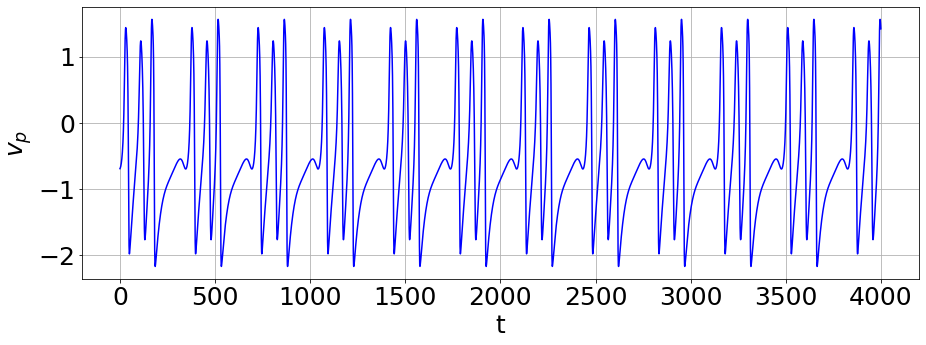

T = 14.39086442290886
Parameters: (-1.3798389191904428, 0.02508125023754637)


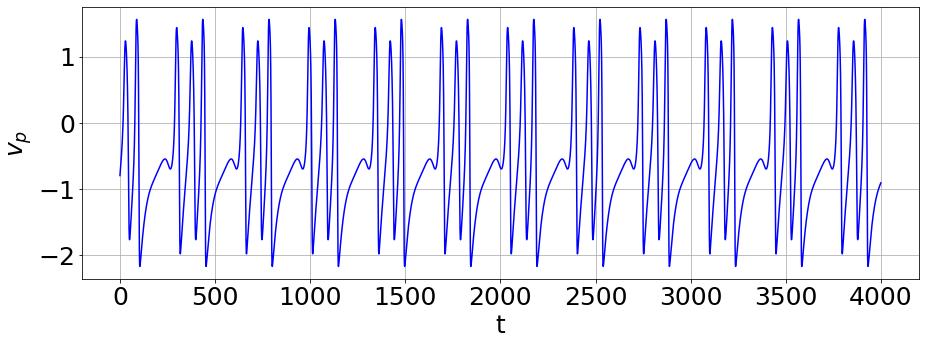

T = 14.390864422908859
Parameters: (-0.6436613273616953, 0.864764435139139)


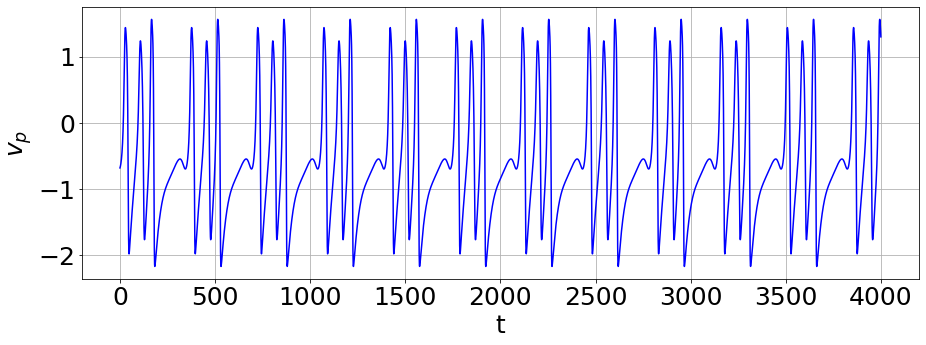

T = 14.390864422908859
Parameters: (1.7201970365809216, 0.7660877924080536)


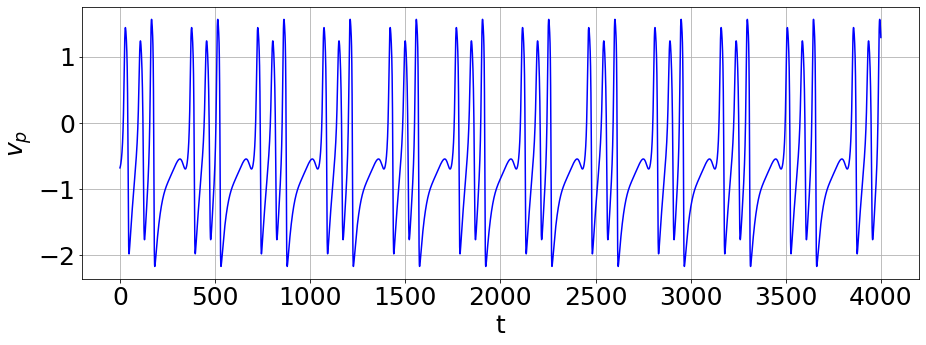

T = 14.455693983905826
Parameters: (1.488380748351093, 0.3952882038998111)


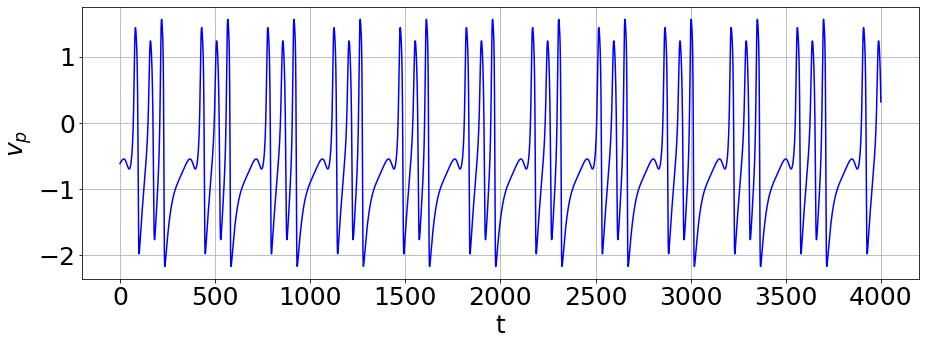

T = 14.390309540918386
Parameters: (-0.46129589644714164, -0.2044901586523391)


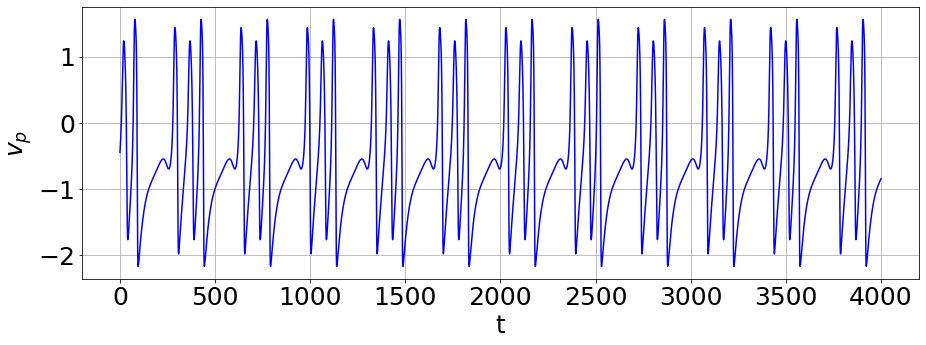

T = 14.390309540918386
Parameters: (0.6611486375905105, 1.3347216392070949)


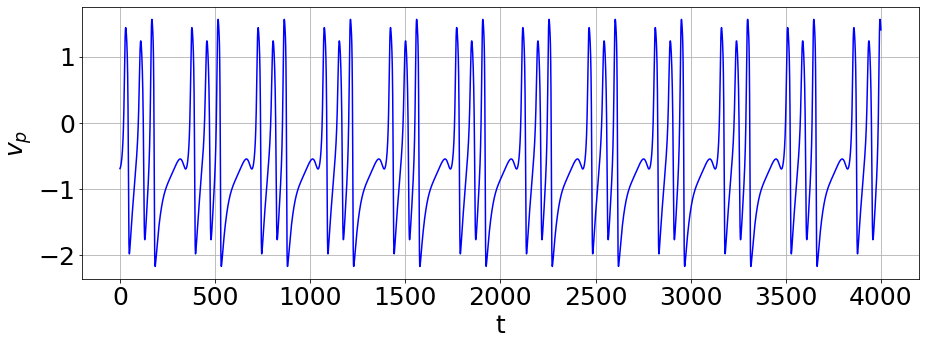

T = 14.390309540918386
Parameters: (0.8628741409635587, 1.460036867754802)


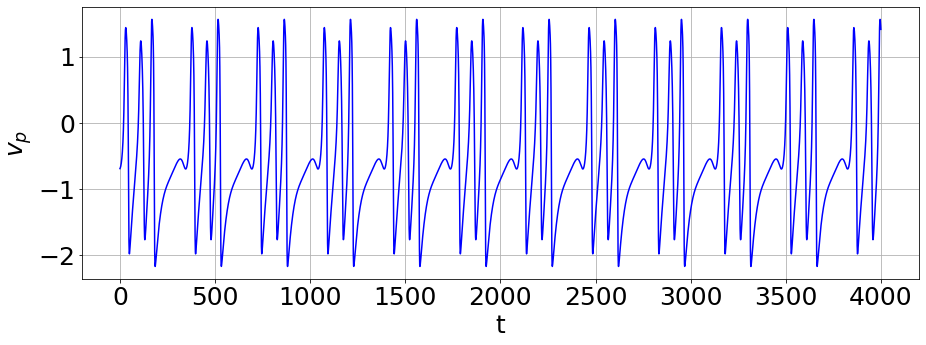

T = 14.390309540918388
Parameters: (-1.2626410308903724, 0.03225047974689099)


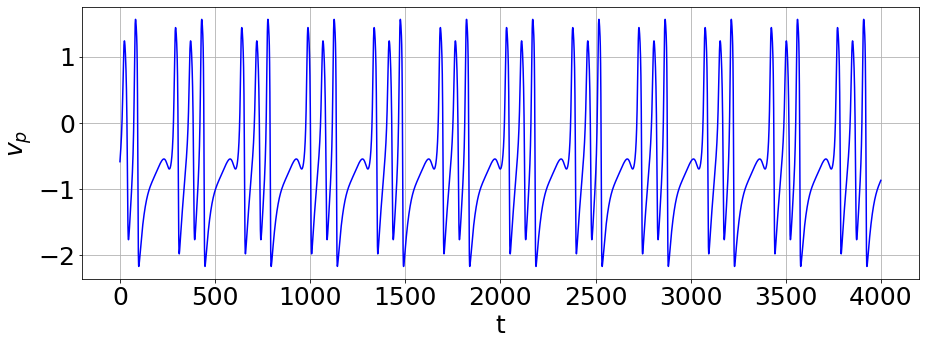

T = 14.390309540918388
Parameters: (0.24013102439171163, -1.8341506090620543)


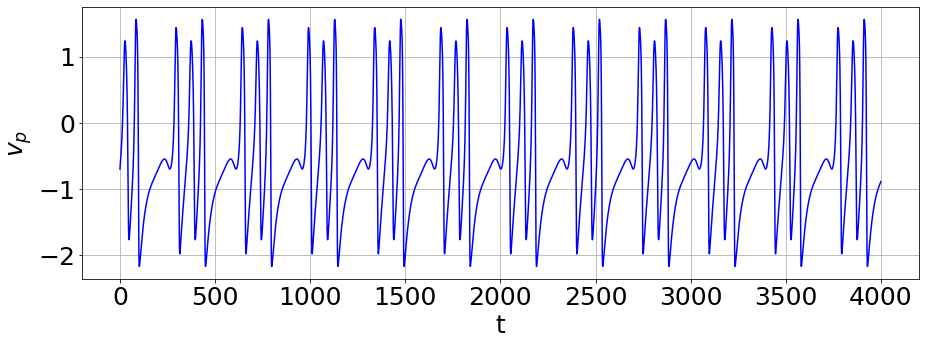

T = 14.390864422908859
Parameters: (0.8947070872806608, 0.6487377638255727)


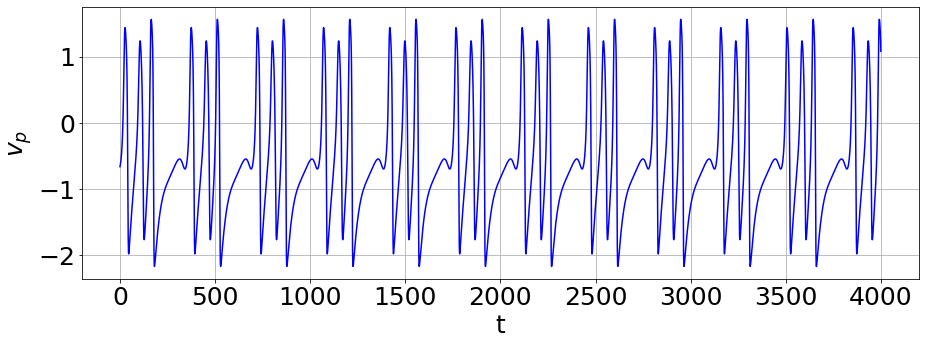

T = 14.390864422908859
Parameters: (-0.895461917964905, 1.4347718466911887)


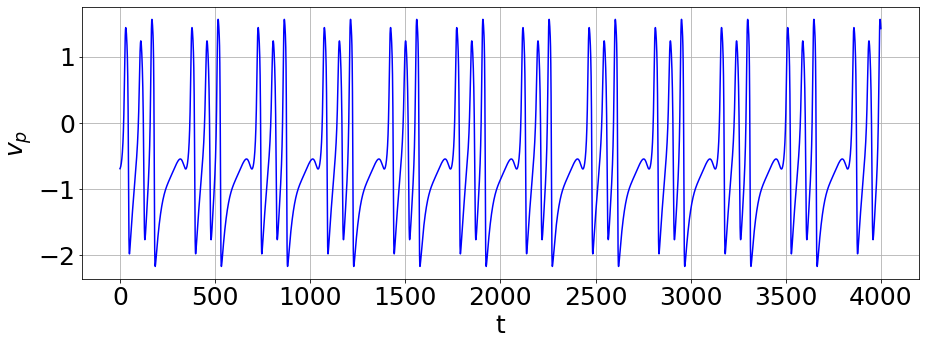

T = 14.390864422908859
Parameters: (-1.943851343459654, 0.48972781250319386)


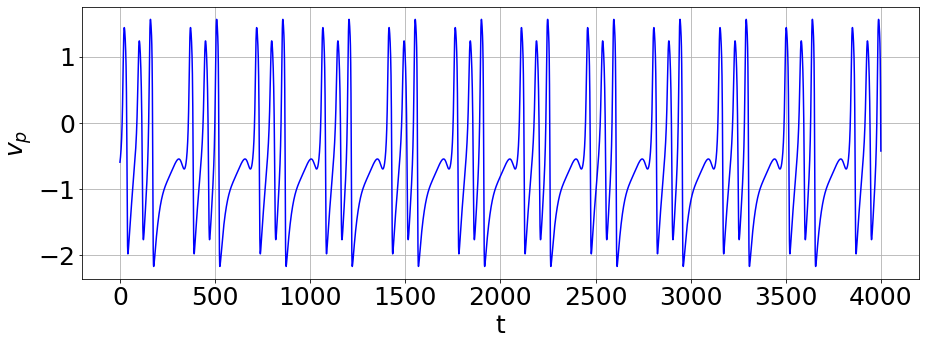

T = 14.390309540918386
Parameters: (-1.7625081690540716, 0.7598544722534961)


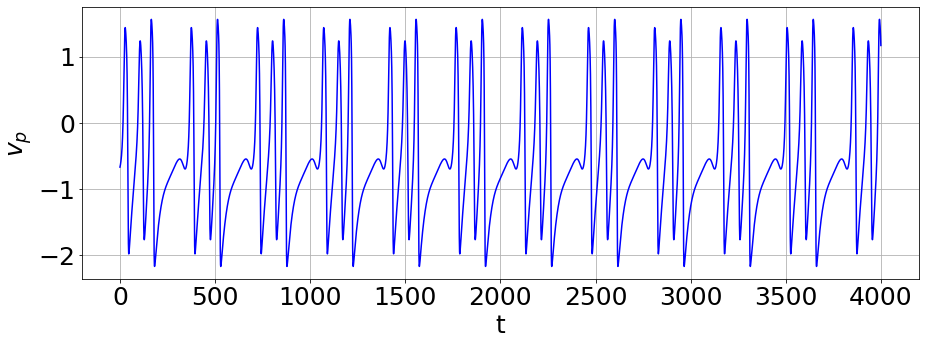

T = 14.390864422908859
Parameters: (-0.6662757404038038, 1.357771243882894)


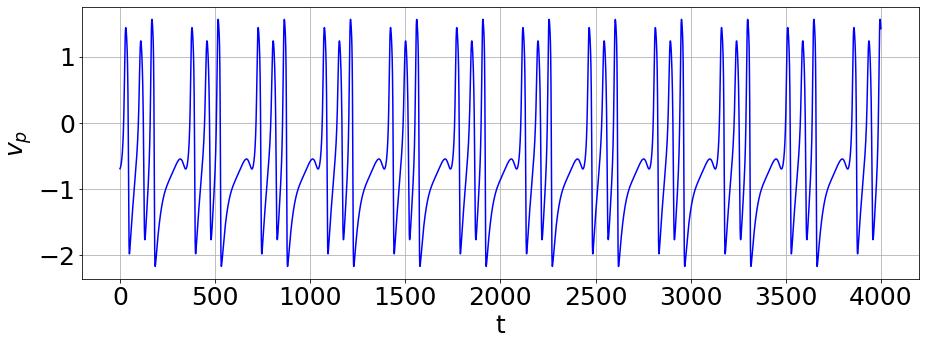

T = 14.432175132566526
Parameters: (-0.41037112681926313, -0.08433868377019094)


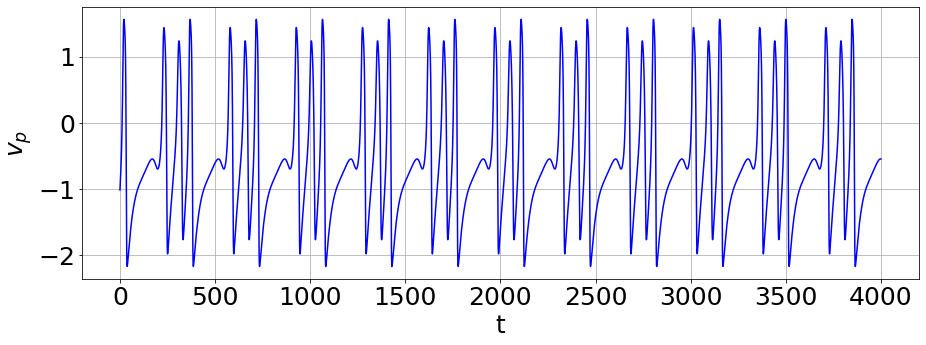

T = 14.390864422908859
Parameters: (-1.1216003221275228, 1.0006808057076855)


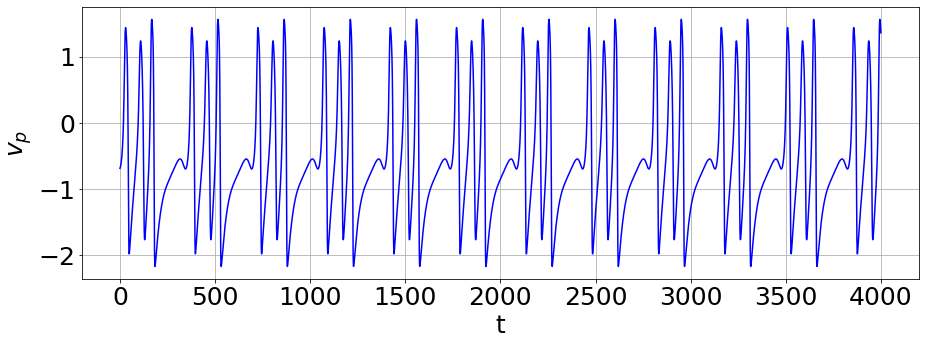

T = 14.390309540918386
Parameters: (1.7600883377700347, 0.9958892125855163)


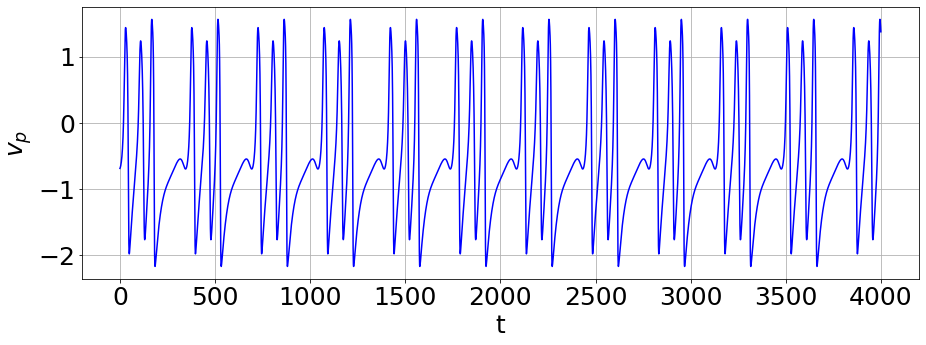

T = 14.390309540918386
Parameters: (0.13090333220830264, 0.9736350837058234)


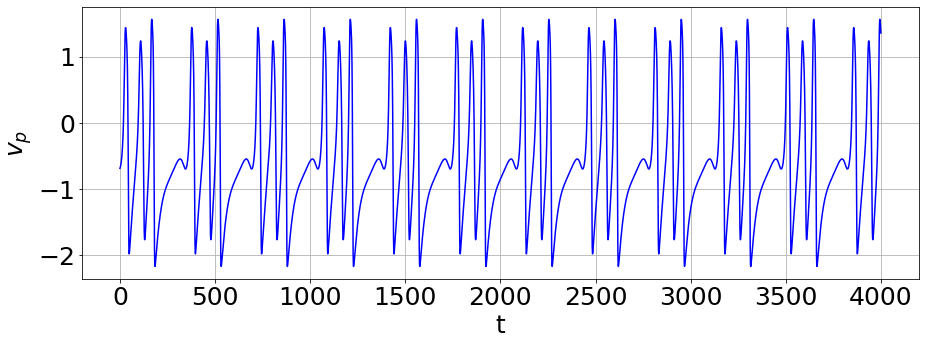

T = 14.390864422908859
Parameters: (1.5696859056171126, -1.9660127560167)


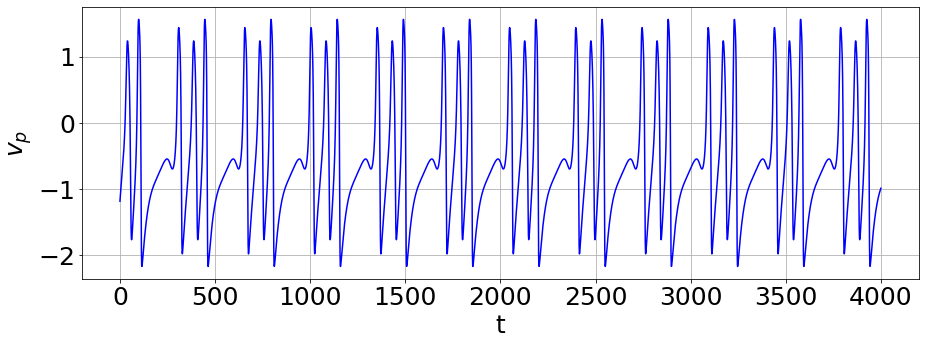

T = 14.390309540918388
Parameters: (-0.4932478694237288, 0.06779449537030846)


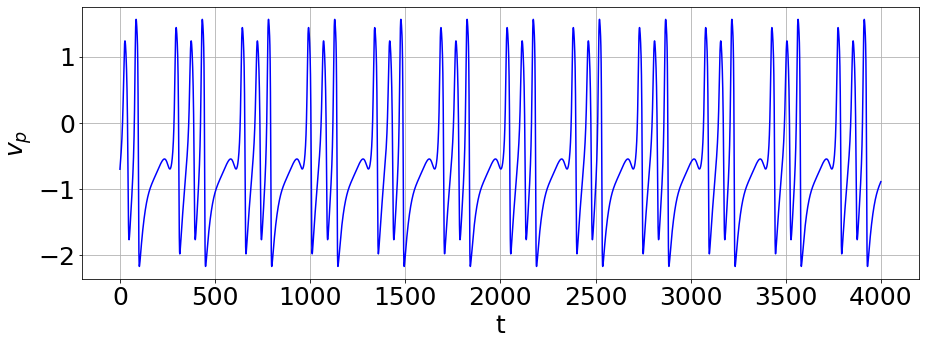

T = 14.390309540918386
Parameters: (-0.6537735656061003, 1.0504523838060198)


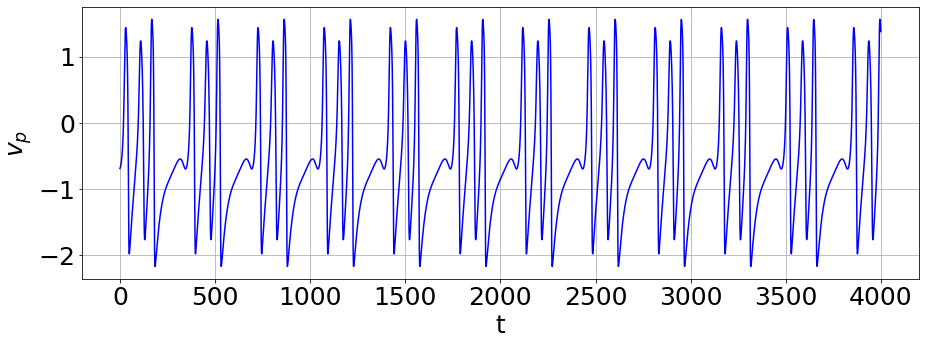

T = 14.390864422908859
Parameters: (-0.8823441841248418, 1.453229153302547)


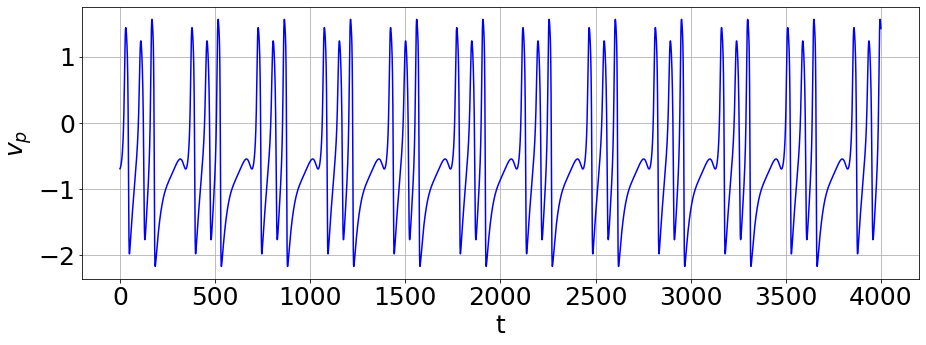

T = 14.390309540918386
Parameters: (-0.49129190448058413, 0.9268371844076473)


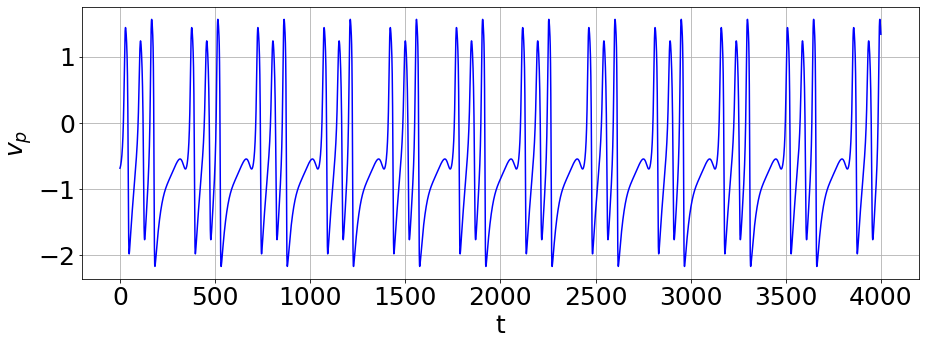

T = 14.39086442290886
Parameters: (-0.21009348870650335, -1.4712268765560768)


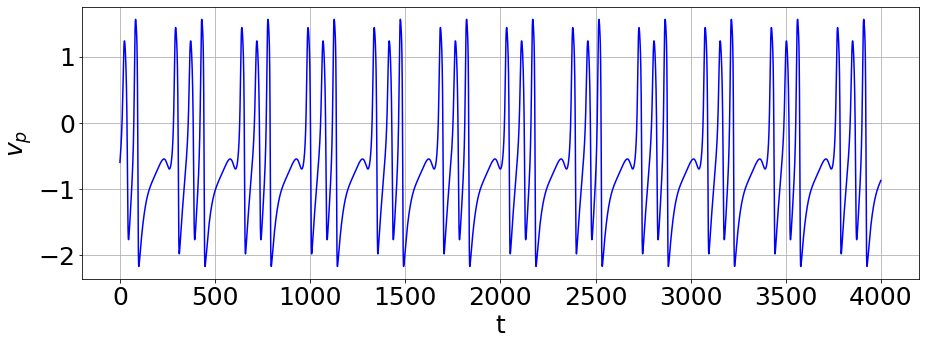

T = 14.390309540918386
Parameters: (-0.6139178468208288, 1.7984642329573903)


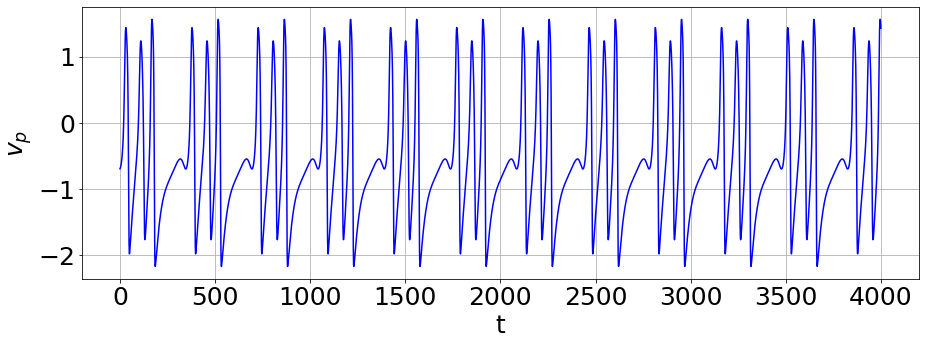

T = 14.390864422908859
Parameters: (-1.1953793052000181, 0.6151492959503169)


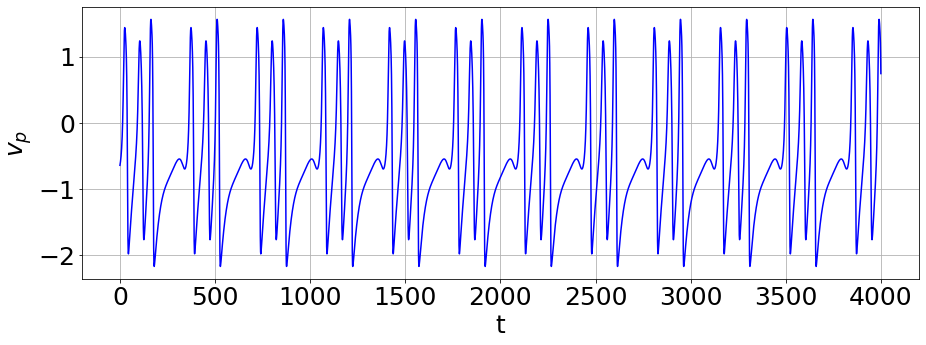

T = 14.39086442290886
Parameters: (0.08275289810089381, -0.9420876165846459)


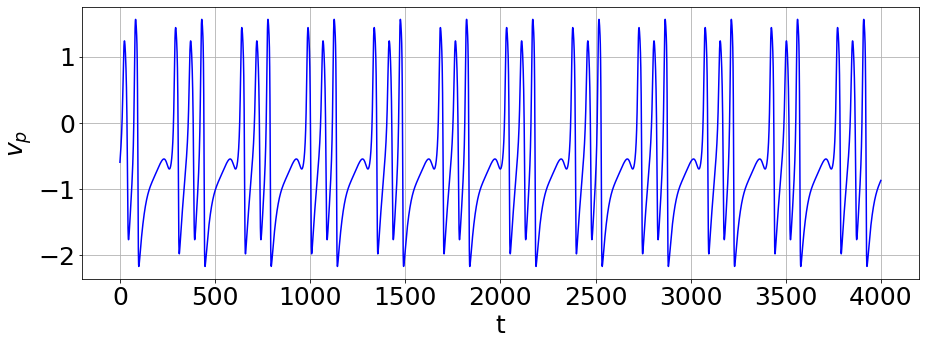

T = 14.390864422908859
Parameters: (0.3736143624210473, 1.624746471957517)


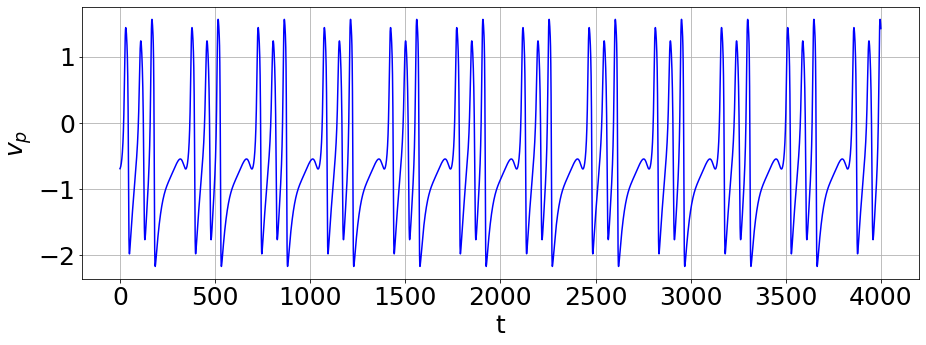

T = 14.432175132566526
Parameters: (1.1221103928594127, 0.3280703815134962)


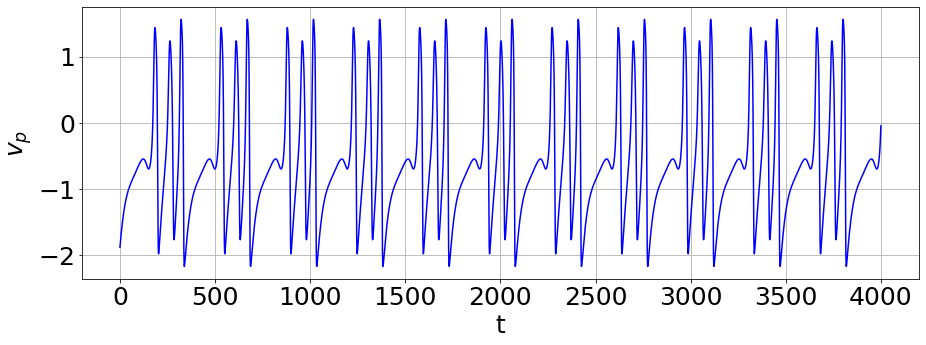

T = 14.390309540918386
Parameters: (0.7992292642338819, 1.1626316057318329)


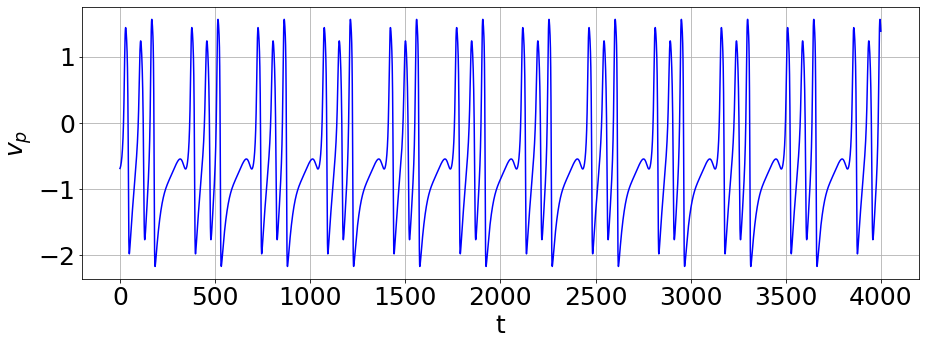

T = 14.390309540918388
Parameters: (-0.07269643996821706, -1.522783215148582)


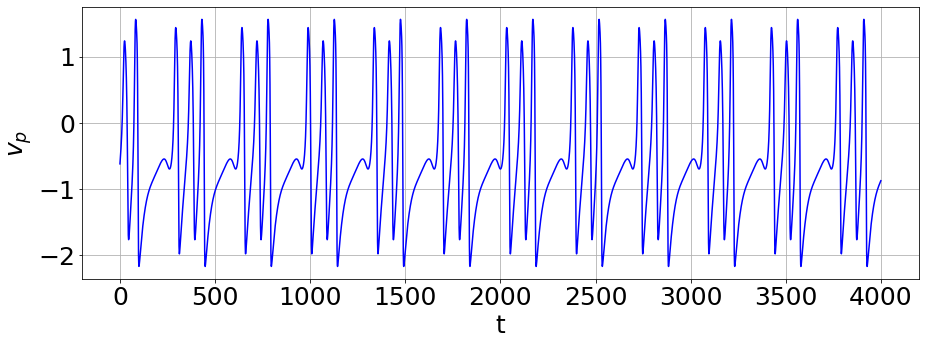

T = 14.390309540918386
Parameters: (1.610742172641495, -0.3017844623235617)


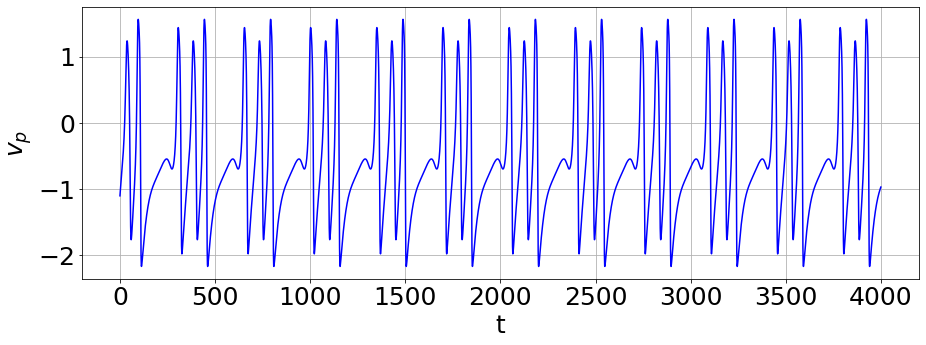

T = 14.39086442290886
Parameters: (-0.6906705640465689, -1.638223975884467)


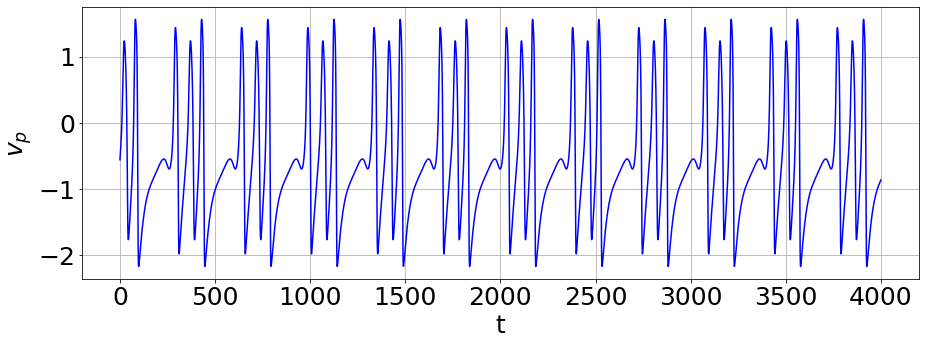

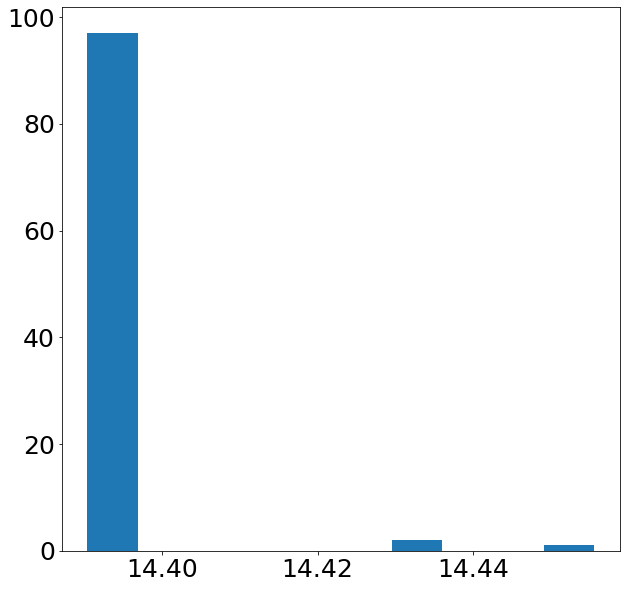

In [760]:
Bbp = 0.08
Bpbmin = 0.426
Bpbmax = 0.426
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_of_attractors(args2, 100)

In [768]:
Bbp = 0.08
Bpbmin = 0.426
Bpbmax = 0.426
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_vv = parameters_for_Tvv(args2)         

T = 14.497987473847333
vp0 = -2.0
vb0 = -2.0
T = 14.497987473847333
vp0 = -2.0
vb0 = -1.9
T = 14.497422316264444
vp0 = -2.0
vb0 = -1.7999999999999998
T = 14.497987473847333
vp0 = -2.0
vb0 = -1.6999999999999997
T = 14.497422316264444
vp0 = -2.0
vb0 = -1.5999999999999996
T = 14.497987473847333
vp0 = -2.0
vb0 = -1.4999999999999996
T = 14.497987473847333
vp0 = -2.0
vb0 = -1.3999999999999995
T = 14.497422316264444
vp0 = -2.0
vb0 = -1.2999999999999994
T = 14.497987473847333
vp0 = -2.0
vb0 = -1.1999999999999993
T = 14.497987473847333
vp0 = -2.0
vb0 = -1.0999999999999992
T = 14.497422316264444
vp0 = -2.0
vb0 = -0.9999999999999991
T = 14.497422316264444
vp0 = -2.0
vb0 = -0.899999999999999
T = 14.497987473847333
vp0 = -2.0
vb0 = -0.7999999999999989
T = 14.497987473847333
vp0 = -2.0
vb0 = -0.6999999999999988
T = 14.497422316264444
vp0 = -2.0
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = -2.0
vb0 = -0.49999999999999867
T = 14.497422316264444
vp0 = -2.0
vb0 = -0.3999999999999986
T = 14.275

T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -1.1999999999999993
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -1.0999999999999992
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -0.9999999999999991
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -0.899999999999999
T = 14.497422316264444
vp0 = -1.6999999999999997
vb0 = -0.7999999999999989
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -0.6999999999999988
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -0.49999999999999867
T = 14.497422316264444
vp0 = -1.6999999999999997
vb0 = -0.3999999999999986
T = 14.275176762631064
vp0 = -1.6999999999999997
vb0 = -0.2999999999999985
T = 14.275176762631066
vp0 = -1.6999999999999997
vb0 = -0.1999999999999984
T = 14.367559379309004
vp0 = -1.6999999999999997
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = 1.7763568394002505e-15
T = 14.49798747384733

T = 14.367004497318534
vp0 = -1.4999999999999996
vb0 = 1.9000000000000035
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -2.0
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.9
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.7999999999999998
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.6999999999999997
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.5999999999999996
T = 14.497422316264444
vp0 = -1.3999999999999995
vb0 = -1.4999999999999996
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.3999999999999995
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.2999999999999994
T = 14.497422316264444
vp0 = -1.3999999999999995
vb0 = -1.1999999999999993
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -1.0999999999999992
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -0.9999999999999991
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -0.899999999999999
T = 14.497987473847333
vp0 = -1.3999999999999995
vb0 = -0

T = 14.367559379309006
vp0 = -1.1999999999999993
vb0 = 1.0000000000000027
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.1000000000000028
T = 14.367559379309006
vp0 = -1.1999999999999993
vb0 = 1.2000000000000028
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.300000000000003
T = 14.367559379309006
vp0 = -1.1999999999999993
vb0 = 1.400000000000003
T = 14.367559379309006
vp0 = -1.1999999999999993
vb0 = 1.500000000000003
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.6000000000000032
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.7000000000000033
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.8000000000000034
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.9000000000000035
T = 14.497422316264444
vp0 = -1.0999999999999992
vb0 = -2.0
T = 14.497987473847333
vp0 = -1.0999999999999992
vb0 = -1.9
T = 14.497422316264444
vp0 = -1.0999999999999992
vb0 = -1.7999999999999998
T = 14.497987473847333
vp0 = -1.0999999999999992
vb0 = -1.6999999999

T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.20000000000000195
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.30000000000000204
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.40000000000000213
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.5000000000000022
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.6000000000000023
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.7000000000000024
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.8000000000000025
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.9000000000000026
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.0000000000000027
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.1000000000000028
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.2000000000000028
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 1.300000000000003
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.400000000000003
T = 14.367004497318534
vp0 = -0.899999999999999
vb

T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.49999999999999867
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.3999999999999986
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.2999999999999985
T = 14.497422316264444
vp0 = -0.5999999999999988
vb0 = -0.1999999999999984
T = 14.274600941697555
vp0 = -0.5999999999999988
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = 1.7763568394002505e-15
T = 14.497987473847331
vp0 = -0.5999999999999988
vb0 = 0.10000000000000187
T = 14.367004497318534
vp0 = -0.5999999999999988
vb0 = 0.20000000000000195
T = 14.367559379309006
vp0 = -0.5999999999999988
vb0 = 0.30000000000000204
T = 14.367004497318534
vp0 = -0.5999999999999988
vb0 = 0.40000000000000213
T = 14.367559379309006
vp0 = -0.5999999999999988
vb0 = 0.5000000000000022
T = 14.367559379309006
vp0 = -0.5999999999999988
vb0 = 0.6000000000000023
T = 14.367004497318534

T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -1.4999999999999996
T = 14.497422316264444
vp0 = -0.2999999999999985
vb0 = -1.3999999999999995
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -1.2999999999999994
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -1.1999999999999993
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -1.0999999999999992
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.9999999999999991
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.899999999999999
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.7999999999999989
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.6999999999999988
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.49999999999999867
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.3999999999999986
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.2999999999999985
T = 14.497987473847333
vp

T = 14.367559379309006
vp0 = -0.09999999999999831
vb0 = 1.6000000000000032
T = 14.367559379309006
vp0 = -0.09999999999999831
vb0 = 1.7000000000000033
T = 14.367559379309006
vp0 = -0.09999999999999831
vb0 = 1.8000000000000034
T = 14.367559379309006
vp0 = -0.09999999999999831
vb0 = 1.9000000000000035
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -2.0
T = 14.497422316264444
vp0 = 1.7763568394002505e-15
vb0 = -1.9
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -1.7999999999999998
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -1.6999999999999997
T = 14.497422316264444
vp0 = 1.7763568394002505e-15
vb0 = -1.5999999999999996
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -1.4999999999999996
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -1.3999999999999995
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -1.2999999999999994
T = 14.497987473847333
vp0 = 1.7763568394002505e-15
vb0 = -1.1999999999999993
T = 14.497987473847333
vp0 =

T = 14.367004497318534
vp0 = 0.20000000000000195
vb0 = 0.6000000000000023
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 0.7000000000000024
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 0.8000000000000025
T = 14.367004497318534
vp0 = 0.20000000000000195
vb0 = 0.9000000000000026
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 1.0000000000000027
T = 14.367004497318534
vp0 = 0.20000000000000195
vb0 = 1.1000000000000028
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 1.2000000000000028
T = 14.367004497318534
vp0 = 0.20000000000000195
vb0 = 1.300000000000003
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 1.400000000000003
T = 14.367004497318534
vp0 = 0.20000000000000195
vb0 = 1.500000000000003
T = 14.367004497318534
vp0 = 0.20000000000000195
vb0 = 1.6000000000000032
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 1.7000000000000033
T = 14.367559379309006
vp0 = 0.20000000000000195
vb0 = 1.8000000000000034
T = 14.367559379309006
vp0 = 0.2000000000

T = 14.497422316264444
vp0 = 0.5000000000000022
vb0 = -0.1999999999999984
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 1.7763568394002505e-15
T = 14.497422316264442
vp0 = 0.5000000000000022
vb0 = 0.10000000000000187
T = 14.367559379309006
vp0 = 0.5000000000000022
vb0 = 0.20000000000000195
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 0.30000000000000204
T = 14.367004497318534
vp0 = 0.5000000000000022
vb0 = 0.40000000000000213
T = 14.367559379309006
vp0 = 0.5000000000000022
vb0 = 0.5000000000000022
T = 14.367004497318534
vp0 = 0.5000000000000022
vb0 = 0.6000000000000023
T = 14.367559379309006
vp0 = 0.5000000000000022
vb0 = 0.7000000000000024
T = 14.367004497318534
vp0 = 0.5000000000000022
vb0 = 0.8000000000000025
T = 14.367559379309006
vp0 = 0.5000000000000022
vb0 = 0.9000000000000026
T = 14.367559379309006
vp0 = 0.5000000000000022
vb0 = 1.0000000000000027
T = 14.367559379309006
vp0 = 0.500000000

T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.899999999999999
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.7999999999999989
T = 14.497422316264444
vp0 = 0.8000000000000025
vb0 = -0.6999999999999988
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = -0.49999999999999867
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = -0.3999999999999986
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = -0.2999999999999985
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = -0.1999999999999984
T = 14.497422316264444
vp0 = 0.8000000000000025
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = 1.7763568394002505e-15
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = 0.10000000000000187
T = 14.367559379309006
vp0 = 0.8000000000000025
vb0 = 0.20000000000000195
T = 14.275176762631064
vp0 = 0.8000000000000025
vb0 = 0.30000000000000204
T = 14.367004497318534
vp0 = 0.800

T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -1.5999999999999996
T = 14.497422316264442
vp0 = 1.1000000000000028
vb0 = -1.4999999999999996
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -1.3999999999999995
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -1.2999999999999994
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -1.1999999999999993
T = 14.497422316264442
vp0 = 1.1000000000000028
vb0 = -1.0999999999999992
T = 14.497422316264442
vp0 = 1.1000000000000028
vb0 = -0.9999999999999991
T = 14.497422316264442
vp0 = 1.1000000000000028
vb0 = -0.899999999999999
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.7999999999999989
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.6999999999999988
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.5999999999999988
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.49999999999999867
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.3999999999999986
T = 14.497987473847331
vp0 = 1.1000000

T = 14.367004497318534
vp0 = 1.300000000000003
vb0 = 1.7000000000000033
T = 14.367004497318534
vp0 = 1.300000000000003
vb0 = 1.8000000000000034
T = 14.367004497318534
vp0 = 1.300000000000003
vb0 = 1.9000000000000035
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -2.0
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.9
T = 14.497422316264444
vp0 = 1.400000000000003
vb0 = -1.7999999999999998
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.6999999999999997
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.5999999999999996
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.4999999999999996
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.3999999999999995
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.2999999999999994
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.1999999999999993
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -1.0999999999999992
T = 14.497987473847333
vp0 = 1.400000000000003
vb0 = -0.9999999999999991
T = 14.4979

T = 14.367559379309006
vp0 = 1.6000000000000032
vb0 = 1.1000000000000028
T = 14.367559379309006
vp0 = 1.6000000000000032
vb0 = 1.2000000000000028
T = 14.367004497318534
vp0 = 1.6000000000000032
vb0 = 1.300000000000003
T = 14.367559379309006
vp0 = 1.6000000000000032
vb0 = 1.400000000000003
T = 14.367004497318534
vp0 = 1.6000000000000032
vb0 = 1.500000000000003
T = 14.367004497318534
vp0 = 1.6000000000000032
vb0 = 1.6000000000000032
T = 14.367559379309006
vp0 = 1.6000000000000032
vb0 = 1.7000000000000033
T = 14.367559379309006
vp0 = 1.6000000000000032
vb0 = 1.8000000000000034
T = 14.367559379309006
vp0 = 1.6000000000000032
vb0 = 1.9000000000000035
T = 14.367559379309006
vp0 = 1.7000000000000033
vb0 = -2.0
T = 14.367559379309006
vp0 = 1.7000000000000033
vb0 = -1.9
T = 14.367559379309006
vp0 = 1.7000000000000033
vb0 = -1.7999999999999998
T = 14.367559379309006
vp0 = 1.7000000000000033
vb0 = -1.6999999999999997
T = 14.367559379309006
vp0 = 1.7000000000000033
vb0 = -1.5999999999999996
T = 14

T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 0.40000000000000213
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 0.5000000000000022
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 0.6000000000000023
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 0.7000000000000024
T = 14.367559379309006
vp0 = 1.9000000000000035
vb0 = 0.8000000000000025
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 0.9000000000000026
T = 14.367559379309006
vp0 = 1.9000000000000035
vb0 = 1.0000000000000027
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 1.1000000000000028
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 1.2000000000000028
T = 14.367559379309006
vp0 = 1.9000000000000035
vb0 = 1.300000000000003
T = 14.367004497318534
vp0 = 1.9000000000000035
vb0 = 1.400000000000003
T = 14.367559379309006
vp0 = 1.9000000000000035
vb0 = 1.500000000000003
T = 14.367559379309006
vp0 = 1.9000000000000035
vb0 = 1.6000000000000032
T = 14.367559379309006
vp0 = 1.9000000000000035
vb0 =

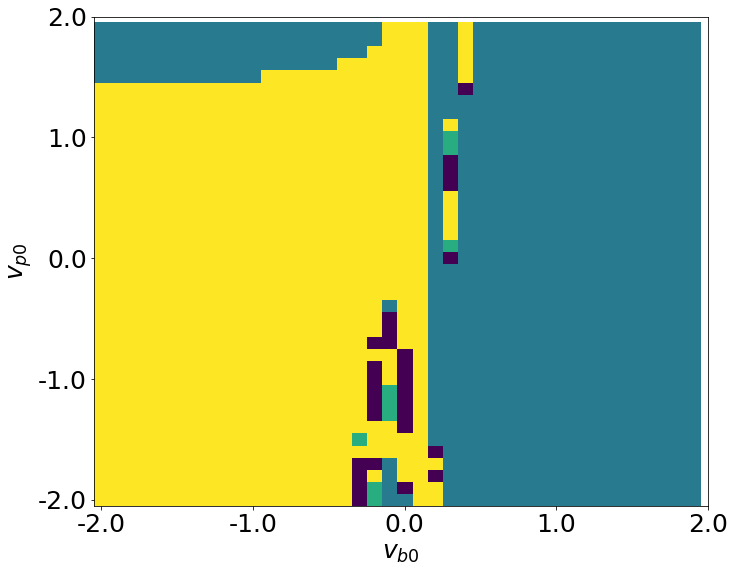

In [769]:

fig, ax = plt.subplots(figsize=(11, 9))
plt.imshow(T_vv, aspect='auto', origin='lower')
yticks = np.linspace(0,40,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$v_{p0}$')

xticks = np.linspace(0,40,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$v_{b0}$')

# fig.colorbar(np.arange(0, 20, 1))
plt.show()

In [770]:
Bbp = 0.08
Bpbmin = 0.426
Bpbmax = 0.426
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_uu = parameters_for_Tuu(args2)         

T = 14.413614584518239
vp0 = -2.0
vb0 = -2.0
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.9
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.7999999999999998
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.6999999999999997
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.5999999999999996
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.4999999999999996
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.3999999999999995
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.2999999999999994
T = 14.413614584518239
vp0 = -2.0
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 = -2.0
vb0 = -1.0999999999999992
T = 14.413614584518237
vp0 = -2.0
vb0 = -0.9999999999999991
T = 14.41416946650871
vp0 = -2.0
vb0 = -0.899999999999999
T = 14.413614584518237
vp0 = -2.0
vb0 = -0.7999999999999989
T = 14.413614584518237
vp0 = -2.0
vb0 = -0.6999999999999988
T = 14.413614584518237
vp0 = -2.0
vb0 = -0.5999999999999988
T = 14.275176762631066
vp0 = -2.0
vb0 = -0.49999999999999867
T = 14.497987473847331
vp0 = -2.0
vb0 = -0.3999999999999986
T = 14.4979

T = 14.413614584518237
vp0 = -1.6999999999999997
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 = -1.6999999999999997
vb0 = -1.0999999999999992
T = 14.413614584518237
vp0 = -1.6999999999999997
vb0 = -0.9999999999999991
T = 14.413614584518237
vp0 = -1.6999999999999997
vb0 = -0.899999999999999
T = 14.497987473847333
vp0 = -1.6999999999999997
vb0 = -0.7999999999999989
T = 14.413614584518237
vp0 = -1.6999999999999997
vb0 = -0.6999999999999988
T = 14.497987473847331
vp0 = -1.6999999999999997
vb0 = -0.5999999999999988
T = 14.497987473847331
vp0 = -1.6999999999999997
vb0 = -0.49999999999999867
T = 14.497987473847331
vp0 = -1.6999999999999997
vb0 = -0.3999999999999986
T = 14.497422316264442
vp0 = -1.6999999999999997
vb0 = -0.2999999999999985
T = 14.41416946650871
vp0 = -1.6999999999999997
vb0 = -0.1999999999999984
T = 14.413614584518237
vp0 = -1.6999999999999997
vb0 = -0.09999999999999831
T = 14.367004497318534
vp0 = -1.6999999999999997
vb0 = 1.7763568394002505e-15
T = 14.367004497318534

T = 14.497422316264444
vp0 = -1.4999999999999996
vb0 = 1.9000000000000035
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -2.0
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -1.9
T = 14.414169466508712
vp0 = -1.3999999999999995
vb0 = -1.7999999999999998
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -1.6999999999999997
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -1.5999999999999996
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -1.4999999999999996
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -1.3999999999999995
T = 14.413614584518239
vp0 = -1.3999999999999995
vb0 = -1.2999999999999994
T = 14.413614584518237
vp0 = -1.3999999999999995
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 = -1.3999999999999995
vb0 = -1.0999999999999992
T = 14.413614584518237
vp0 = -1.3999999999999995
vb0 = -0.9999999999999991
T = 14.413614584518237
vp0 = -1.3999999999999995
vb0 = -0.899999999999999
T = 14.367004497318534
vp0 = -1.3999999999999995
vb0 = -0

T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.0000000000000027
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.1000000000000028
T = 14.367004497318534
vp0 = -1.1999999999999993
vb0 = 1.2000000000000028
T = 14.367559379309004
vp0 = -1.1999999999999993
vb0 = 1.300000000000003
T = 14.367559379309004
vp0 = -1.1999999999999993
vb0 = 1.400000000000003
T = 14.367004497318531
vp0 = -1.1999999999999993
vb0 = 1.500000000000003
T = 14.367559379309004
vp0 = -1.1999999999999993
vb0 = 1.6000000000000032
T = 14.367004497318531
vp0 = -1.1999999999999993
vb0 = 1.7000000000000033
T = 14.367559379309004
vp0 = -1.1999999999999993
vb0 = 1.8000000000000034
T = 14.367559379309004
vp0 = -1.1999999999999993
vb0 = 1.9000000000000035
T = 14.413614584518239
vp0 = -1.0999999999999992
vb0 = -2.0
T = 14.413614584518239
vp0 = -1.0999999999999992
vb0 = -1.9
T = 14.413614584518239
vp0 = -1.0999999999999992
vb0 = -1.7999999999999998
T = 14.413614584518239
vp0 = -1.0999999999999992
vb0 = -1.6999999999

T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.20000000000000195
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.30000000000000204
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.40000000000000213
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.5000000000000022
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.6000000000000023
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.7000000000000024
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 0.8000000000000025
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 0.9000000000000026
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.0000000000000027
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 1.1000000000000028
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.2000000000000028
T = 14.367004497318534
vp0 = -0.899999999999999
vb0 = 1.300000000000003
T = 14.367559379309006
vp0 = -0.899999999999999
vb0 = 1.400000000000003
T = 14.367004497318534
vp0 = -0.899999999999999
vb

T = 14.497422316264444
vp0 = -0.5999999999999988
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.49999999999999867
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.3999999999999986
T = 14.497422316264444
vp0 = -0.5999999999999988
vb0 = -0.2999999999999985
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.1999999999999984
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = 1.7763568394002505e-15
T = 14.497422316264444
vp0 = -0.5999999999999988
vb0 = 0.10000000000000187
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = 0.20000000000000195
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = 0.30000000000000204
T = 14.497987473847333
vp0 = -0.5999999999999988
vb0 = 0.40000000000000213
T = 14.275176762631064
vp0 = -0.5999999999999988
vb0 = 0.5000000000000022
T = 14.414169466508712
vp0 = -0.5999999999999988
vb0 = 0.6000000000000023
T = 14.367004497318531

T = 14.413614584518239
vp0 = -0.2999999999999985
vb0 = -1.4999999999999996
T = 14.413614584518239
vp0 = -0.2999999999999985
vb0 = -1.3999999999999995
T = 14.413614584518239
vp0 = -0.2999999999999985
vb0 = -1.2999999999999994
T = 14.41416946650871
vp0 = -0.2999999999999985
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 = -0.2999999999999985
vb0 = -1.0999999999999992
T = 14.413614584518237
vp0 = -0.2999999999999985
vb0 = -0.9999999999999991
T = 14.413614584518237
vp0 = -0.2999999999999985
vb0 = -0.899999999999999
T = 14.367004497318531
vp0 = -0.2999999999999985
vb0 = -0.7999999999999989
T = 14.497422316264442
vp0 = -0.2999999999999985
vb0 = -0.6999999999999988
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.5999999999999988
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.49999999999999867
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.3999999999999986
T = 14.497987473847333
vp0 = -0.2999999999999985
vb0 = -0.2999999999999985
T = 14.497987473847333
vp0

T = 14.497422316264444
vp0 = -0.09999999999999831
vb0 = 1.6000000000000032
T = 14.497422316264444
vp0 = -0.09999999999999831
vb0 = 1.7000000000000033
T = 14.497987473847333
vp0 = -0.09999999999999831
vb0 = 1.8000000000000034
T = 14.497987473847331
vp0 = -0.09999999999999831
vb0 = 1.9000000000000035
T = 14.414169466508712
vp0 = 1.7763568394002505e-15
vb0 = -2.0
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.9
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.7999999999999998
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.6999999999999997
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.5999999999999996
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.4999999999999996
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.3999999999999995
T = 14.414169466508712
vp0 = 1.7763568394002505e-15
vb0 = -1.2999999999999994
T = 14.413614584518239
vp0 = 1.7763568394002505e-15
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 =

T = 14.497987473847333
vp0 = 0.20000000000000195
vb0 = 0.6000000000000023
T = 14.497987473847333
vp0 = 0.20000000000000195
vb0 = 0.7000000000000024
T = 14.497987473847333
vp0 = 0.20000000000000195
vb0 = 0.8000000000000025
T = 14.275176762631064
vp0 = 0.20000000000000195
vb0 = 0.9000000000000026
T = 14.41416946650871
vp0 = 0.20000000000000195
vb0 = 1.0000000000000027
T = 14.367559379309004
vp0 = 0.20000000000000195
vb0 = 1.1000000000000028
T = 14.367559379309004
vp0 = 0.20000000000000195
vb0 = 1.2000000000000028
T = 14.367559379309004
vp0 = 0.20000000000000195
vb0 = 1.300000000000003
T = 14.497422316264442
vp0 = 0.20000000000000195
vb0 = 1.400000000000003
T = 14.275176762631064
vp0 = 0.20000000000000195
vb0 = 1.500000000000003
T = 14.275176762631064
vp0 = 0.20000000000000195
vb0 = 1.6000000000000032
T = 14.497422316264442
vp0 = 0.20000000000000195
vb0 = 1.7000000000000033
T = 14.497987473847333
vp0 = 0.20000000000000195
vb0 = 1.8000000000000034
T = 14.497987473847333
vp0 = 0.20000000000

T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = -0.1999999999999984
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 1.7763568394002505e-15
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 0.10000000000000187
T = 14.497422316264444
vp0 = 0.5000000000000022
vb0 = 0.20000000000000195
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 0.30000000000000204
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 0.40000000000000213
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 0.5000000000000022
T = 14.497987473847333
vp0 = 0.5000000000000022
vb0 = 0.6000000000000023
T = 14.497422316264444
vp0 = 0.5000000000000022
vb0 = 0.7000000000000024
T = 14.497422316264444
vp0 = 0.5000000000000022
vb0 = 0.8000000000000025
T = 14.497422316264444
vp0 = 0.5000000000000022
vb0 = 0.9000000000000026
T = 14.497422316264444
vp0 = 0.5000000000000022
vb0 = 1.0000000000000027
T = 14.275176762631064
vp0 = 0.500000000

T = 14.413614584518237
vp0 = 0.8000000000000025
vb0 = -0.899999999999999
T = 14.413614584518237
vp0 = 0.8000000000000025
vb0 = -0.7999999999999989
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.6999999999999988
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.5999999999999988
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.49999999999999867
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.3999999999999986
T = 14.497987473847331
vp0 = 0.8000000000000025
vb0 = -0.2999999999999985
T = 14.497422316264442
vp0 = 0.8000000000000025
vb0 = -0.1999999999999984
T = 14.497422316264442
vp0 = 0.8000000000000025
vb0 = -0.09999999999999831
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = 1.7763568394002505e-15
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = 0.10000000000000187
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = 0.20000000000000195
T = 14.497987473847333
vp0 = 0.8000000000000025
vb0 = 0.30000000000000204
T = 14.497422316264444
vp0 = 0.800

T = 14.413614584518239
vp0 = 1.1000000000000028
vb0 = -1.5999999999999996
T = 14.413614584518239
vp0 = 1.1000000000000028
vb0 = -1.4999999999999996
T = 14.414169466508712
vp0 = 1.1000000000000028
vb0 = -1.3999999999999995
T = 14.413614584518239
vp0 = 1.1000000000000028
vb0 = -1.2999999999999994
T = 14.413614584518239
vp0 = 1.1000000000000028
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 = 1.1000000000000028
vb0 = -1.0999999999999992
T = 14.413614584518237
vp0 = 1.1000000000000028
vb0 = -0.9999999999999991
T = 14.413614584518237
vp0 = 1.1000000000000028
vb0 = -0.899999999999999
T = 14.274600941697555
vp0 = 1.1000000000000028
vb0 = -0.7999999999999989
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.6999999999999988
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.5999999999999988
T = 14.497987473847331
vp0 = 1.1000000000000028
vb0 = -0.49999999999999867
T = 14.497422316264442
vp0 = 1.1000000000000028
vb0 = -0.3999999999999986
T = 14.497422316264442
vp0 = 1.1000000

T = 14.275176762631064
vp0 = 1.300000000000003
vb0 = 1.7000000000000033
T = 14.414169466508712
vp0 = 1.300000000000003
vb0 = 1.8000000000000034
T = 14.367559379309004
vp0 = 1.300000000000003
vb0 = 1.9000000000000035
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -2.0
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.9
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.7999999999999998
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.6999999999999997
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.5999999999999996
T = 14.414169466508712
vp0 = 1.400000000000003
vb0 = -1.4999999999999996
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.3999999999999995
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.2999999999999994
T = 14.413614584518239
vp0 = 1.400000000000003
vb0 = -1.1999999999999993
T = 14.413614584518237
vp0 = 1.400000000000003
vb0 = -1.0999999999999992
T = 14.413614584518237
vp0 = 1.400000000000003
vb0 = -0.9999999999999991
T = 14.4136

T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.1000000000000028
T = 14.497422316264444
vp0 = 1.6000000000000032
vb0 = 1.2000000000000028
T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.300000000000003
T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.400000000000003
T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.500000000000003
T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.6000000000000032
T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.7000000000000033
T = 14.497987473847333
vp0 = 1.6000000000000032
vb0 = 1.8000000000000034
T = 14.275176762631064
vp0 = 1.6000000000000032
vb0 = 1.9000000000000035
T = 14.413614584518239
vp0 = 1.7000000000000033
vb0 = -2.0
T = 14.413614584518239
vp0 = 1.7000000000000033
vb0 = -1.9
T = 14.414169466508712
vp0 = 1.7000000000000033
vb0 = -1.7999999999999998
T = 14.413614584518239
vp0 = 1.7000000000000033
vb0 = -1.6999999999999997
T = 14.413614584518239
vp0 = 1.7000000000000033
vb0 = -1.5999999999999996
T = 14

T = 14.497422316264442
vp0 = 1.9000000000000035
vb0 = 0.40000000000000213
T = 14.497987473847331
vp0 = 1.9000000000000035
vb0 = 0.5000000000000022
T = 14.497422316264442
vp0 = 1.9000000000000035
vb0 = 0.6000000000000023
T = 14.497422316264442
vp0 = 1.9000000000000035
vb0 = 0.7000000000000024
T = 14.497422316264442
vp0 = 1.9000000000000035
vb0 = 0.8000000000000025
T = 14.497987473847331
vp0 = 1.9000000000000035
vb0 = 0.9000000000000026
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 1.0000000000000027
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 1.1000000000000028
T = 14.497422316264444
vp0 = 1.9000000000000035
vb0 = 1.2000000000000028
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 1.300000000000003
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 1.400000000000003
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 1.500000000000003
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 = 1.6000000000000032
T = 14.497987473847333
vp0 = 1.9000000000000035
vb0 =

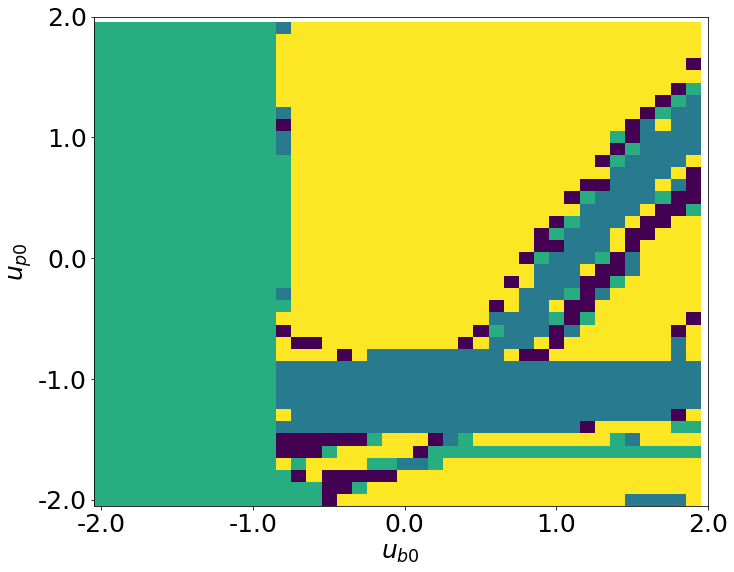

In [771]:
fig, ax = plt.subplots(figsize=(11, 9))
plt.imshow(T_uu, aspect='auto', origin='lower')
yticks = np.linspace(0,40,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$u_{p0}$')

xticks = np.linspace(0,40,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$u_{b0}$')

plt.show()

In [772]:
Bbp = 0.08
Bpbmin = 0.426
Bpbmax = 0.426
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_ss = parameters_for_Tss(args2)         

T = 14.455693983905828
sbp0 = 0.0
spb0 = 0.0
T = 14.45513401125489
sbp0 = 0.0
spb0 = 0.05
T = 14.455693983905826
sbp0 = 0.0
spb0 = 0.1
T = 14.45513401125489
sbp0 = 0.0
spb0 = 0.15000000000000002
T = 14.390864422908859
sbp0 = 0.0
spb0 = 0.2
T = 14.606326627007537
sbp0 = 0.0
spb0 = 0.25
T = 14.605766654356602
sbp0 = 0.0
spb0 = 0.30000000000000004
T = 14.606326627007538
sbp0 = 0.0
spb0 = 0.35000000000000003
T = 14.39086442290886
sbp0 = 0.0
spb0 = 0.4
T = 14.390309540918386
sbp0 = 0.0
spb0 = 0.45
T = 14.390309540918386
sbp0 = 0.0
spb0 = 0.5
T = 14.39086442290886
sbp0 = 0.0
spb0 = 0.55
T = 14.390864422908859
sbp0 = 0.0
spb0 = 0.6000000000000001
T = 14.390864422908859
sbp0 = 0.0
spb0 = 0.65
T = 14.432175132566526
sbp0 = 0.0
spb0 = 0.7000000000000001
T = 14.390309540918386
sbp0 = 0.0
spb0 = 0.75
T = 14.390309540918386
sbp0 = 0.0
spb0 = 0.8
T = 14.390864422908859
sbp0 = 0.0
spb0 = 0.8500000000000001
T = 14.390309540918386
sbp0 = 0.0
spb0 = 0.9
T = 14.390309540918386
sbp0 = 0.0
spb0 = 0.9500000

T = 14.605766654356604
sbp0 = 0.35000000000000003
spb0 = 0.35000000000000003
T = 14.390309540918388
sbp0 = 0.35000000000000003
spb0 = 0.4
T = 14.390309540918384
sbp0 = 0.35000000000000003
spb0 = 0.45
T = 14.390309540918386
sbp0 = 0.35000000000000003
spb0 = 0.5
T = 14.39086442290886
sbp0 = 0.35000000000000003
spb0 = 0.55
T = 14.390309540918386
sbp0 = 0.35000000000000003
spb0 = 0.6000000000000001
T = 14.390864422908859
sbp0 = 0.35000000000000003
spb0 = 0.65
T = 14.432175132566526
sbp0 = 0.35000000000000003
spb0 = 0.7000000000000001
T = 14.390309540918386
sbp0 = 0.35000000000000003
spb0 = 0.75
T = 14.390864422908859
sbp0 = 0.35000000000000003
spb0 = 0.8
T = 14.390309540918386
sbp0 = 0.35000000000000003
spb0 = 0.8500000000000001
T = 14.390309540918386
sbp0 = 0.35000000000000003
spb0 = 0.9
T = 14.390864422908859
sbp0 = 0.35000000000000003
spb0 = 0.9500000000000001
T = 14.45513401125489
sbp0 = 0.4
spb0 = 0.0
T = 14.45513401125489
sbp0 = 0.4
spb0 = 0.05
T = 14.45513401125489
sbp0 = 0.4
spb0 =

T = 14.43161515991559
sbp0 = 0.7000000000000001
spb0 = 0.7000000000000001
T = 14.390864422908859
sbp0 = 0.7000000000000001
spb0 = 0.75
T = 14.390864422908859
sbp0 = 0.7000000000000001
spb0 = 0.8
T = 14.390309540918386
sbp0 = 0.7000000000000001
spb0 = 0.8500000000000001
T = 14.390864422908859
sbp0 = 0.7000000000000001
spb0 = 0.9
T = 14.390309540918386
sbp0 = 0.7000000000000001
spb0 = 0.9500000000000001
T = 14.455693983905826
sbp0 = 0.75
spb0 = 0.0
T = 14.45513401125489
sbp0 = 0.75
spb0 = 0.05
T = 14.45513401125489
sbp0 = 0.75
spb0 = 0.1
T = 14.455134011254893
sbp0 = 0.75
spb0 = 0.15000000000000002
T = 14.390864422908859
sbp0 = 0.75
spb0 = 0.2
T = 14.605766654356604
sbp0 = 0.75
spb0 = 0.25
T = 14.605766654356602
sbp0 = 0.75
spb0 = 0.30000000000000004
T = 14.606326627007538
sbp0 = 0.75
spb0 = 0.35000000000000003
T = 14.390309540918388
sbp0 = 0.75
spb0 = 0.4
T = 14.390309540918384
sbp0 = 0.75
spb0 = 0.45
T = 14.390309540918386
sbp0 = 0.75
spb0 = 0.5
T = 14.390309540918388
sbp0 = 0.75
spb0 

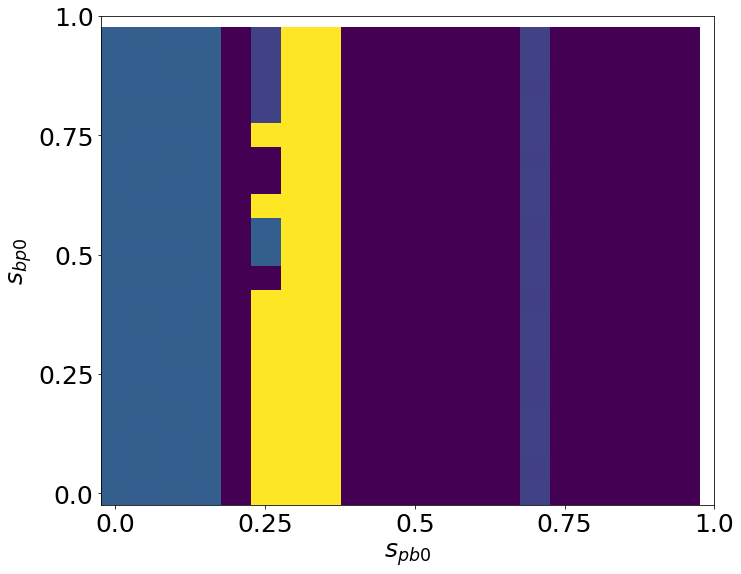

In [773]:
fig, ax = plt.subplots(figsize=(11, 9))
plt.imshow(T_ss, aspect='auto', origin='lower')
yticks = np.linspace(0,20,5)
ylabels = np.linspace(0,1,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$s_{bp0}$')

xticks = np.linspace(0,20,5)
xlabels = np.linspace(0,1,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$s_{pb0}$')

plt.show()

In [776]:
np.unique(T_uu)

array([14.27460094, 14.27517676, 14.27517676, 14.36644962, 14.3670045 ,
       14.3670045 , 14.36755938, 14.36755938, 14.41361458, 14.41361458,
       14.41416947, 14.41416947, 14.49742232, 14.49742232, 14.49798747,
       14.49798747])

T = 9.992965191987667
Parameters: (-0.5901933431909279, -1.5972694193666164)


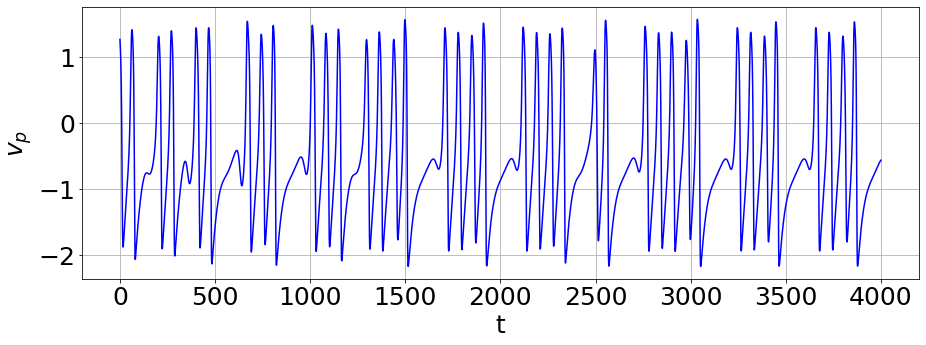

KeyboardInterrupt: 

In [753]:
Bbp = 0.08 # синаптический параметр
Bpbmin = 0.45 # синаптический параметр
Bpbmax = 0.456 # синаптический параметр
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_of_attractors(args2, 50)

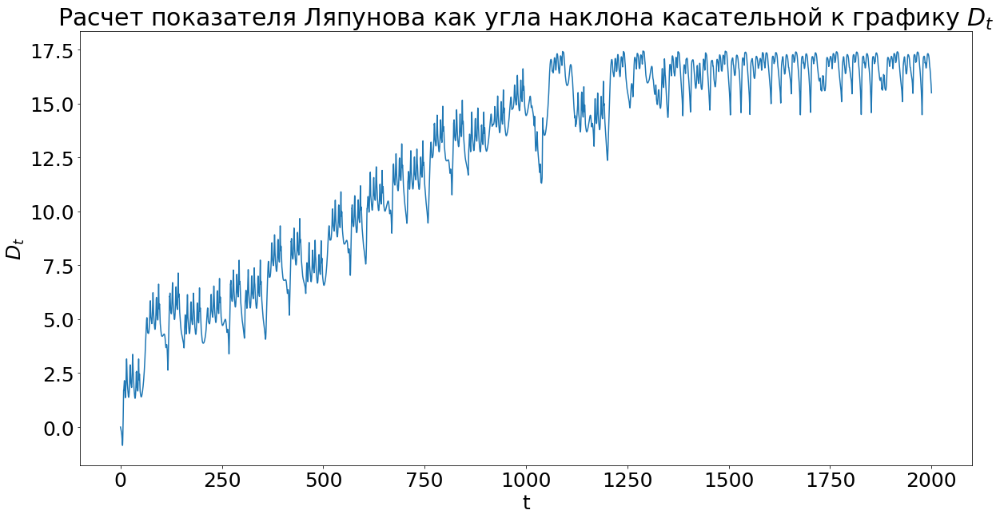

In [687]:
Bbp = 0.08
Bpb = 0.84
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=8000, nt=2**15)
ts = 8000
sol1, t = calcODE(args, *sol[-1], nt=2**15)
sol2, t = calcODE(args, *(sol[-1] - [0.0000001, 0, 0, 0, 0, 0]), nt=2**15)

plt.figure(figsize=(20, 10))
plt.plot(t, np.log(np.linalg.norm(sol1 - sol2, axis=1) / np.linalg.norm(sol1[0] - sol2[0])))
plt.title("Расчет показателя Ляпунова как угла наклона касательной к графику $D_t$")
plt.xlabel("t")
plt.ylabel("$D_t$")
plt.show()
# plt.plot(t, np.log(np.abs(sol1[:, 0] - sol2[:, 0]) / np.linalg.norm(sol1[0] - sol2[0])))
# plt.show()


/home/xomaiya/.conda/envs/ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/xomaiya/.conda/envs/ml/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


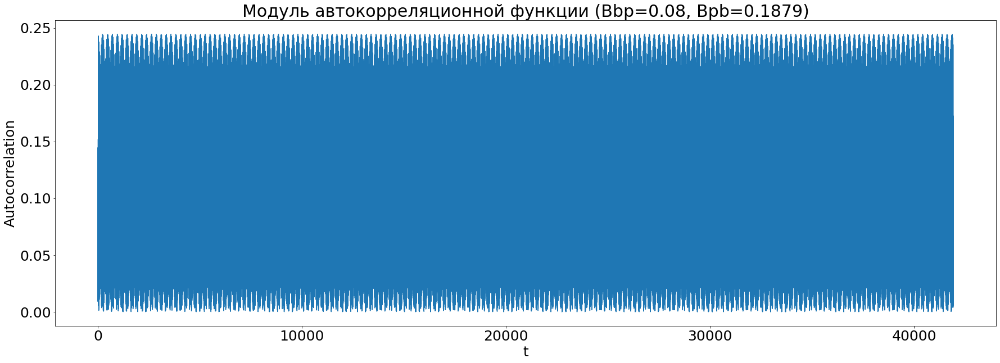

In [571]:
from tqdm.autonotebook import tqdm

PREC = 8
T = 2**20

Bbp = 0.08
Bpb = 0.5

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=T, nt=PREC * T)
sol = sol[500 * PREC:]
sol = sol - np.mean(sol, axis=0, keepdims=True) 

corrs = []
for tau in tqdm(range(0, len(sol) // 2, 100)):
    corrs.append(np.mean(sol[:tau] * sol[tau : 2 * tau]))

plt.figure(figsize=(30,10))
plt.plot(np.abs(corrs))
plt.xlabel("t")
plt.ylabel("Autocorrelation")
plt.title(f"Модуль автокорреляционной функции (Bbp=0.08, Bpb=0.1879)")
plt.show()

In [688]:
Bbp = 0.08
Bpb = 0.84
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
lyapunov_first_statistics(args, 20)

(0.048625194752815404, 0.020072776509521863)

In [46]:
Bbp = 0.08
Bpb = 0.5
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
lyapunov_spectra(args)

array([-0.00168831, -0.05096002, -0.14865587, -0.24234354, -0.50935877,
       -0.72939947])

In [48]:
Bbp = 0.08
Bpb = 0.5
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
lyapunov_first(args)

KeyboardInterrupt: 

T = 16.768475343453698
Bpb = 0.5


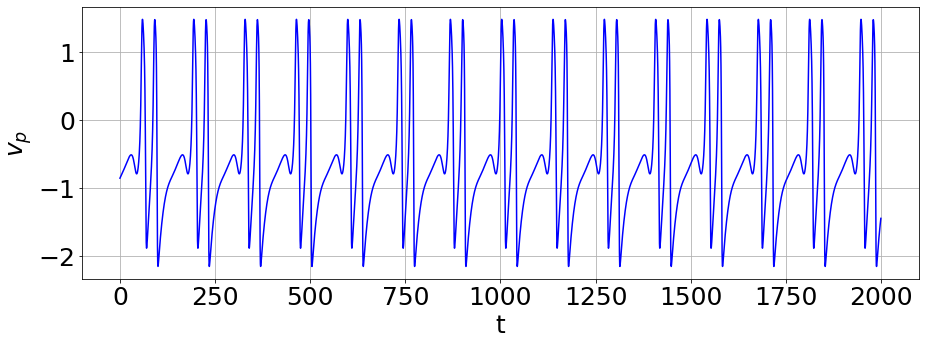

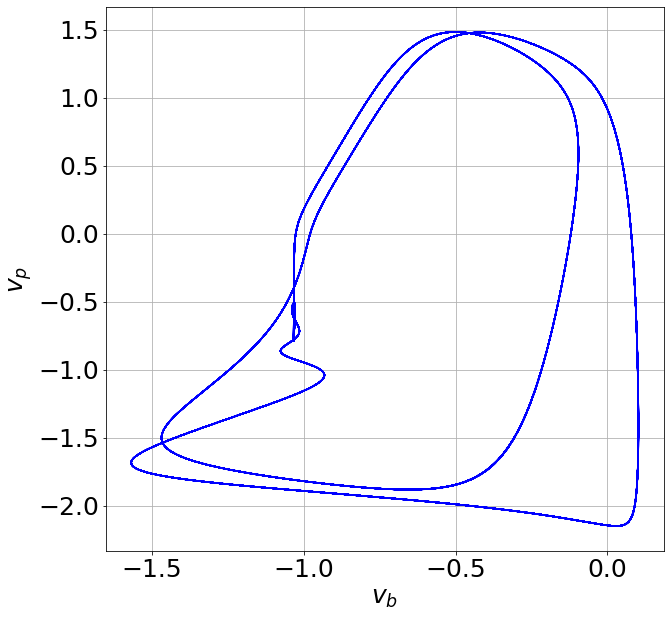

T = 16.781242339608003
Bpb = 0.502


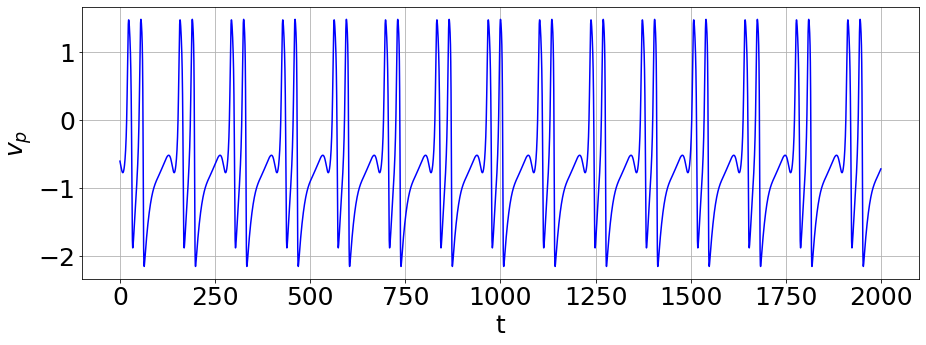

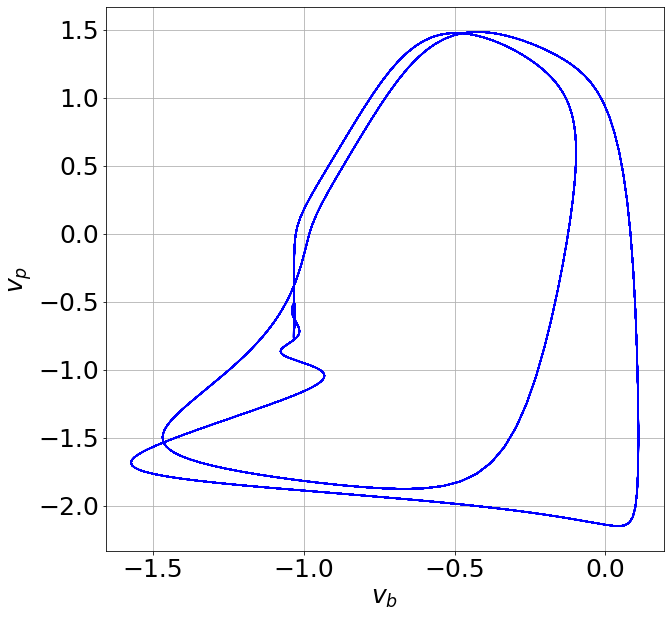

T = 16.795024892274583
Bpb = 0.504


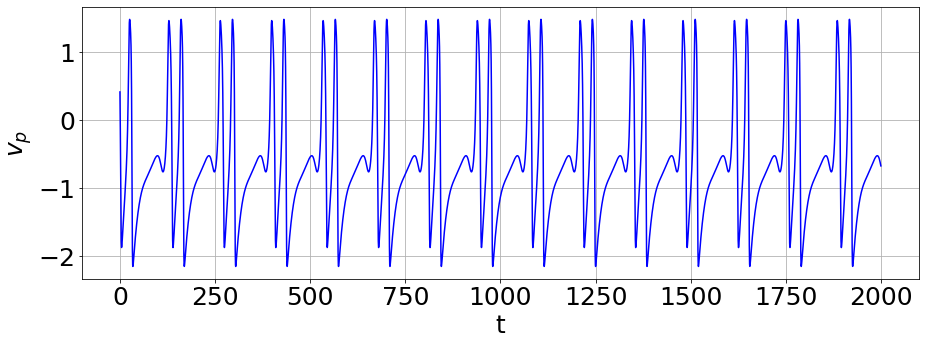

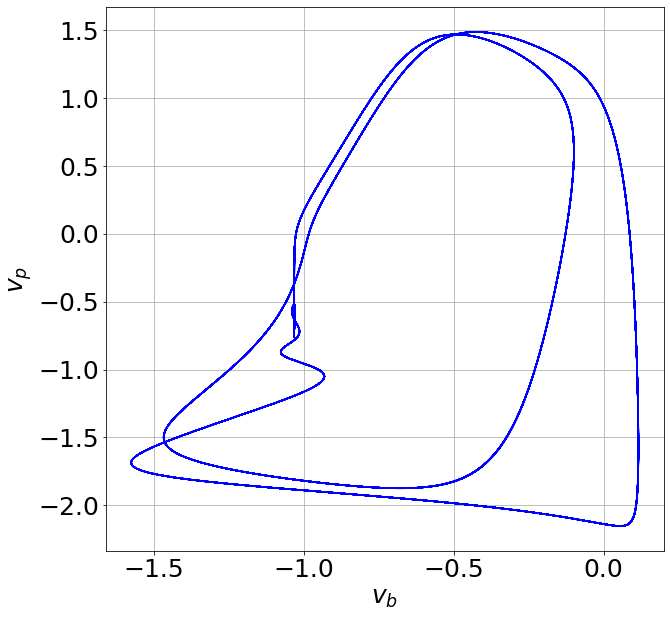

T = 16.90270893978049
Bpb = 0.506


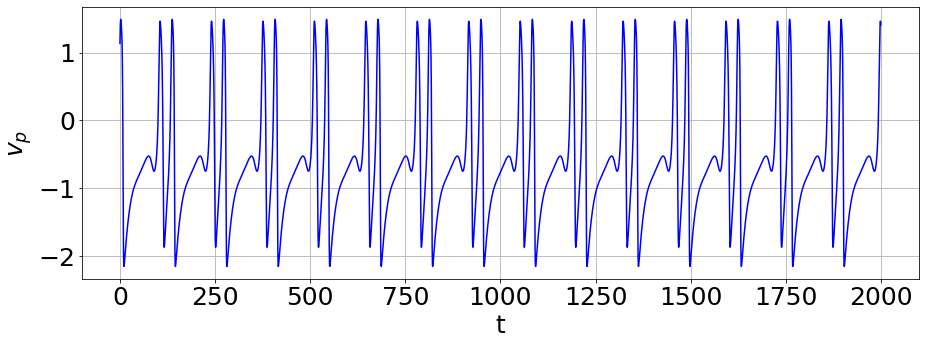

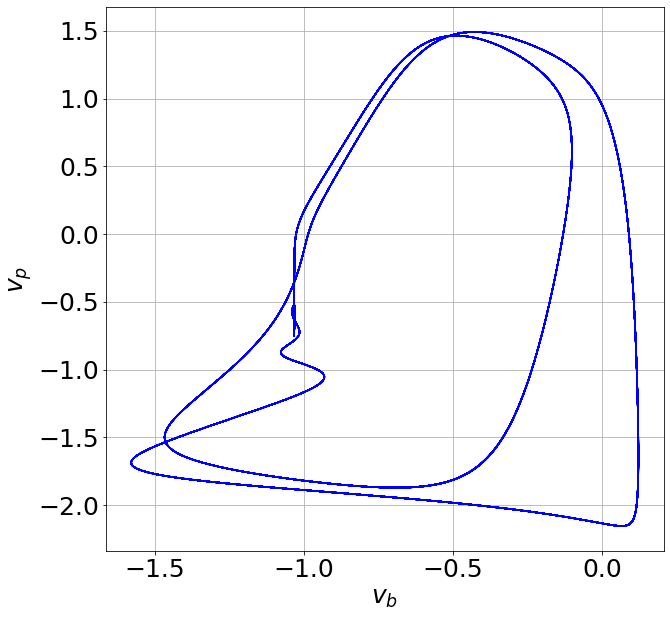

T = 16.914396879579805
Bpb = 0.508


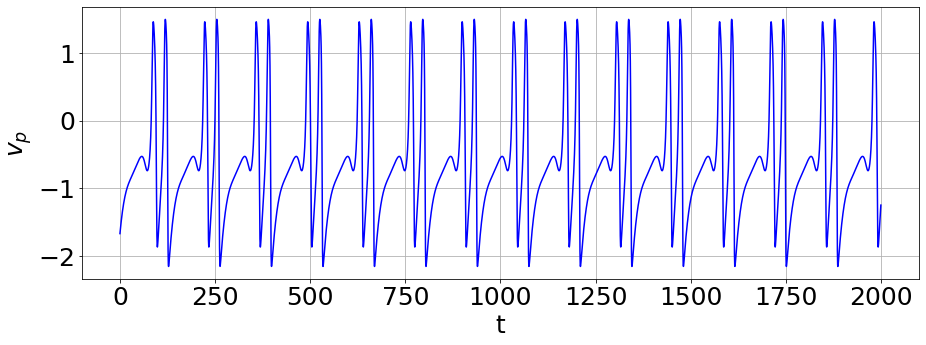

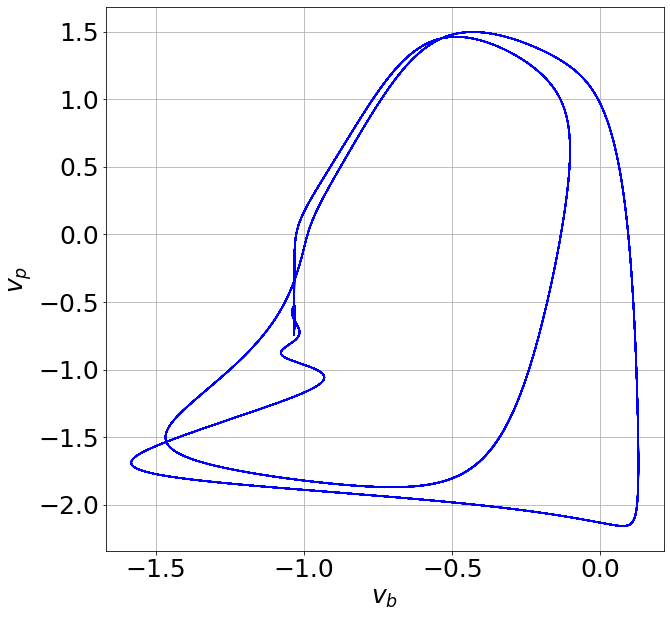

T = 16.92413682941257
Bpb = 0.51


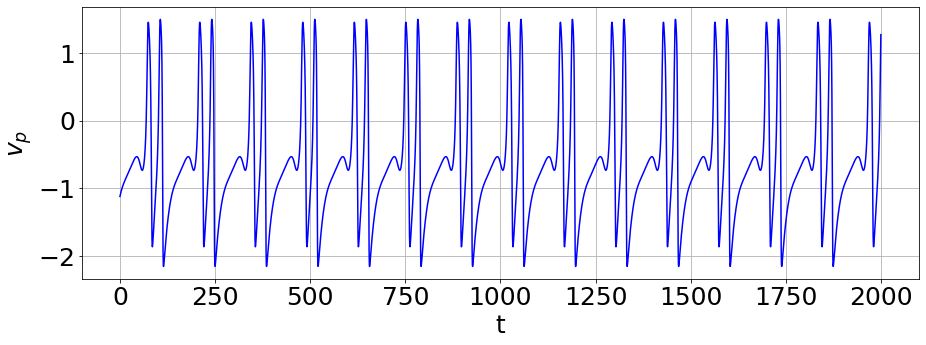

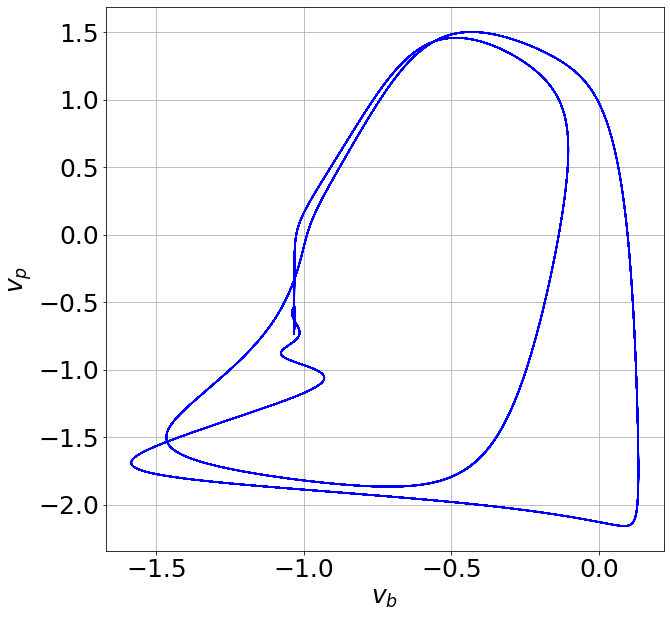

In [15]:
Bbp = 0.08
Bpbmin = 0.5
Bpbmax = 0.51


ts = 4000
nt = 2 ** 15
vp0 = 0
vb0 = 0
up0 = 0
ub0 = 0
sbp0 = 0
spb0 = 0
T = []
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bbp, vsl)
sol, t = calcODE(args, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)

for Bpb in np.arange(Bpbmin, Bpbmax, 0.002):
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
    sol, t = calcODE(args, *sol[-1], ts, nt)
    T_one = mean_T_vp(sol[:, 0], t) / 2
    print(f'T = {T_one}')
    print(f'Bpb = {Bpb}')
    plt.figure(figsize=(15, 5))
    plt.plot(np.linspace(0, ts//2, nt//4), sol[-nt//4:, 0], 'b')
    plt.xlabel('t')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()
    T.append(T_one)
    vp = sol[-nt//4:, 0]
    vb = sol[-nt//4:, 1]
    plt.figure(figsize=(10, 10))
    plt.plot(vb, vp, 'b')
    plt.xlabel('$v_b$')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()


In [ ]:
Bpb = 0.19 
Bbpmin = 0.084694
Bbpmax = 0.084694
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

T = parameters_for_T(args1)

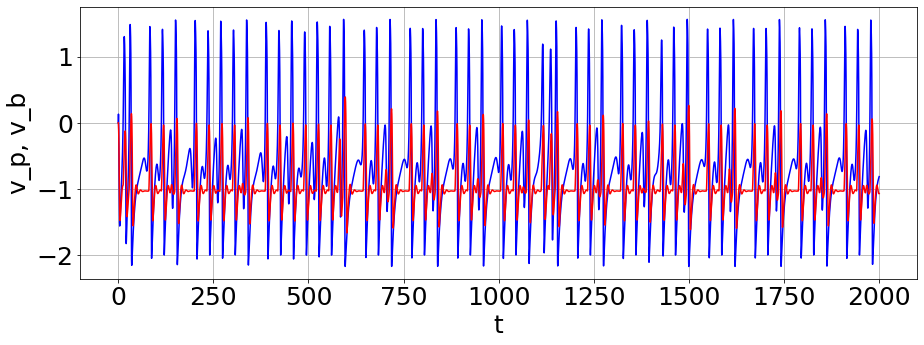

In [45]:
Bbp = 0.08
Bpb = 0.379
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

signal_draw(args, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=2000, nt=2**15)

## Далее следует исследование области при $B_{bp} = 0.08$ и $B_{pb} = 0.185-0.189$ при уменьшенном шаге по параметру Bpb (в данной области ожидаем увидеть хаос)
## Вроде как через хаос переход от 2,1b к 2 на графике, но не похоже

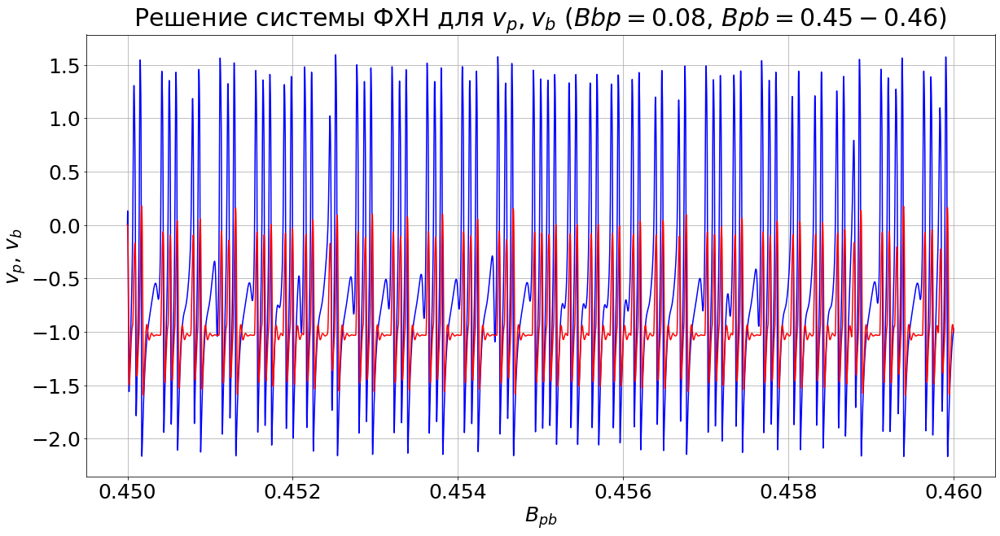

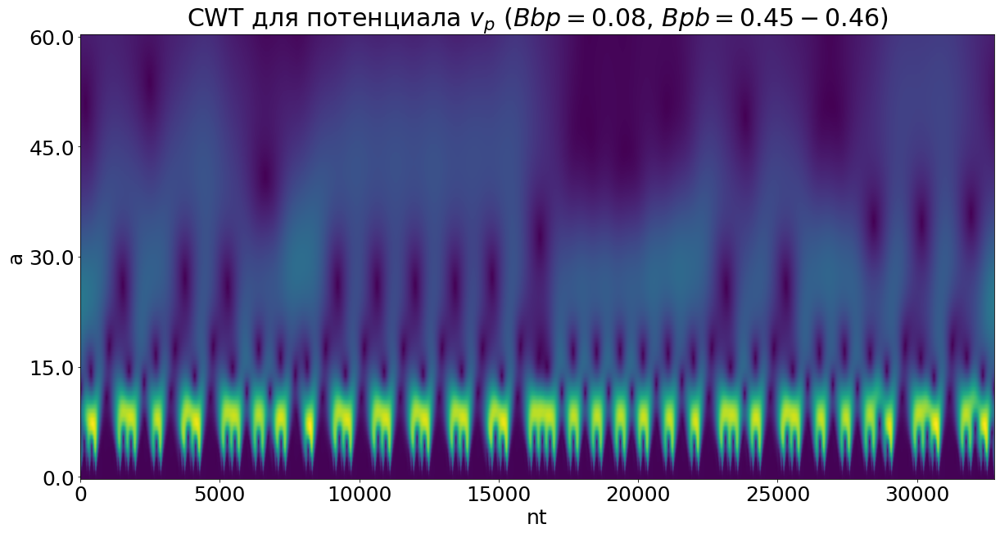

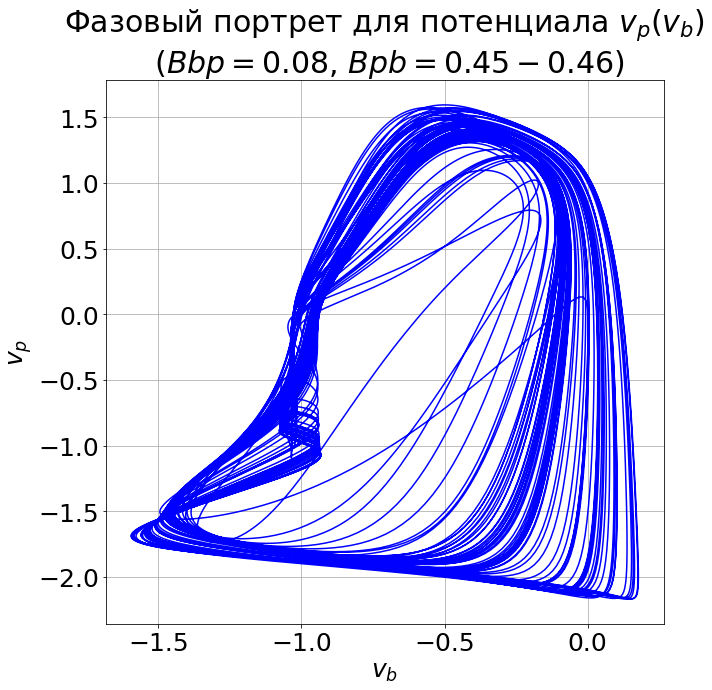

In [22]:
Bbp = 0.08 # синаптический параметр
Bpbmin = 0.45 # синаптический параметр
Bpbmax = 0.46 # синаптический параметр
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

signal_draw2(args2, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=2000, nt=2**15)

wavelet_draw(args2, scale, ts=2000, nt=2**15)

phase_portrait(args2, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=2000, nt=2**15)

## Далее рассчитаем показатель Ляпунова: 

In [21]:
Bpb_list = np.arange(0.40, 0.51, 0.01)
for Bpb in Bpb_list:
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
    print(f'Bpb = {Bpb}: {lyapunov_first_statistics(args, 10)}')

Bpb = 0.4: (0.00418030407611396, 0.0011589809724646732)
Bpb = 0.41000000000000003: (0.005059525457778326, 0.0010947326221378466)
Bpb = 0.42000000000000004: (0.006574271810308466, 0.0006561624306833804)
Bpb = 0.43000000000000005: (0.0028880970021428714, 0.0019085012797836955)
Bpb = 0.44000000000000006: (0.0009916132152623341, 0.004320848960741582)
Bpb = 0.45000000000000007: (0.007438267634612218, 0.003746165776878872)
Bpb = 0.4600000000000001: (0.0065826647200282196, 0.002039738221633131)
Bpb = 0.4700000000000001: (0.004652929006439523, 0.000638731552950525)
Bpb = 0.4800000000000001: (0.004288443007273528, 0.0024644802398898534)
Bpb = 0.4900000000000001: (0.01016351239040802, 0.0026317432070580666)
Bpb = 0.5000000000000001: (0.0028038182759430115, 0.0013028656687324484)


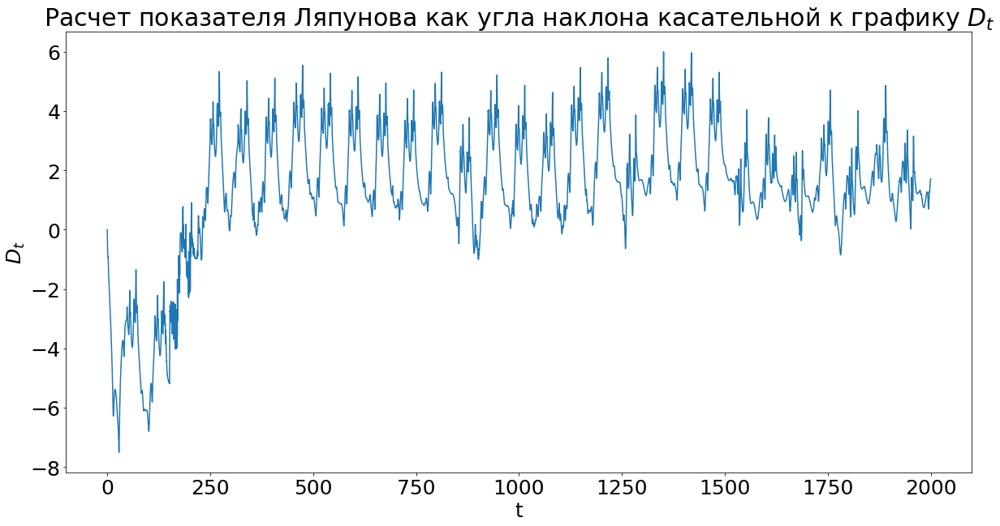

In [572]:
Bbp = 0.08
Bpb = 0.5
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, 0, 0, 0, 0, 0, 0, ts=3000, nt=2**15)
ts = 3000
sol1, t = calcODE(args, *sol[-1], nt=2**15)
sol2, t = calcODE(args, *(sol[-1] - [0.0000001, 0, 0, 0, 0, 0]), nt=2**15)

plt.figure(figsize=(20, 10))
plt.plot(t, np.log(np.linalg.norm(sol1 - sol2, axis=1) / np.linalg.norm(sol1[0] - sol2[0])))
plt.title("Расчет показателя Ляпунова как угла наклона касательной к графику $D_t$")
plt.xlabel("t")
plt.ylabel("$D_t$")
plt.show()
# plt.plot(t, np.log(np.abs(sol1[:, 0] - sol2[:, 0]) / np.linalg.norm(sol1[0] - sol2[0])))
# plt.show()


## Рассчет автокорреляционной функции

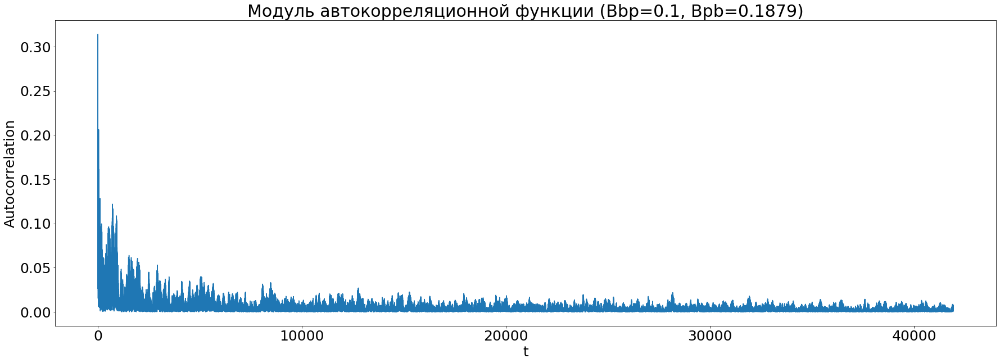

In [142]:
from tqdm.autonotebook import tqdm

PREC = 8
T = 2**20

Bbp = 0.08
Bpb = 0.1878778947368

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, 0, 0, 0, 0, 0, 0, ts=T, nt=PREC * T)
sol = sol[500 * PREC:]
sol = sol - np.mean(sol, axis=0, keepdims=True) 

corrs = []
for tau in tqdm(range(0, len(sol) // 2, 100)):
    corrs.append(np.mean(sol[:tau] * sol[tau : 2 * tau]))

plt.figure(figsize=(30,10))
plt.plot(np.abs(corrs))
plt.xlabel("t")
plt.ylabel("Autocorrelation")
plt.title(f"Модуль автокорреляционной функции (Bbp=0.08, Bpb=0.1879)")
plt.show()

/home/xomaiya/.conda/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  """Entry point for launching an IPython kernel.


/home/xomaiya/.conda/envs/ml/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/xomaiya/.conda/envs/ml/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


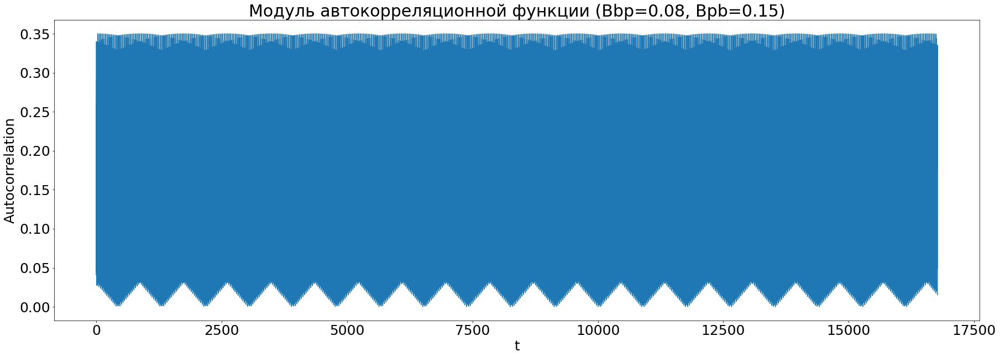

In [8]:
from tqdm.autonotebook import tqdm

PREC = 8
T = 2**20

Bbp = 0.08
Bpb = 0.15

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

sol, t = calcODE(args, 05, 0, 0, 0, 0, 0, ts=T, nt=PREC * T)
sol = sol[500 * PREC:]
sol = sol - np.mean(sol, axis=0, keepdims=True) 

corrs = []
for tau in tqdm(range(0, len(sol) // 5, 100)):
    corrs.append(np.mean(sol[:tau] * sol[tau : 2 * tau]))

plt.figure(figsize=(30,10))
plt.plot(np.abs(corrs))
plt.xlabel("t")
plt.ylabel("Autocorrelation")
plt.title(f"Модуль автокорреляционной функции (Bbp={Bbp}, Bpb={Bpb})")
plt.show()

## Найдем характерные периоды колебаний аттракторов: гистограммы ниже по порядку: область до предполагаемого хаоса, область хаоса и область после хаоса для параметров B

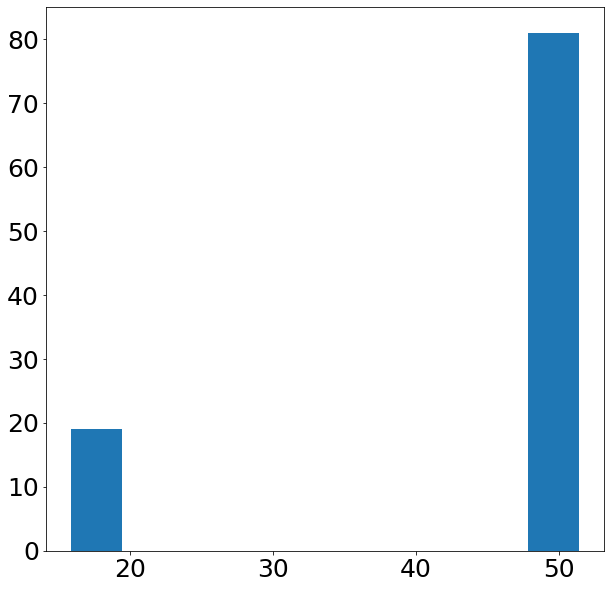

In [14]:
Bbp = 0.08 
Bpbmin = 0.16 
Bpbmax = 0.16 
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_of_attractors(args2, 100)

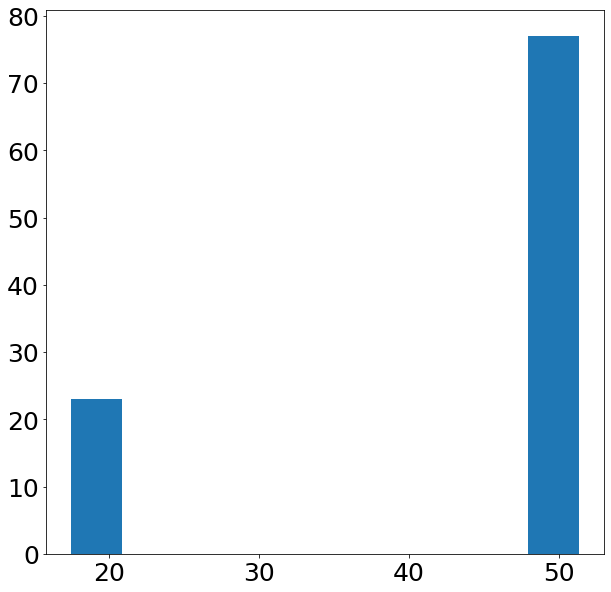

In [15]:
Bbp = 0.08 
Bpbmin = 0.183 
Bpbmax = 0.183 
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_of_attractors(args2, 100)

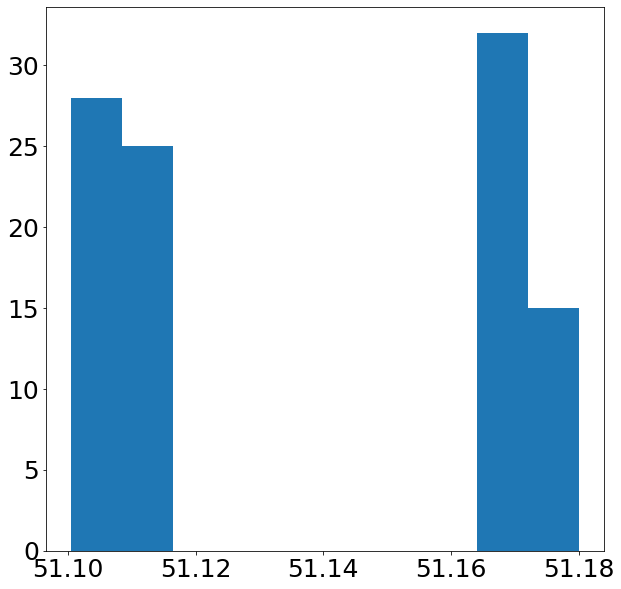

In [16]:
Bbp = 0.08 
Bpbmin = 0.21 
Bpbmax = 0.21 
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

T_of_attractors(args2, 100)

## Построим траектории для разных начальных условий для $v_p$: для всех положительных одинаковое поведение системы как описано выше, для отрицательных условий переходов нет

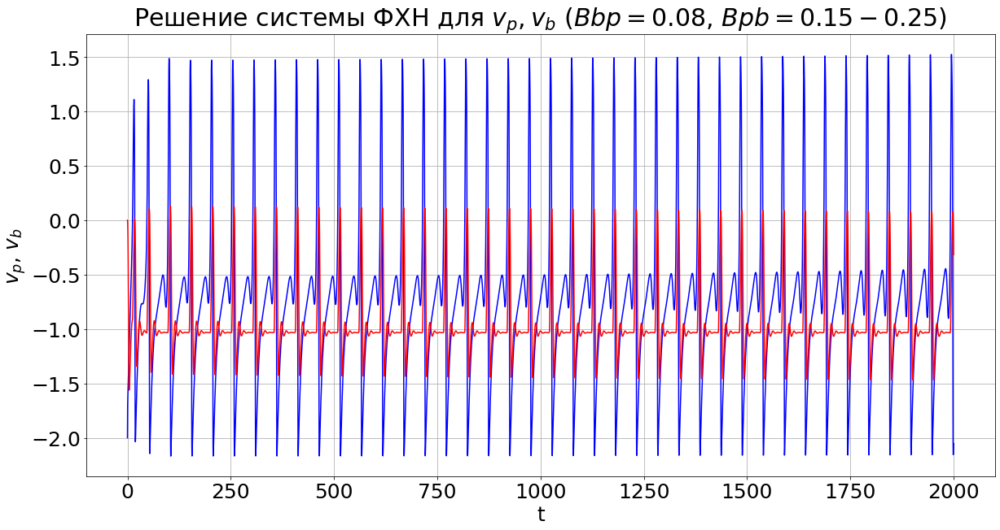

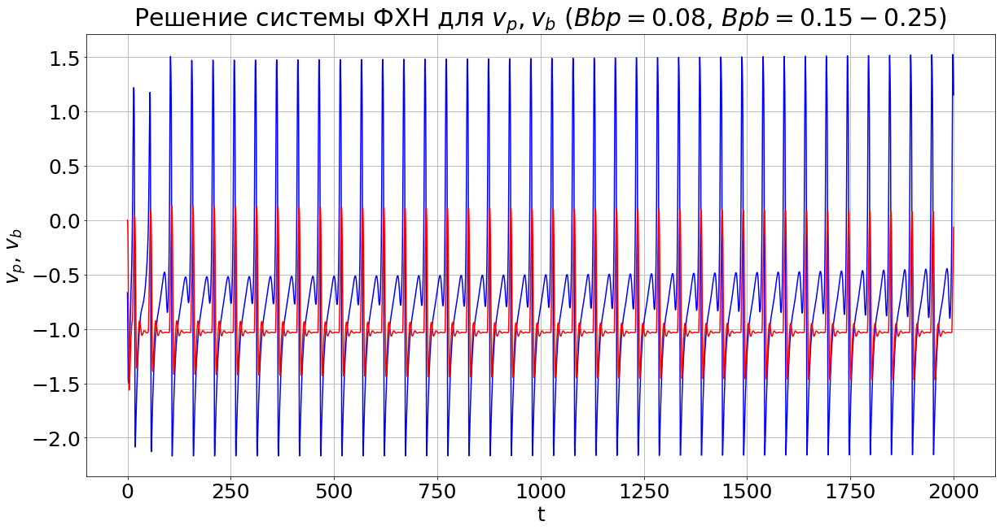

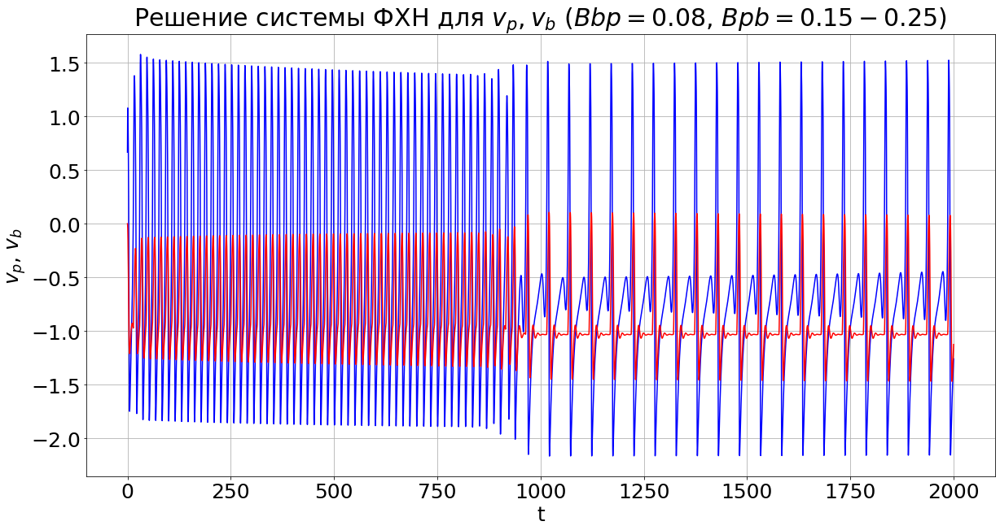

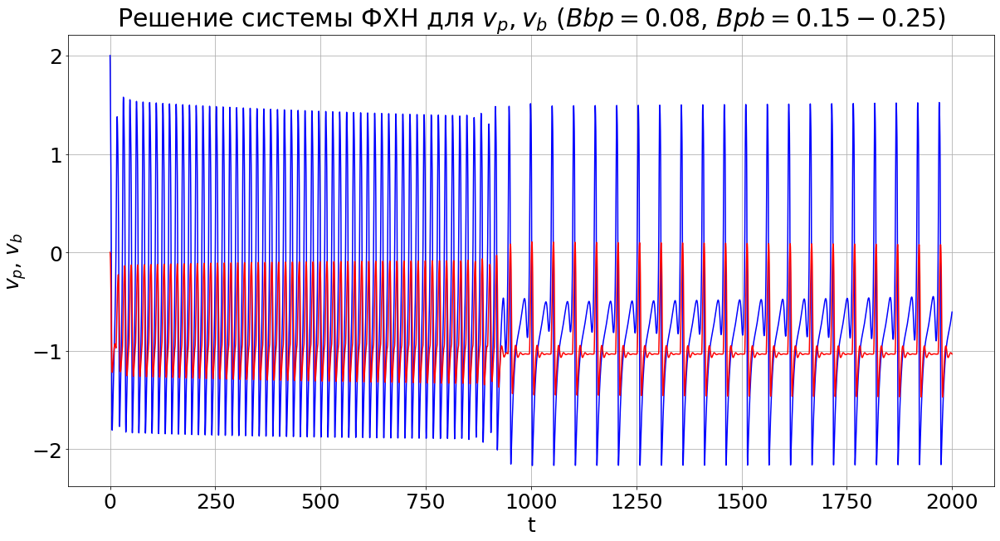

In [17]:
Bbp = 0.08 
Bpbmin = 0.15 
Bpbmax = 0.25 
args2 = (Iext, G, Ein, Eex, eps, a, b, A, Bpbmin, Bpbmax, Bbp, vsl)

vp0s = np.linspace(-2, 2, 4)
for vp0 in vp0s:
    signal_draw2(args2, vp0, ts=2000, nt=2**15)